In [2]:
import reverse_geocoder

In [3]:
state_names = "Texas"
    #get the metadata for the latitude and longitude coordinates
results = reverse_geocoder.search((25.10365,-92.6305 ))

    #check if the location is a US state (the 'admin1' variable is where US states are listed)
    #print(i)
if results[0]['admin1']==state_names:
        print(1)
else:
        print(0)

Loading formatted geocoded file...
1


In [4]:
def get_coords(top_left, bottom_right):

    coord = [top_left[0], top_left[1]]
    lat = top_left[0]
    lon = top_left[1]
    coord = [lat, lon]
    coords = []
    while True:
        index = 0
        if lat > bottom_right[0]:
            lat = coord[0] - 0.054
        else:
            if lon < bottom_right[1]:
                lon = coord[1] + 0.054
                lat = top_left[0]
            else:
                break

        coord = [lat, lon]
        coords.append(coord)
    
    return coords

In [5]:
a=get_coords([36.70365, -107.2705],[25.12539, -92.59277])

In [6]:
len(a)

58967

In [7]:
pip install basemap

Note: you may need to restart the kernel to use updated packages.


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [9]:
import shapefile
from shapely.geometry import shape, Point

# read your shapefile
r = shapefile.Reader("Texas_State_Boundary/State.shp")

# get the shapes
shapes = r.shapes()

# build a shapely polygon from your shape
polygon = shape(shapes[0])    

def check(lon, lat):
    # build a shapely point from your geopoint
    point = Point(lon, lat)

    # the contains function does exactly what you want
    return polygon.contains(point)

In [10]:
a

[[36.64965, -107.2705],
 [36.59565, -107.2705],
 [36.54165, -107.2705],
 [36.487649999999995, -107.2705],
 [36.43364999999999, -107.2705],
 [36.37964999999999, -107.2705],
 [36.32564999999999, -107.2705],
 [36.27164999999999, -107.2705],
 [36.217649999999985, -107.2705],
 [36.16364999999998, -107.2705],
 [36.10964999999998, -107.2705],
 [36.05564999999998, -107.2705],
 [36.00164999999998, -107.2705],
 [35.947649999999975, -107.2705],
 [35.89364999999997, -107.2705],
 [35.83964999999997, -107.2705],
 [35.78564999999997, -107.2705],
 [35.731649999999966, -107.2705],
 [35.677649999999964, -107.2705],
 [35.62364999999996, -107.2705],
 [35.56964999999996, -107.2705],
 [35.51564999999996, -107.2705],
 [35.461649999999956, -107.2705],
 [35.407649999999954, -107.2705],
 [35.35364999999995, -107.2705],
 [35.29964999999995, -107.2705],
 [35.24564999999995, -107.2705],
 [35.191649999999946, -107.2705],
 [35.137649999999944, -107.2705],
 [35.08364999999994, -107.2705],
 [35.02964999999994, -107.27

In [11]:
df = pd.DataFrame(a, columns = ['Latitude', 'Longitude'])

In [12]:
df

,Latitude,Longitude
0,36.64965,-107.2705
1,36.59565,-107.2705
2,36.54165,-107.2705
3,36.48765,-107.2705
4,36.43365,-107.2705
...,...,...
58962,25.30965,-92.5825
58963,25.25565,-92.5825
58964,25.20165,-92.5825
58965,25.14765,-92.5825


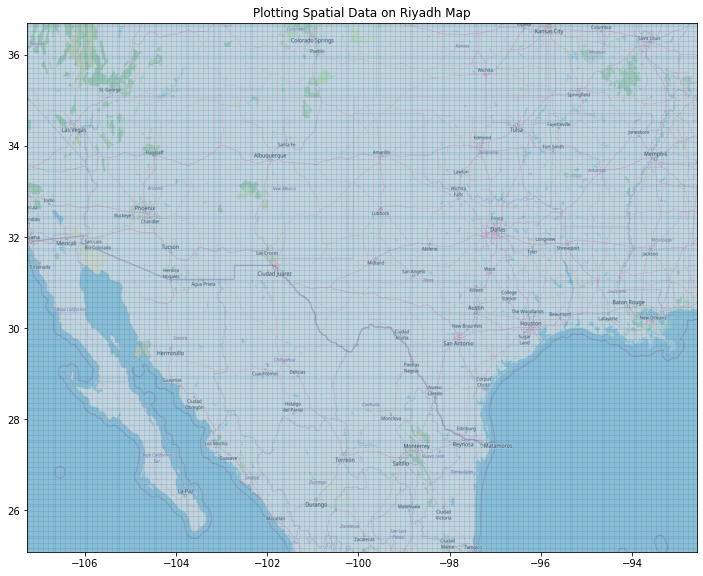

In [13]:
BBox = (df.Longitude.min(),df.Longitude.max(),df.Latitude.min(),df.Latitude.max())
IMG=plt.imread("map.png")
fig, ax = plt.subplots(figsize = (12,12))
ax.scatter(df.Longitude, df.Latitude, zorder=1, alpha= .1, s=10)
ax.set_title('Plotting Spatial Data on Riyadh Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(IMG, zorder=0, extent = BBox, aspect= 'equal')

C:\Users\ishan\anaconda3\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


KeyboardInterrupt: 

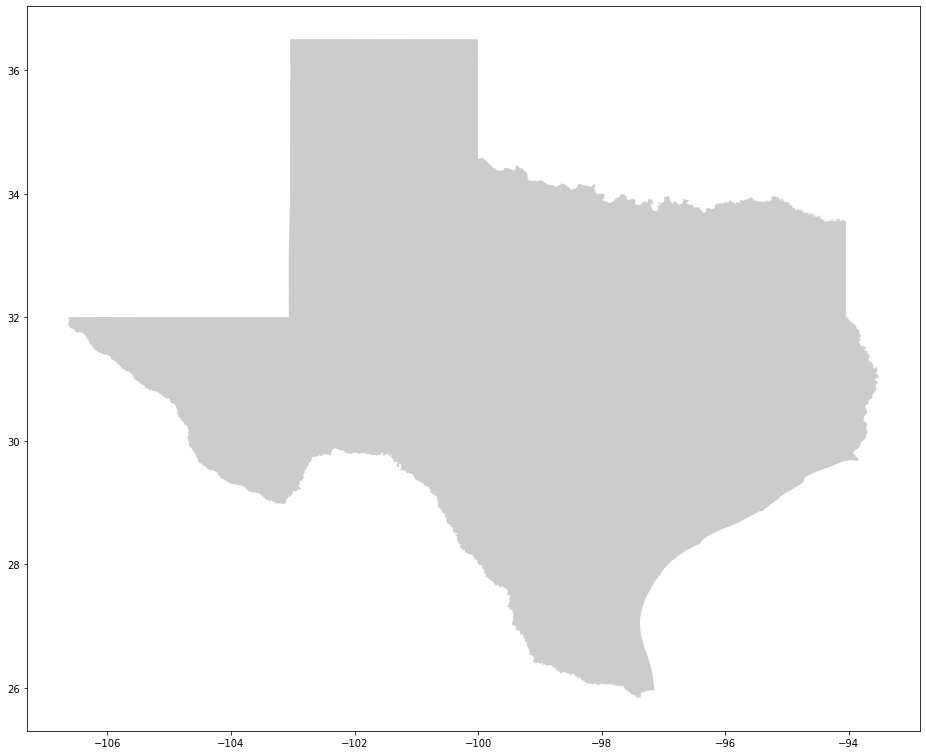

In [14]:
texas = gpd.read_file("Texas_State_Boundary/State.shp")
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(df["Longitude"],df["Latitude"])]
geo_df = gpd.GeoDataFrame(df,crs=crs,geometry = geometry)
fig, ax = plt.subplots(figsize = (16,16))
texas.plot(ax=ax, alpha = 0.4, color='grey')
geo_df.plot(ax=ax,aspect=1, alpha=0.2)

In [ ]:
import shapefile
from shapely.geometry import shape, Point

# read your shapefile
r = shapefile.Reader("Texas_State_Boundary/State.shp")

# get the shapes
shapes = r.shapes()

# build a shapely polygon from your shape
polygon = shape(shapes[0])    

def check(lon, lat):
    # build a shapely point from your geopoint
    point = Point(lon, lat)

    # the contains function does exactly what you want
    return polygon.contains(point)

In [ ]:
b_a=[]
for i,v in df.iterrows():
    print(i)
    if check(df["Longitude"][i],df["Latitude"][i])==False:
        b_a.append(0)
    else:
        b_a.append(1)

In [ ]:
df["InTexas"]=""

In [ ]:
for i, v in df.iterrows():
    df["InTexas"][i]=b_a[i]

In [ ]:
df

In [ ]:
df=df[df["InTexas"]==1]

In [ ]:
df

In [ ]:
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(df["Longitude"],df["Latitude"])]
geo_df = gpd.GeoDataFrame(df,crs=crs,geometry = geometry)
fig, ax = plt.subplots(figsize = (16,16))
texas.plot(ax=ax, alpha = 0.4, color='grey')
geo_df.plot(ax=ax,aspect=1, alpha=0.2)

In [ ]:
df=df.reset_index()

In [ ]:
df_firestation = pd.read_csv("firestations_f.csv")
fire_mer_df=pd.read_csv("Merged_dur_firestations.csv")
fire_mer_df=pd.read_csv("Merged_dur_firestations.csv")
forest_df=pd.read_csv("forest_merged_v5.csv")
forest_df=forest_df[forest_df["INVYR"]==2015]
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(df["Longitude"],df["Latitude"])]
geo_df = gpd.GeoDataFrame(df,crs=crs,geometry = geometry)
geometry_f = [Point(xy) for xy in zip(df_firestation["Longitude"],df_firestation["Latitude"])]
geo_df2 = gpd.GeoDataFrame(df_firestation,crs=crs,geometry = geometry_f)
geometry_fire = [Point(xy) for xy in zip(fire_mer_df["LONGITUDE"],fire_mer_df["LATITUDE"])]
geo_df3 = gpd.GeoDataFrame(fire_mer_df,crs=crs,geometry = geometry_fire)
geometry_forest = [Point(xy) for xy in zip(forest_df["LON"],forest_df["LAT"])]
geo_df4 = gpd.GeoDataFrame(forest_df,crs=crs,geometry = geometry_forest)
fig, ax = plt.subplots(figsize = (16,16))
texas.plot(ax=ax, alpha = 0.4, color='grey')
geo_df.plot(ax=ax,aspect=1, alpha=0.2)
geo_df2.plot(ax=ax,aspect=1, alpha=0.3,color='black',label="firestation")
geo_df3.plot(ax=ax,aspect=1, alpha=0.2,color='RED',label='fire')
geo_df4.plot(ax=ax,aspect=1, alpha=0.05,color='green',label='forest')
plt.legend(prop={'size':15})

In [ ]:
df

In [ ]:
df.to_csv("grid2.csv")

### Distance Matrix

In [ ]:
from geopy.distance import great_circle

In [ ]:
from scipy.spatial import distance
coords=[(df["Latitude"][i],df["Longitude"][i]) for i,v in df.iterrows()]

DIST=distance.cdist(coords, coords, 'euclidean')

In [ ]:
DIST

In [59]:
DIST[0]

array([ 0.        ,  0.07636753,  0.054     , ..., 13.0898495 ,
       13.09653084, 13.1040989 ])

In [1]:
DIST

NameError: name 'DIST' is not defined

### Closest Grid Point to each fire location

In [60]:
fire_mer_df.columns

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'FOD_ID',
       'FPA_ID', 'FIRE_NAME', 'FIRE_YEAR', 'DISCOVERY_DOY', 'DISCOVERY_TIME',
       'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DOY', 'CONT_TIME',
       'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE', 'LONGITUDE', 'STATE',
       'd_month', 'd_day', 'd_hour', 'd_min', 'c_month', 'c_day', 'c_hour',
       'c_min', 'temp_start', 'dewPointTemp_start', 'RelHumidity_start',
       'Windspeed_start', 'FeltTemp_start', 'Days_dur', 'Hours_dur',
       'Minutes_dur', 'Days_dur_f', 'Closest_fireststaion_dist',
       'Resources_available', 'Closest_firestations', 'geometry',
       'GRID_INDEX'],
      dtype='object')

In [112]:
fire_mer_df.columns

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'FOD_ID',
       'FPA_ID', 'FIRE_NAME', 'FIRE_YEAR', 'DISCOVERY_DOY', 'DISCOVERY_TIME',
       'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DOY', 'CONT_TIME',
       'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE', 'LONGITUDE', 'STATE',
       'd_month', 'd_day', 'd_hour', 'd_min', 'c_month', 'c_day', 'c_hour',
       'c_min', 'temp_start', 'dewPointTemp_start', 'RelHumidity_start',
       'Windspeed_start', 'FeltTemp_start', 'Days_dur', 'Hours_dur',
       'Minutes_dur', 'Days_dur_f', 'Closest_fireststaion_dist',
       'Resources_available', 'Closest_firestations', 'geometry',
       'GRID_INDEX'],
      dtype='object')

In [114]:
fire_mer_df=fire_mer_df.drop(["GRID_INDEX"],axis=1)

In [116]:
fire_mer_df["grid_id"]=""

In [79]:
def closest_node(node, nodes):
    a=distance.cdist([node], nodes)
    return np.argmin(a,axis=1)
c_grid_fire=[]
for i, v in fire_mer_df.iterrows():
    c_grid_fire.append(closest_node([fire_mer_df['LATITUDE'][i],fire_mer_df['LONGITUDE'][i]],coords))


In [87]:
len(c_grid_fire),len(np. unique(c_grid_fire))

(13954, 4422)

In [80]:
int(c_grid[0])

22057

In [117]:
for i,v in fire_mer_df.iterrows():
    fire_mer_df["grid_id"][i]=int(c_grid_fire[i])

<ipython-input-117-90e9c88b03f2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fire_mer_df["grid_id"][i]=int(c_grid_fire[i])


In [119]:
fire_mer_df.to_csv("fire_grid.csv")

### Closest Grid Point to each firestation

In [81]:
def closest_node(node, nodes):
    a=distance.cdist([node], nodes)
    return np.argmin(a,axis=1)
c_grid_firestation=[]
for i, v in df_firestation.iterrows():
    c_grid_firestation.append(closest_node([df_firestation['Latitude'][i],df_firestation['Longitude'][i]],coords))

In [82]:
c_grid_firestation

[array([16338], dtype=int64),
 array([18779], dtype=int64),
 array([20520], dtype=int64),
 array([19946], dtype=int64),
 array([20335], dtype=int64),
 array([17110], dtype=int64),
 array([4959], dtype=int64),
 array([10071], dtype=int64),
 array([18862], dtype=int64),
 array([5232], dtype=int64),
 array([14298], dtype=int64),
 array([17532], dtype=int64),
 array([14562], dtype=int64),
 array([2942], dtype=int64),
 array([14949], dtype=int64),
 array([21384], dtype=int64),
 array([14541], dtype=int64),
 array([13443], dtype=int64),
 array([12559], dtype=int64),
 array([19735], dtype=int64),
 array([11230], dtype=int64),
 array([20258], dtype=int64),
 array([15735], dtype=int64),
 array([14512], dtype=int64),
 array([17849], dtype=int64),
 array([9247], dtype=int64),
 array([18177], dtype=int64),
 array([1482], dtype=int64),
 array([20778], dtype=int64),
 array([13943], dtype=int64),
 array([16748], dtype=int64),
 array([20547], dtype=int64),
 array([15429], dtype=int64),
 array([4934], 

In [91]:
df_firestation["grid_id"]=""

In [93]:
for i,v in df_firestation.iterrows():
    df_firestation["grid_id"][i]=int(c_grid_firestation[i])

<ipython-input-93-67981054403c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_firestation["grid_id"][i]=int(c_grid_firestation[i])


In [94]:
df_firestation.to_csv("firestation_grid_comb.csv")

In [88]:
len(c_grid_firestation),len(np.unique(c_grid_firestation))

(1840, 1762)

##### Closest Grid Point to each fOREST

In [104]:
forest_df=pd.read_csv("forest_merged_v5.csv")

In [105]:
def closest_node(node, nodes):
    a=distance.cdist([node], nodes)
    return np.argmin(a,axis=1)
c_grid_forest=[]
for i, v in forest_df.iterrows():
    c_grid_forest.append(closest_node([forest_df['LAT'][i],forest_df['LON'][i]],coords))

In [106]:
len(c_grid_forest)

176087

In [107]:
forest_df["grid_id"]=""

In [108]:
for i,v in forest_df.iterrows():
    forest_df["grid_id"][i]=int(c_grid_forest[i])

<ipython-input-108-6bfb47715dc5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forest_df["grid_id"][i]=int(c_grid_forest[i])


In [110]:
forest_df.to_csv("forest_grid.csv")

### ########## EXTRA ##################

In [70]:
distance.cdist([(fire_mer_df['LATITUDE'][0],fire_mer_df['LONGITUDE'][0])], coords)

array([[12.42831106, 12.37815269, 12.37443097, ...,  0.67082713,
         0.66824893,  0.68295844]])

In [67]:
(c_grid)

13954

In [50]:
Closest_grid_fire=[]
for i, v in fire_mer_df.iterrows():
    #grid_f=[]
    d_ini=10000
    index=0
    for j,k in df.iterrows():
        d=(great_circle((fire_mer_df['LATITUDE'][i],fire_mer_df['LONGITUDE'][i]),(df['Latitude'][j],df['Longitude'][j])).km)
        if d<=d_ini:
            d_ini=d
            index=j
        
    print(i)
    Closest_grid_fire.append((index,d_ini))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254


KeyboardInterrupt: 

In [62]:
len(Closest_grid)

13954

In [63]:
df_firestation["grid_id"]=""

In [95]:
Closest_grid_f=[]
for i, v in df_firestation.iterrows():
    #grid_f=[]
    d_ini=10000
    index=0
    for j,k in df.iterrows():
        d=(great_circle((df_firestation['Latitude'][i],df_firestation['Longitude'][i]),(df['Latitude'][j],df['Longitude'][j])).km)
        if d<=d_ini:
            d_ini=d
            index=j
        
    print(i)
    Closest_grid_f.append((index,d_ini))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [99]:
Closest_grid_f

[(16338, 1.4866245090160066),
 (18779, 2.664748846735152),
 (20520, 2.3043350540610135),
 (19946, 1.902469121012318),
 (20335, 2.638986334033399),
 (17110, 1.5645978243409762),
 (4959, 2.693440907338032),
 (10071, 2.64424157253172),
 (18862, 1.3659220658968176),
 (5232, 2.122799952995497),
 (14298, 2.3096797990639364),
 (17532, 2.1197776659571907),
 (14562, 2.8628227118960403),
 (2942, 3.1758091173822596),
 (14949, 2.1481090073749547),
 (21384, 2.1100300127074405),
 (14541, 2.470060992802176),
 (13443, 1.897861534307087),
 (12559, 0.5396191327706212),
 (19735, 3.5375196790685086),
 (11230, 2.917579110920241),
 (20258, 2.7389899716056707),
 (15735, 1.3285332140629869),
 (14512, 2.4400596622343325),
 (17849, 1.8252286011715988),
 (9247, 2.233661442594028),
 (18177, 2.3079400731958692),
 (1482, 3.0990613172685166),
 (20778, 2.5700774387394034),
 (13943, 0.9475651196166809),
 (16748, 2.8001409213711024),
 (20547, 1.185564288789031),
 (15429, 1.771402128548713),
 (4934, 3.034667069125946),


In [135]:
Closest_grid_f

[(4730, 0.8710992282459593),
 (5397, 4.134595965517288),
 (5979, 4.912667262624836),
 (5770, 5.730595150041809),
 (5929, 6.24435278020974),
 (4942, 2.0566619483616004),
 (1378, 4.028363647580848),
 (2888, 5.979294139610815),
 (5443, 3.777177701710247),
 (1525, 4.7995693581292285),
 (4106, 0.3264148231679524),
 (5051, 5.611961675372052),
 (4246, 6.96302132096801),
 (831, 3.4253961991790924),
 (4376, 4.729219344023331),
 (6211, 1.8186678855748377),
 (4236, 4.487433259705418),
 (3884, 2.1587621343113),
 (3643, 2.240464985462272),
 (5707, 3.590596230007344),
 (3232, 3.757274131188999),
 (5888, 4.1127454019629095),
 (4563, 3.0295863944471155),
 (4221, 5.509597364047555),
 (5166, 0.671525895863644),
 (2659, 2.7330712987047883),
 (5231, 3.071515536604989),
 (419, 5.17070016165552),
 (6021, 5.078974263814374),
 (4075, 5.166817981245351),
 (4873, 3.8409735156675184),
 (5944, 3.0376820301296075),
 (4478, 5.495938693849953),
 (1364, 2.840754453204349),
 (1045, 4.2830078986268125),
 (6220, 3.54551

In [65]:
 ######################################
# NEED TO ADD 4 CORNER POINTS TO EACH GRID (CAN PASS A LIST IN A NEW COLUMN)
# CODE TO IDENTIFY IF A POINT FALLS IN GRID BASED ON 4 CORNER POINTS 
#########################################

In [66]:
df

,index,Latitude,Longitude,geometry,InTexas
0,866,31.90365,-106.5705,POINT (-106.57050 31.90365),1
1,983,31.90365,-106.4705,POINT (-106.47050 31.90365),1
2,984,31.80365,-106.4705,POINT (-106.47050 31.80365),1
3,1100,31.90365,-106.3705,POINT (-106.37050 31.90365),1
4,1101,31.80365,-106.3705,POINT (-106.37050 31.80365),1
...,...,...,...,...,...
6529,15971,30.70365,-93.6705,POINT (-93.67050 30.70365),1
6530,16084,31.10365,-93.5705,POINT (-93.57050 31.10365),1
6531,16085,31.00365,-93.5705,POINT (-93.57050 31.00365),1
6532,16086,30.90365,-93.5705,POINT (-93.57050 30.90365),1


In [67]:
df["left_upper"]=""
df["right_upper"]=""
df["left_bottom"]=""
df["right_bottom"]=""

In [72]:
for i, v in df.iterrows():
    df["left_upper"][i]=(df["Latitude"][i]+0.1/2,df['Longitude'][i]-0.1/2)
    df["right_upper"][i]=(df["Latitude"][i]+0.1/2,df['Longitude'][i]+0.1/2)
    df["left_bottom"][i]=(df["Latitude"][i]-0.1/2,df['Longitude'][i]-0.1/2)
    df["right_bottom"][i]=(df["Latitude"][i]-0.1/2,df['Longitude'][i]+0.1/2)

<ipython-input-72-7d3b021b6a26>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["left_upper"][i]=(df["Latitude"][i]+0.1/2,df['Longitude'][i]-0.1/2)
<ipython-input-72-7d3b021b6a26>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["right_upper"][i]=(df["Latitude"][i]+0.1/2,df['Longitude'][i]+0.1/2)
<ipython-input-72-7d3b021b6a26>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["left_bottom"][i]=(df["Latitude"][i]-0.1/2,df['Lon

In [73]:
df

,index,Latitude,Longitude,geometry,InTexas,left_upper,right_upper,left_bottom,right_bottom
0,866,31.90365,-106.5705,POINT (-106.57050 31.90365),1,"(31.953649999999936, -106.62050000000004)","(31.953649999999936, -106.52050000000004)","(31.853649999999934, -106.62050000000004)","(31.853649999999934, -106.52050000000004)"
1,983,31.90365,-106.4705,POINT (-106.47050 31.90365),1,"(31.953649999999936, -106.52050000000004)","(31.953649999999936, -106.42050000000005)","(31.853649999999934, -106.52050000000004)","(31.853649999999934, -106.42050000000005)"
2,984,31.80365,-106.4705,POINT (-106.47050 31.80365),1,"(31.853649999999934, -106.52050000000004)","(31.853649999999934, -106.42050000000005)","(31.753649999999933, -106.52050000000004)","(31.753649999999933, -106.42050000000005)"
3,1100,31.90365,-106.3705,POINT (-106.37050 31.90365),1,"(31.953649999999936, -106.42050000000005)","(31.953649999999936, -106.32050000000005)","(31.853649999999934, -106.42050000000005)","(31.853649999999934, -106.32050000000005)"
4,1101,31.80365,-106.3705,POINT (-106.37050 31.80365),1,"(31.853649999999934, -106.42050000000005)","(31.853649999999934, -106.32050000000005)","(31.753649999999933, -106.42050000000005)","(31.753649999999933, -106.32050000000005)"
...,...,...,...,...,...,...,...,...,...
6529,15971,30.70365,-93.6705,POINT (-93.67050 30.70365),1,"(30.75364999999992, -93.72050000000077)","(30.75364999999992, -93.62050000000077)","(30.653649999999917, -93.72050000000077)","(30.653649999999917, -93.62050000000077)"
6530,16084,31.10365,-93.5705,POINT (-93.57050 31.10365),1,"(31.153649999999924, -93.62050000000077)","(31.153649999999924, -93.52050000000078)","(31.053649999999923, -93.62050000000077)","(31.053649999999923, -93.52050000000078)"
6531,16085,31.00365,-93.5705,POINT (-93.57050 31.00365),1,"(31.053649999999923, -93.62050000000077)","(31.053649999999923, -93.52050000000078)","(30.95364999999992, -93.62050000000077)","(30.95364999999992, -93.52050000000078)"
6532,16086,30.90365,-93.5705,POINT (-93.57050 30.90365),1,"(30.95364999999992, -93.62050000000077)","(30.95364999999992, -93.52050000000078)","(30.85364999999992, -93.62050000000077)","(30.85364999999992, -93.52050000000078)"


In [122]:
# To figure points lie in which grid

#area_cal
def area(x1,y1,x2,y2,x3,y3):
    return abs(x1*(y2-y3)+x2*(y3-y1)+x3*(y1-y2))/2.0

def check_in_grid(x1,y1,x2,y2,x3,y3,x4,y4,x,y):
    A=(area(x1,y1,x2,y2,x3,y3)+area(x1,y1,x4,y4,x3,y3))
    A1=(area(x,y,x1,y1,x2,y2))
    A2=(area(x,y,x2,y2,x3,y3))
    A3=(area(x,y,x3,y3,x4,y4))
    A4=(area(x,y,x4,y4,x1,y1))
    print(A,(A1+A2+A3+A4))
    if A==(A1+A2+A3+A4):
        return 1
    else:
        return 0
    
def check_on_edge(x1,y1,x2,y2,x3,y3,x4,y4,x,y):
    if round(y,10)==round(y1,10) and (round(x,10)>=round(x4,10) and round(x,10)<=x1):
        return 1
    elif round(y,10)==round(y2,10) and (round(x,10)>=round(x3,10) and round(x,10)<=round(x2,10)):
        return 1
    elif round(x,10)==round(x1,10) and (y<=y2 and y>=y1):
        return 1
    elif x==x4 and (y<=y3 and y>=y4):
        return 1
    else:
        return 0
        

In [106]:
df_firestation["grid_id"]=""

In [109]:
df_firestation["Longitude"][0]

-97.374

In [102]:
Closest_grid_f=[]
for i, v in df_firestation.iterrows():
    grid_f=[]
    for j,k in df.iterrows():
        ans=check_in_grid(df["left_upper"][j][0],df["left_upper"][j][1],df["right_upper"][j][0],df["right_upper"][j][1],
                          df["right_bottom"][j][0],df["right_bottom"][j][1],df["left_bottom"][j][0],df["left_bottom"][j][1],
                         df_firestation["Latitude"][i],df_firestation["Longitude"][i])
        if ans==1:
            grid_f.append(j)
    print(i)
    Closest_grid_f.append(grid_f)

0.009999999999999787 0.0028624999999919964 0.45732500000002574 0.007862499999987449 0.4623250000000212
0.009999999999999787 0.0028624999999919964 0.4523250000000303 0.007862499999987449 0.45732500000002574
0.009999999999999343 0.007862499999987449 0.45232500000000186 0.012862499999982901 0.4573249999999973
0.009999999999999787 0.0028624999999919964 0.4473250000000064 0.00786250000001587 0.4523250000000303
0.009999999999999343 0.00786250000001587 0.44732500000003483 0.012862499999982901 0.45232500000000186
0.009999999999999787 0.0028624999999919964 0.44232500000001096 0.007862499999987449 0.4473250000000064
0.009999999999999343 0.007862499999987449 0.44232500000001096 0.012862500000011323 0.44732500000003483
0.009999999999999787 0.012862500000011323 0.44232500000001096 0.017862500000006776 0.4473250000000064
0.009999999999999343 0.017862500000006776 0.44232500000001096 0.022862500000002228 0.4473250000000064
0.009999999999999787 0.0028624999999919964 0.4373250000000155 0.007862499999987

0.009999999999999343 0.10786249999999598 0.3223250000000064 0.11286250000000564 0.3273250000000161
0.009999999999999787 0.11286250000000564 0.3223250000000206 0.11786250000000109 0.3273250000000161
0.009999999999999343 0.11786250000000109 0.3223250000000206 0.12286249999999654 0.3273250000000161
0.009999999999999787 0.12286249999999654 0.3223250000000064 0.1278625000000062 0.3273250000000161
0.009999999999999787 0.1278625000000062 0.3223250000000206 0.13286250000000166 0.3273250000000161
0.009999999999999343 0.13286250000000166 0.3223250000000064 0.1378624999999971 0.32732500000000186
0.009999999999999787 0.0028625000000062073 0.31732500000001096 0.00786250000000166 0.3223250000000064
0.009999999999999343 0.00786250000000166 0.31732500000001096 0.012862500000011323 0.3223250000000206
0.009999999999999787 0.012862500000011323 0.31732500000002517 0.017862500000006776 0.3223250000000206
0.009999999999999343 0.017862500000006776 0.31732500000001096 0.022862500000002228 0.3223250000000064
0

0.009999999999998899 0.06213749999999152 0.2673249999999996 0.057137499999996066 0.27232499999999504
0.009999999999998455 0.057137499999981856 0.2673249999999996 0.0521374999999864 0.27232499999999504
0.009999999999998899 0.052137500000000614 0.2673249999999854 0.04713749999999095 0.27232499999999504
0.009999999999998899 0.04713749999999095 0.2673249999999996 0.0421374999999955 0.27232499999999504
0.009999999999998899 0.0421374999999955 0.2673249999999996 0.037137500000000045 0.27232499999999504
0.009999999999998899 0.037137499999985835 0.2673249999999996 0.03213749999999038 0.27232499999999504
0.009999999999998899 0.03213749999999038 0.2673249999999996 0.02713749999999493 0.27232499999999504
0.009999999999998899 0.02713749999999493 0.2673249999999996 0.022137499999999477 0.27232499999999504
0.009999999999998899 0.022137499999999477 0.2673249999999996 0.017137500000004025 0.27232499999999504
0.009999999999998899 0.017137499999989814 0.2673249999999996 0.012137499999994361 0.27232499999

0.009999999999998899 0.20713749999998754 0.23732499999999845 0.20213749999997788 0.24232500000000812
0.009999999999998899 0.20213749999997788 0.23732499999999845 0.19713749999998242 0.2423249999999939
0.009999999999998899 0.19713749999999663 0.23732499999999845 0.19213749999998697 0.24232500000000812
0.009999999999998455 0.19213749999998697 0.23732499999999845 0.1871374999999773 0.24232500000000812
0.009999999999998899 0.1871374999999773 0.23732500000001266 0.18213749999999607 0.2423249999999939
0.009999999999998455 0.18213749999998186 0.23732499999999845 0.1771374999999864 0.2423249999999939
0.009999999999998899 0.1771374999999864 0.23732499999999845 0.17213749999997674 0.24232500000000812
0.009999999999998899 0.17213749999999095 0.23732499999999845 0.1671374999999955 0.2423249999999939
0.009999999999998899 0.1671374999999813 0.23732499999999845 0.16213749999998583 0.2423249999999939
0.009999999999998899 0.16213749999998583 0.23732500000001266 0.15713749999999038 0.24232500000000812
0

0.009999999999998899 0.12213749999999379 0.21232500000000698 0.11713749999999834 0.21732500000000243
0.009999999999998899 0.11713749999999834 0.21232499999999277 0.11213749999998868 0.21732500000000243
0.009999999999998899 0.11213750000000289 0.21232499999999277 0.10713749999997901 0.21732500000001664
0.009999999999998899 0.10713749999997901 0.21232500000000698 0.10213749999998356 0.21732500000000243
0.009999999999998899 0.10213749999998356 0.21232500000000698 0.09713749999998811 0.21732500000000243
0.009999999999998899 0.09713749999998811 0.21232500000000698 0.09213749999999266 0.21732500000000243
0.009999999999998899 0.09213749999999266 0.21232500000000698 0.0871374999999972 0.21732500000000243
0.009999999999998899 0.0871374999999972 0.21232500000000698 0.08213750000000175 0.21732500000000243
0.009999999999998899 0.08213750000000175 0.21232499999999277 0.07713749999997788 0.21732500000001664
0.009999999999998899 0.07713749999999209 0.21232499999999277 0.07213749999998242 0.2173250000

0.009999999999999787 0.0828625000000045 0.1873250000000226 0.08786249999999995 0.19232500000001806
0.009999999999999343 0.08786249999999995 0.1873250000000155 0.09286250000000251 0.19232500000001806
0.009999999999999787 0.09286250000000251 0.1873250000000226 0.09786249999999797 0.19232500000001806
0.009999999999999343 0.09786249999999797 0.1873250000000226 0.10286250000000052 0.19232500000002517
0.009999999999999787 0.10286250000000052 0.1873250000000155 0.10786250000000308 0.19232500000001806
0.009999999999999343 0.10786250000000308 0.1873250000000226 0.11286249999999853 0.19232500000001806
0.009999999999999787 0.11286249999999853 0.1873250000000226 0.11786250000000109 0.19232500000002517
0.009999999999999343 0.11786250000000109 0.1873250000000155 0.12286250000000365 0.19232500000001806
0.009999999999999787 0.12286250000000365 0.1873250000000226 0.1278624999999991 0.19232500000001806
0.009999999999998899 0.2221374999999881 0.18232500000000584 0.21713749999997844 0.1873250000000155
0.0

0.009999999999998899 0.16213749999998583 0.15732500000000726 0.15713749999998328 0.16232500000000982
0.009999999999998899 0.15713749999999038 0.15732500000000726 0.15213749999998782 0.16232500000000982
0.009999999999998899 0.15213749999998782 0.15732500000000726 0.14713749999998527 0.16232500000000982
0.009999999999998899 0.14713749999998527 0.15732500000000726 0.1421374999999827 0.16232500000000982
0.009999999999998899 0.1421374999999898 0.15732500000000726 0.13713749999998726 0.16232500000000982
0.009999999999998899 0.13713749999998726 0.15732500000000726 0.1321374999999847 0.16232500000000982
0.009999999999998899 0.1321374999999847 0.15732500000000726 0.12713749999998214 0.16232500000000982
0.009999999999998899 0.12713749999998925 0.15732500000001437 0.12213749999999379 0.16232500000000982
0.009999999999998899 0.12213749999998669 0.15732500000001437 0.11713749999999123 0.16232500000000982
0.009999999999998899 0.11713749999999123 0.15732500000001437 0.11213749999999578 0.162325000000

0.009999999999999343 0.13286250000000166 0.13732500000002545 0.1378624999999971 0.1423250000000209
0.009999999999999787 0.1378624999999971 0.13732500000001835 0.14286249999999967 0.1423250000000209
0.009999999999999343 0.14286249999999967 0.13732500000002545 0.14786249999999512 0.1423250000000209
0.009999999999999787 0.14786249999999512 0.13732500000001835 0.15286249999999768 0.1423250000000209
0.009999999999999343 0.15286249999999768 0.13732500000002545 0.15786250000000024 0.142325000000028
0.009999999999999787 0.15786250000000024 0.13732500000001835 0.1628625000000028 0.1423250000000209
0.009999999999999343 0.1628625000000028 0.13732500000002545 0.16786249999999825 0.1423250000000209
0.009999999999999787 0.16786249999999825 0.13732500000002545 0.1728624999999937 0.1423250000000209
0.009999999999999343 0.1728624999999937 0.13732500000001835 0.17786249999999626 0.1423250000000209
0.009999999999999787 0.17786249999999626 0.13732500000002545 0.18286249999999882 0.142325000000028
0.009999

0.009999999999998899 0.04713749999999095 0.10732500000001721 0.0421374999999955 0.11232500000001266
0.009999999999998899 0.0421374999999955 0.10732500000001721 0.03713749999999294 0.11232500000001977
0.009999999999998899 0.03713749999999294 0.10732500000001721 0.03213749999999749 0.11232500000001266
0.009999999999998899 0.03213749999999749 0.10732500000001721 0.02713749999999493 0.11232500000001977
0.009999999999998899 0.02713749999999493 0.1073250000000101 0.02213749999999237 0.11232500000001266
0.009999999999998899 0.022137499999999477 0.1073250000000101 0.017137499999989814 0.11232500000001977
0.009999999999998899 0.017137499999989814 0.10732500000001721 0.012137499999994361 0.11232500000001266
0.009999999999998899 0.012137499999994361 0.10732500000001721 0.007137499999991803 0.11232500000001977
0.009999999999998899 0.007137499999991803 0.10732500000001721 0.0021374999999963507 0.11232500000001266
0.009999999999999343 0.0021374999999892452 0.10732500000002432 0.0028625000000062073 0

0.009999999999998899 0.012137499999997914 0.08232500000001863 0.007137499999998909 0.08732500000001764
0.009999999999998899 0.007137499999995356 0.08232500000002219 0.0021374999999999034 0.08732500000001764
0.009999999999999343 0.0021374999999963507 0.08232500000002219 0.0028625000000026546 0.08732500000002119
0.009999999999999787 0.0028625000000026546 0.08232500000002574 0.00786250000000166 0.08732500000002474
0.009999999999999343 0.00786250000000166 0.08232500000002574 0.012862500000000665 0.08732500000002474
0.009999999999999787 0.012862500000000665 0.08232500000002219 0.017862500000003223 0.08732500000002474
0.009999999999999343 0.017862500000003223 0.08232500000002574 0.022862500000002228 0.08732500000002474
0.009999999999999787 0.022862500000002228 0.08232500000002574 0.027862500000001234 0.08732500000002474
0.009999999999999343 0.027862500000001234 0.08232500000002574 0.03286250000000024 0.08732500000002474
0.009999999999999787 0.03286250000000024 0.08232500000002219 0.037862500

0.009999999999999343 0.19286249999999328 0.062325000000026165 0.19786249999999228 0.06732500000002517
0.009999999999999787 0.19786249999999228 0.062325000000026165 0.20286249999999129 0.06732500000002517
0.009999999999999343 0.20286249999999129 0.062325000000026165 0.20786249999999384 0.06732500000002872
0.009999999999999787 0.20786249999999384 0.062325000000026165 0.21286249999999285 0.06732500000002517
0.009999999999999343 0.21286249999999285 0.06232500000002261 0.2178624999999954 0.06732500000002517
0.009999999999999787 0.2178624999999954 0.062325000000026165 0.2228624999999944 0.06732500000002517
0.009999999999999343 0.2228624999999944 0.062325000000026165 0.22786249999999342 0.06732500000002517
0.009999999999999787 0.22786249999999342 0.062325000000026165 0.23286249999999242 0.06732500000002517
0.009999999999999343 0.23286249999999242 0.062325000000026165 0.23786249999999143 0.06732500000002517
0.009999999999999787 0.23786249999999143 0.062325000000026165 0.24286249999999043 0.067

0.009999999999999787 0.10286249999999875 0.03732500000002581 0.10786249999999953 0.04232500000002659
0.009999999999999343 0.10786249999999953 0.037325000000027586 0.11286249999999853 0.04232500000002659
0.009999999999999787 0.11286249999999853 0.03732500000002581 0.11786249999999932 0.04232500000002659
0.009999999999999343 0.11786249999999932 0.037325000000027586 0.12286249999999832 0.04232500000002659
0.009999999999999787 0.12286249999999832 0.03732500000002581 0.1278624999999991 0.04232500000002659
0.009999999999999787 0.1278624999999991 0.037325000000027586 0.1328624999999981 0.04232500000002659
0.009999999999999343 0.1328624999999981 0.03732500000002581 0.1378624999999989 0.04232500000002659
0.009999999999999787 0.1378624999999989 0.037325000000027586 0.1428624999999979 0.04232500000002659
0.009999999999999343 0.1428624999999979 0.03732500000002581 0.1478624999999969 0.042325000000024815
0.009999999999999787 0.1478624999999969 0.037325000000027586 0.1528624999999959 0.0423250000000

0.009999999999998899 0.0521374999999944 0.01232500000002723 0.04713749999999539 0.017325000000026236
0.009999999999998899 0.04713749999999539 0.012325000000026343 0.0421374999999955 0.017325000000026236
0.009999999999998899 0.04213749999999461 0.01232500000002723 0.037137499999995605 0.017325000000026236
0.009999999999998899 0.037137499999995605 0.012325000000026343 0.03213749999999571 0.017325000000026236
0.009999999999998899 0.03213749999999482 0.01232500000002723 0.027137499999995818 0.017325000000026236
0.009999999999998899 0.027137499999995818 0.012325000000026787 0.02213749999999637 0.017325000000026236
0.009999999999998899 0.022137499999995036 0.012325000000026787 0.01713749999999603 0.017325000000026236
0.009999999999998899 0.01713749999999603 0.012325000000026787 0.012137499999996582 0.017325000000026236
0.009999999999998899 0.01213749999999525 0.01232500000002723 0.007137499999996688 0.017325000000026236
0.009999999999998899 0.007137499999996244 0.012325000000026787 0.0021374

0.009999999999999343 0.057862500000000594 0.012674999999971348 0.06286250000000049 0.007674999999971455
0.009999999999999787 0.06286250000000049 0.012674999999970904 0.06786249999999994 0.007674999999971455
0.009999999999999343 0.06786250000000038 0.012674999999971348 0.07286249999999983 0.007674999999971455
0.009999999999999787 0.07286250000000027 0.012674999999971348 0.07786249999999972 0.007674999999971455
0.009999999999999343 0.07786250000000017 0.012674999999970904 0.08286249999999917 0.007674999999971455
0.009999999999999787 0.08286249999999917 0.012674999999971348 0.08786249999999995 0.007674999999971011
0.009999999999999343 0.08786249999999951 0.012674999999970904 0.0928624999999994 0.007674999999971455
0.009999999999999787 0.0928624999999994 0.012674999999971348 0.0978624999999993 0.007674999999971455
0.009999999999999343 0.0978624999999993 0.012674999999971348 0.10286249999999919 0.007674999999971455
0.009999999999999787 0.10286249999999919 0.012674999999970904 0.107862499999

0.009999999999999343 0.13286249999999988 0.047674999999969714 0.1378624999999989 0.04267499999997071
0.009999999999999787 0.1378624999999989 0.04767499999996794 0.14286249999999612 0.04267499999997071
0.009999999999999343 0.14286249999999612 0.047674999999969714 0.1478624999999969 0.04267499999996893
0.009999999999999787 0.1478624999999969 0.047674999999969714 0.1528624999999959 0.04267499999997071
0.009999999999999343 0.1528624999999959 0.047674999999969714 0.15786249999999669 0.04267499999996893
0.009999999999999787 0.15786249999999669 0.047674999999969714 0.1628624999999957 0.04267499999997071
0.009999999999999343 0.1628624999999957 0.047674999999969714 0.16786249999999647 0.04267499999996893
0.009999999999999787 0.16786249999999647 0.047674999999969714 0.17286249999999548 0.04267499999997071
0.009999999999999343 0.17286249999999548 0.047674999999969714 0.17786249999999626 0.04267499999996893
0.009999999999999787 0.17786249999999626 0.047674999999969714 0.18286249999999526 0.0426749

0.009999999999999343 0.0021374999999963507 0.08767499999996531 0.0028625000000026546 0.0826749999999663
0.009999999999999787 0.0028625000000026546 0.08767499999996531 0.00786250000000166 0.0826749999999663
0.009999999999999343 0.00786250000000166 0.08767499999996886 0.012862500000000665 0.08267499999996986
0.009999999999999787 0.012862500000000665 0.08767499999996886 0.017862500000003223 0.0826749999999663
0.009999999999999343 0.017862500000003223 0.08767499999996886 0.022862500000002228 0.08267499999996986
0.009999999999999787 0.022862500000002228 0.08767499999996531 0.027862500000001234 0.0826749999999663
0.009999999999999343 0.027862500000001234 0.08767499999996886 0.03286250000000024 0.08267499999996986
0.009999999999999787 0.03286250000000024 0.08767499999996886 0.0378625000000028 0.0826749999999663
0.009999999999999343 0.0378625000000028 0.08767499999996886 0.0428625000000018 0.08267499999996986
0.009999999999999787 0.0428625000000018 0.08767499999996531 0.04786250000000081 0.082

0.009999999999998899 0.07213749999999663 0.1276749999999609 0.06713749999998697 0.12267499999995124
0.009999999999998455 0.06713749999999408 0.1276749999999609 0.06213749999999152 0.12267499999995835
0.009999999999998899 0.06213749999999152 0.1276749999999538 0.057137499999996066 0.12267499999995835
0.009999999999998455 0.05713749999998896 0.1276749999999538 0.05213749999999351 0.12267499999995835
0.009999999999998899 0.05213749999999351 0.1276749999999609 0.04713749999999095 0.12267499999995835
0.009999999999998899 0.04713749999999095 0.1276749999999609 0.04213749999998839 0.12267499999995835
0.009999999999998899 0.04213749999998839 0.1276749999999538 0.03713749999999294 0.12267499999995835
0.009999999999998899 0.03713749999999294 0.1276749999999538 0.03213749999999038 0.12267499999995124
0.009999999999998899 0.03213749999999749 0.1276749999999609 0.02713749999999493 0.12267499999995835
0.009999999999998899 0.02713749999999493 0.1276749999999609 0.02213749999999237 0.12267499999995835

0.009999999999999343 0.06786250000000393 0.16767499999996005 0.07286249999999939 0.1626749999999646
0.009999999999999787 0.07286249999999939 0.16767499999996716 0.07786250000000194 0.1626749999999646
0.009999999999999343 0.07786250000000194 0.16767499999996005 0.0828624999999974 0.1626749999999646
0.009999999999999787 0.0828624999999974 0.16767499999996716 0.08786249999999995 0.1626749999999646
0.009999999999999343 0.08786249999999995 0.16767499999996716 0.09286250000000251 0.1626749999999646
0.009999999999999787 0.09286250000000251 0.16767499999996005 0.09786249999999797 0.1626749999999646
0.009999999999999343 0.09786249999999797 0.16767499999996716 0.10286250000000052 0.1626749999999646
0.009999999999999787 0.10286250000000052 0.16767499999996716 0.10786250000000308 0.1626749999999646
0.009999999999999343 0.10786250000000308 0.16767499999996005 0.11286249999999853 0.1626749999999646
0.009999999999999787 0.11286249999999853 0.16767499999996716 0.11786250000000109 0.1626749999999646
0.

0.009999999999999343 0.11720749999999214 0.38966500000002213 0.12220749999998759 0.3946650000000176
0.009999999999999787 0.12220749999998759 0.3896650000000079 0.12720749999999725 0.3946650000000176
0.009999999999999787 0.12720749999999725 0.38966500000002213 0.1322074999999927 0.3946650000000176
0.009999999999999787 0.0022074999999972533 0.38466500000001247 0.007207500000006917 0.38966500000002213
0.009999999999999343 0.007207500000006917 0.38466500000001247 0.01220750000000237 0.3896650000000079
0.009999999999999787 0.01220750000000237 0.3846650000000267 0.017207499999997822 0.38966500000002213
0.009999999999999343 0.017207499999997822 0.38466500000001247 0.022207499999993274 0.3896650000000079
0.009999999999999787 0.022207499999993274 0.38466500000001247 0.027207499999988727 0.3896650000000079
0.009999999999999343 0.027207499999988727 0.38466500000001247 0.03220749999999839 0.38966500000002213
0.009999999999999787 0.03220749999999839 0.38466500000001247 0.03720749999999384 0.3896650

0.009999999999999787 0.05220749999999441 0.32966500000001986 0.057207499999989864 0.3346650000000153
0.009999999999999343 0.057207499999989864 0.32966500000001986 0.062207499999985316 0.3346650000000153
0.009999999999999787 0.062207499999985316 0.32966500000000565 0.06720749999999498 0.3346650000000153
0.009999999999999343 0.06720749999999498 0.32966500000001986 0.07220749999999043 0.3346650000000153
0.009999999999999787 0.07220749999999043 0.32966500000001986 0.0772075000000001 0.3346650000000295
0.009999999999999343 0.0772075000000001 0.32966500000001986 0.08220749999999555 0.3346650000000153
0.009999999999999787 0.08220749999999555 0.32966500000001986 0.087207499999991 0.3346650000000153
0.009999999999999343 0.087207499999991 0.32966500000001986 0.09220749999998645 0.3346650000000153
0.009999999999999787 0.09220749999998645 0.32966500000000565 0.09720749999999612 0.3346650000000153
0.009999999999999343 0.09720749999999612 0.32966500000001986 0.10220749999999157 0.3346650000000153
0.

0.009999999999999343 0.06720749999999498 0.2996650000000187 0.07220749999999043 0.3046650000000142
0.009999999999999787 0.07220749999999043 0.2996650000000187 0.07720749999998588 0.3046650000000142
0.009999999999999343 0.07720749999998588 0.2996650000000187 0.08220749999999555 0.3046650000000284
0.009999999999999787 0.08220749999999555 0.2996650000000187 0.087207499999991 0.3046650000000142
0.009999999999999343 0.087207499999991 0.2996650000000187 0.09220749999998645 0.3046650000000142
0.009999999999999787 0.09220749999998645 0.2996650000000187 0.09720749999999612 0.3046650000000284
0.009999999999999343 0.09720749999999612 0.2996650000000187 0.10220749999999157 0.3046650000000142
0.009999999999999787 0.10220749999999157 0.2996650000000187 0.10720749999998702 0.3046650000000142
0.009999999999998899 0.22279249999998285 0.29466500000000906 0.2177925000000016 0.2996649999999903
0.009999999999998899 0.2177924999999874 0.29466499999999485 0.21279249999999195 0.2996649999999903
0.009999999999

0.009999999999998899 0.20279250000000104 0.2696650000000034 0.1977925000000056 0.2746649999999988
0.009999999999998899 0.19779249999999138 0.2696650000000034 0.19279249999999593 0.2746649999999988
0.009999999999998455 0.19279249999999593 0.2696650000000034 0.18779250000000047 0.2746649999999988
0.009999999999998899 0.18779249999998626 0.2696650000000034 0.1827924999999908 0.2746649999999988
0.009999999999998455 0.18279250000000502 0.26966499999998916 0.17779249999999536 0.2746649999999988
0.009999999999998899 0.17779249999999536 0.2696650000000034 0.1727924999999999 0.2746649999999988
0.009999999999998899 0.1727924999999999 0.2696650000000034 0.16779250000000445 0.2746649999999988
0.009999999999998899 0.16779249999999024 0.2696650000000034 0.1627924999999948 0.2746649999999988
0.009999999999998899 0.1627924999999948 0.2696650000000034 0.15779249999999934 0.2746649999999988
0.009999999999998899 0.15779249999998513 0.2696650000000034 0.15279249999998967 0.2746649999999988
0.0099999999999

0.009999999999998455 0.05779249999999081 0.2446650000000119 0.05279250000000957 0.24966499999999314
0.009999999999998899 0.05279249999999536 0.2446649999999977 0.047792499999999905 0.24966499999999314
0.009999999999998899 0.047792500000014115 0.2446649999999977 0.04279250000000445 0.24966500000000735
0.009999999999998899 0.04279250000000445 0.2446650000000119 0.037792500000009 0.24966500000000735
0.009999999999998899 0.037792500000009 0.2446649999999977 0.032792499999999336 0.24966500000000735
0.009999999999998899 0.032792499999999336 0.2446650000000119 0.027792500000003884 0.24966500000000735
0.009999999999998899 0.027792500000003884 0.2446650000000119 0.02279250000000843 0.24966500000000735
0.009999999999998899 0.02279250000000843 0.2446649999999977 0.017792499999998768 0.24966500000000735
0.009999999999998899 0.017792499999998768 0.2446650000000119 0.012792500000003315 0.24966500000000735
0.009999999999998899 0.012792500000003315 0.2446649999999977 0.007792499999993652 0.24966500000

0.009999999999999787 0.11220749999999668 0.21966500000002043 0.11720749999999214 0.22466500000001588
0.009999999999999343 0.11720749999999214 0.21966500000003464 0.12220749999998759 0.2246650000000301
0.009999999999999787 0.12220749999998759 0.21966500000002043 0.12720749999998304 0.22466500000001588
0.009999999999999787 0.12720749999998304 0.21966500000002043 0.1322074999999927 0.2246650000000301
0.009999999999999343 0.1322074999999927 0.21966500000002043 0.13720749999998816 0.22466500000001588
0.009999999999999787 0.13720749999998816 0.21966500000002043 0.14220749999999072 0.22466500000001588
0.009999999999999343 0.1422074999999836 0.21966500000002043 0.14720750000000038 0.2246650000000301
0.009999999999998899 0.22279249999999706 0.21466499999999655 0.2177924999999874 0.21966500000000622
0.009999999999998899 0.2177924999999874 0.21466500000001076 0.21279249999999195 0.21966500000000622
0.009999999999998899 0.21279249999999195 0.21466500000001076 0.2077924999999965 0.21966500000000622

0.009999999999999787 0.18720749999999242 0.19466500000002185 0.19220749999999498 0.1996650000000244
0.009999999999998899 0.22279249999998285 0.1896650000000193 0.2177925000000016 0.19466500000000053
0.009999999999998899 0.2177925000000016 0.18966500000000508 0.21279249999999195 0.19466500000001474
0.009999999999998899 0.21279249999999195 0.18966500000000508 0.2077924999999965 0.19466500000000053
0.009999999999998899 0.2077924999999965 0.1896650000000193 0.20279250000000104 0.19466500000001474
0.009999999999998899 0.20279250000000104 0.18966500000000508 0.19779249999999138 0.19466500000001474
0.009999999999998899 0.19779249999999138 0.18966500000000508 0.19279249999999593 0.19466500000000053
0.009999999999998455 0.19279249999999593 0.18966500000000508 0.18779249999998626 0.19466500000001474
0.009999999999998899 0.18779249999998626 0.1896650000000193 0.18279250000000502 0.19466500000000053
0.009999999999998455 0.18279250000000502 0.18966500000000508 0.17779249999999536 0.1946650000000147

0.009999999999999343 0.017207500000004927 0.1646650000000207 0.022207500000007485 0.16966500000002327
0.009999999999999787 0.022207500000007485 0.16466500000002782 0.027207500000002938 0.16966500000002327
0.009999999999999343 0.027207500000002938 0.1646650000000207 0.032207500000005496 0.16966500000002327
0.009999999999999787 0.032207500000005496 0.16466500000002782 0.03720750000000095 0.16966500000002327
0.009999999999999343 0.03720750000000095 0.16466500000002782 0.0422074999999964 0.16966500000002327
0.009999999999999787 0.0422074999999964 0.1646650000000207 0.04720749999999896 0.16966500000002327
0.009999999999999343 0.04720749999999896 0.16466500000002782 0.05220750000000152 0.16966500000003037
0.009999999999999787 0.05220750000000152 0.1646650000000207 0.057207500000004075 0.16966500000002327
0.009999999999999343 0.057207500000004075 0.16466500000002782 0.06220749999999953 0.16966500000002327
0.009999999999999787 0.06220749999999953 0.1646650000000207 0.06720750000000209 0.169665

0.009999999999998455 0.06779249999999593 0.13966500000001503 0.06279249999999337 0.14466500000001759
0.009999999999998899 0.06279249999999337 0.13966500000001503 0.05779249999999081 0.14466500000001759
0.009999999999998455 0.057792499999997915 0.13966500000001503 0.05279249999999536 0.14466500000001759
0.009999999999998899 0.05279249999999536 0.13966500000001503 0.0477924999999928 0.14466500000001759
0.009999999999998899 0.047792499999999905 0.13966500000001503 0.04279249999999735 0.14466500000001759
0.009999999999998899 0.04279249999999024 0.13966500000001503 0.03779249999999479 0.14466500000001048
0.009999999999998899 0.03779249999999479 0.13966500000001503 0.032792499999999336 0.14466500000001048
0.009999999999998899 0.03279249999999223 0.13966500000001503 0.027792499999996778 0.14466500000001048
0.009999999999998899 0.027792499999996778 0.13966500000001503 0.022792500000001326 0.14466500000001048
0.009999999999998899 0.02279249999999422 0.13966500000001503 0.017792499999991662 0.14

0.009999999999998899 0.047792499999999905 0.11466500000001645 0.04279249999999735 0.119665000000019
0.009999999999998899 0.04279249999999735 0.11466500000001645 0.03779249999999479 0.119665000000019
0.009999999999998899 0.03779249999999479 0.11466500000002355 0.032792499999999336 0.119665000000019
0.009999999999998899 0.032792499999999336 0.11466500000001645 0.027792499999996778 0.119665000000019
0.009999999999998899 0.027792499999996778 0.11466500000002355 0.022792500000001326 0.119665000000019
0.009999999999998899 0.02279249999999422 0.11466500000001645 0.017792499999998768 0.1196650000000119
0.009999999999998899 0.017792499999991662 0.11466500000001645 0.01279249999999621 0.1196650000000119
0.009999999999998899 0.01279249999999621 0.11466500000001645 0.007792500000000757 0.1196650000000119
0.009999999999998899 0.007792499999993652 0.11466500000001645 0.002792499999998199 0.1196650000000119
0.009999999999999343 0.0027924999999910938 0.11466500000002355 0.0022075000000043588 0.1196650

0.009999999999998899 0.05279249999999536 0.09466500000002043 0.0477924999999928 0.09966500000002299
0.009999999999998899 0.0477924999999928 0.09466500000002043 0.04279249999999024 0.09966500000002299
0.009999999999998899 0.04279249999999024 0.09466500000002043 0.03779249999999479 0.09966500000001588
0.009999999999998899 0.03779249999999479 0.09466500000002043 0.03279249999999223 0.09966500000002299
0.009999999999998899 0.03279249999999223 0.09466500000002043 0.027792499999996778 0.09966500000001588
0.009999999999998899 0.027792499999996778 0.09466500000002043 0.02279249999999422 0.09966500000002299
0.009999999999998899 0.02279249999999422 0.09466500000002043 0.017792499999991662 0.09966500000002299
0.009999999999998899 0.017792499999991662 0.09466500000002043 0.01279249999999621 0.09966500000001588
0.009999999999998899 0.01279249999999621 0.09466500000002043 0.007792499999993652 0.09966500000002299
0.009999999999998899 0.007792499999993652 0.09466500000002043 0.0027924999999946465 0.09

0.009999999999998899 0.052792499999991804 0.0696650000000254 0.04779249999999635 0.07466500000002085
0.009999999999998899 0.0477924999999928 0.0696650000000254 0.04279249999999735 0.07466500000002085
0.009999999999998899 0.042792499999993794 0.06966500000002185 0.03779249999999479 0.07466500000002085
0.009999999999998899 0.03779249999999479 0.06966500000002185 0.03279249999999223 0.0746650000000244
0.009999999999998899 0.03279249999999578 0.06966500000002185 0.027792499999993225 0.0746650000000244
0.009999999999998899 0.027792499999996778 0.06966500000002185 0.02279249999999422 0.0746650000000244
0.009999999999998899 0.02279249999999422 0.0696650000000254 0.017792499999995215 0.0746650000000244
0.009999999999998899 0.017792499999995215 0.0696650000000254 0.01279249999999621 0.0746650000000244
0.009999999999998899 0.01279249999999621 0.0696650000000254 0.0077924999999972044 0.0746650000000244
0.009999999999998899 0.0077924999999972044 0.0696650000000254 0.002792499999998199 0.0746650000

0.009999999999999343 0.21220749999999455 0.04966500000002938 0.21720749999999356 0.054665000000028385
0.009999999999999787 0.21720749999999356 0.04966500000002938 0.22220749999999434 0.05466500000003016
0.009999999999999343 0.22220749999999434 0.04966500000002938 0.22720749999999335 0.054665000000028385
0.009999999999999787 0.2722074999999915 0.04966500000002938 0.2772074999999905 0.054665000000028385
0.009999999999999343 0.2772074999999905 0.04966500000002938 0.2822074999999913 0.05466500000003016
0.009999999999999787 0.2822074999999913 0.04966500000002938 0.2872074999999903 0.054665000000028385
0.009999999999999343 0.2872074999999903 0.04966500000002938 0.29220749999999107 0.05466500000003016
0.009999999999999787 0.29220749999999107 0.04966500000002938 0.2972074999999901 0.054665000000028385
0.009999999999999343 0.2972074999999901 0.04966500000002938 0.30220749999999086 0.05466500000003016
0.009999999999998899 0.0877924999999955 0.04466500000002682 0.08279249999999472 0.0496650000000

0.009999999999999787 0.10220749999999956 0.019665000000030908 0.10720749999999857 0.0246650000000308
0.009999999999999343 0.10720749999999857 0.019665000000030908 0.11220749999999846 0.024665000000029913
0.009999999999999787 0.11220749999999846 0.01966500000003002 0.11720749999999924 0.0246650000000308
0.009999999999999343 0.11720749999999924 0.019665000000030908 0.12220749999999914 0.0246650000000308
0.009999999999999787 0.12220749999999825 0.019665000000030908 0.12720749999999725 0.024665000000029913
0.009999999999999787 0.12720749999999814 0.019665000000030908 0.13220749999999715 0.0246650000000308
0.009999999999999343 0.13220749999999715 0.01966500000003002 0.13720749999999793 0.024665000000029913
0.009999999999999787 0.13720749999999704 0.019665000000030908 0.14220749999999782 0.0246650000000308
0.009999999999999343 0.14220749999999782 0.019665000000030908 0.14720749999999594 0.024665000000029913
0.009999999999999787 0.14720749999999594 0.01966500000003002 0.15220749999999672 0.02

0.009999999999999787 0.1122074999999989 0.015334999999967458 0.11720749999999835 0.010334999999968009
0.009999999999999343 0.11720749999999835 0.015334999999967458 0.12220749999999736 0.010334999999968009
0.009999999999999787 0.1222074999999978 0.015334999999968346 0.12720749999999814 0.010334999999968009
0.009999999999999787 0.12720749999999814 0.015334999999967458 0.13220749999999803 0.010334999999968009
0.009999999999999343 0.1322074999999976 0.015334999999968346 0.13720749999999704 0.010334999999968453
0.009999999999999787 0.13720749999999748 0.015334999999967458 0.14220749999999693 0.010334999999968009
0.009999999999999343 0.14220749999999693 0.015334999999968346 0.14720749999999772 0.010334999999968009
0.009999999999999787 0.14720749999999727 0.015334999999967458 0.15220749999999672 0.010334999999968009
0.009999999999999343 0.15220749999999672 0.015334999999968346 0.1572074999999966 0.010334999999968009
0.009999999999999787 0.15720749999999706 0.015334999999967458 0.1622074999999

0.009999999999999787 0.13720749999999882 0.04533499999996593 0.14220749999999782 0.040334999999966925
0.009999999999999343 0.14220749999999782 0.04533499999996771 0.1472074999999986 0.040334999999966925
0.009999999999999787 0.1472074999999986 0.04533499999996593 0.1522074999999976 0.040334999999966925
0.009999999999999343 0.1522074999999976 0.04533499999996593 0.1572074999999966 0.040334999999966925
0.009999999999998899 0.09279249999999273 0.050334999999964936 0.08779249999999195 0.045334999999964154
0.009999999999998899 0.08779249999999195 0.05033499999996138 0.08279249999999294 0.04533499999996238
0.009999999999998899 0.08279249999999294 0.05033499999996138 0.07779249999999394 0.04533499999996238
0.009999999999998899 0.07779249999999394 0.050334999999964936 0.07279249999999493 0.045334999999964154
0.009999999999998899 0.07279249999999315 0.05033499999996138 0.06779249999999593 0.04533499999996238
0.009999999999998455 0.06779249999999415 0.050334999999964936 0.06279249999999337 0.0453

0.009999999999999343 0.0372075000000045 0.08533499999996508 0.042207500000003506 0.08033499999996607
0.009999999999999787 0.042207500000003506 0.08533499999996508 0.04720750000000251 0.08033499999996607
0.009999999999999343 0.04720750000000251 0.08533499999996152 0.05220750000000152 0.08033499999996252
0.009999999999999787 0.05220750000000152 0.08533499999996508 0.05720750000000052 0.08033499999996607
0.009999999999999343 0.05720750000000052 0.08533499999996508 0.06220749999999953 0.08033499999996607
0.009999999999999787 0.06220749999999953 0.08533499999996508 0.06720749999999853 0.08033499999996607
0.009999999999999343 0.06720749999999853 0.08533499999996508 0.07220750000000109 0.08033499999996252
0.009999999999999787 0.07220750000000109 0.08533499999996508 0.0772075000000001 0.08033499999996607
0.009999999999999343 0.0772075000000001 0.08533499999996508 0.0822074999999991 0.08033499999996607
0.009999999999999787 0.0822074999999991 0.08533499999996508 0.0872074999999981 0.080334999999

0.009999999999999343 0.029162499999983993 0.4958050000000185 0.02416249999998854 0.5008050000000139
0.009999999999999787 0.02416249999998854 0.4958050000000185 0.019162499999993088 0.5008050000000139
0.009999999999999343 0.019162499999993088 0.49580499999999006 0.014162499999969214 0.5008050000000139
0.009999999999999787 0.014162499999969214 0.4958050000000185 0.009162499999973761 0.5008050000000139
0.009999999999999343 0.009162499999973761 0.4958050000000185 0.0041624999999783086 0.5008050000000139
0.009999999999999787 0.0041624999999783086 0.4958050000000185 0.000837500000017144 0.5008050000000139
0.009999999999999343 0.000837500000017144 0.4958050000000185 0.005837499999984175 0.5008049999999855
0.009999999999999787 0.05416249999998968 0.49080500000002303 0.049162499999994225 0.4958050000000185
0.009999999999999343 0.049162499999994225 0.4908049999999946 0.04416249999997035 0.4958050000000185
0.009999999999999787 0.04416249999997035 0.49080500000002303 0.0391624999999749 0.495805000

0.009999999999999787 0.0058375000000125965 0.415805000000006 0.010837500000008049 0.42080500000000143
0.009999999999999343 0.010837500000008049 0.4158050000000202 0.015837500000017712 0.42080500000002985
0.009999999999999787 0.0158375000000035 0.4158050000000202 0.020837499999998954 0.42080500000000143
0.009999999999999343 0.020837499999998954 0.415805000000006 0.025837500000008617 0.42080500000001564
0.009999999999999787 0.025837500000008617 0.4158050000000202 0.03083750000000407 0.42080500000001564
0.009999999999999343 0.03083750000000407 0.4158050000000202 0.03583749999999952 0.42080500000001564
0.009999999999999787 0.03583749999999952 0.4158050000000202 0.040837499999994975 0.42080500000001564
0.009999999999999343 0.040837499999994975 0.415805000000006 0.04583750000000464 0.42080500000001564
0.009999999999999787 0.04583750000000464 0.4158050000000202 0.05083750000000009 0.42080500000001564
0.009999999999999343 0.05083750000000009 0.4158050000000202 0.055837499999995543 0.4208050000

0.009999999999998899 0.16916249999999877 0.37080499999999006 0.1641624999999891 0.3758049999999855
0.009999999999998899 0.16416250000000332 0.37080499999999006 0.15916249999997945 0.3758049999999997
0.009999999999998899 0.15916249999999366 0.37080499999999006 0.154162499999984 0.3758049999999997
0.009999999999998899 0.154162499999984 0.37080499999999006 0.14916249999998854 0.3758049999999855
0.009999999999998899 0.14916249999998854 0.37080499999999006 0.1441624999999931 0.3758049999999855
0.009999999999998899 0.1441624999999931 0.37080499999999006 0.13916249999998342 0.3758049999999997
0.009999999999998899 0.13916249999998342 0.37080499999999006 0.13416249999998797 0.3758049999999855
0.009999999999998899 0.13416249999998797 0.37080499999999006 0.12916249999999252 0.3758049999999855
0.009999999999998899 0.12916249999999252 0.37080499999999006 0.12416249999998286 0.3758049999999997
0.009999999999998455 0.12416249999999707 0.37080499999999006 0.1191624999999874 0.3758049999999997
0.009999

0.009999999999998899 0.1191624999999874 0.3458049999999844 0.11416249999997774 0.35080499999999404
0.009999999999998455 0.11416249999999195 0.3458049999999986 0.1091624999999965 0.35080499999999404
0.009999999999998899 0.1091624999999965 0.3458049999999844 0.10416249999998684 0.35080499999999404
0.009999999999998899 0.10416249999998684 0.3458049999999986 0.09916249999999138 0.35080499999999404
0.009999999999998899 0.09916249999997717 0.3458049999999986 0.09416249999998172 0.35080499999999404
0.009999999999998899 0.09416249999999593 0.3458049999999986 0.08916250000000048 0.35080499999999404
0.009999999999998899 0.08916249999998627 0.3458049999999986 0.08416249999999081 0.35080499999999404
0.009999999999998899 0.08416249999999081 0.3458049999999986 0.07916249999999536 0.35080499999999404
0.009999999999998899 0.07916249999998115 0.3458049999999986 0.0741624999999857 0.35080499999999404
0.009999999999998899 0.07416249999999991 0.3458049999999844 0.06916249999999025 0.35080499999999404
0.00

0.009999999999998899 0.08916249999998627 0.3208050000000071 0.08416249999999081 0.32580500000000256
0.009999999999998899 0.08416249999999081 0.3208049999999929 0.07916249999998115 0.32580500000000256
0.009999999999998899 0.07916249999999536 0.3208049999999929 0.0741624999999857 0.32580500000000256
0.009999999999998899 0.0741624999999857 0.3208049999999929 0.06916249999999025 0.32580499999998835
0.009999999999998899 0.06916249999999025 0.3208049999999929 0.06416249999998058 0.32580500000000256
0.009999999999998899 0.0641624999999948 0.3208049999999929 0.05916249999998513 0.32580500000000256
0.009999999999999343 0.05916249999999934 0.3208050000000071 0.05416249999998968 0.3258050000000168
0.009999999999999787 0.05416249999998968 0.3208050000000213 0.049162499999994225 0.3258050000000168
0.009999999999999343 0.049162499999994225 0.3208050000000213 0.04416249999999877 0.3258050000000168
0.009999999999999787 0.04416249999999877 0.3208050000000213 0.03916250000000332 0.3258050000000168
0.009

0.009999999999999787 0.04416249999999877 0.29580500000001564 0.03916249999998911 0.3008050000000253
0.009999999999999343 0.03916249999998911 0.29580500000002985 0.034162499999993656 0.3008050000000253
0.009999999999999787 0.034162499999993656 0.29580500000001564 0.029162499999983993 0.3008050000000253
0.009999999999999343 0.029162499999983993 0.29580500000001564 0.02416249999998854 0.3008050000000111
0.009999999999999787 0.02416249999998854 0.29580500000002985 0.019162499999993088 0.3008050000000253
0.009999999999999343 0.019162499999993088 0.29580500000001564 0.014162499999983424 0.3008050000000253
0.009999999999999787 0.014162499999983424 0.29580500000002985 0.009162500000002183 0.3008050000000111
0.009999999999999343 0.009162500000002183 0.29580500000001564 0.004162499999992519 0.3008050000000253
0.009999999999999787 0.004162499999992519 0.29580500000001564 0.000837500000017144 0.3008050000000253
0.009999999999999343 0.000837500000017144 0.29580500000002985 0.005837499999998386 0.30

0.009999999999999787 0.02416250000000275 0.27080500000000995 0.019162499999978877 0.27580500000003383
0.009999999999999343 0.019162499999978877 0.27080500000002417 0.014162499999983424 0.2758050000000196
0.009999999999999787 0.014162499999983424 0.27080500000002417 0.009162499999987972 0.2758050000000196
0.009999999999999343 0.009162499999987972 0.27080500000002417 0.004162499999992519 0.2758050000000196
0.009999999999999787 0.004162499999992519 0.27080500000002417 0.0008375000000029331 0.2758050000000196
0.009999999999999343 0.0008375000000029331 0.27080500000002417 0.005837499999998386 0.2758050000000196
0.009999999999999787 0.005837499999998386 0.27080500000002417 0.010837500000008049 0.27580500000003383
0.009999999999999343 0.010837500000008049 0.27080500000002417 0.0158375000000035 0.2758050000000196
0.009999999999999787 0.0158375000000035 0.27080500000000995 0.020837500000013165 0.2758050000000196
0.009999999999999343 0.020837500000013165 0.27080500000002417 0.025837500000008617 

0.009999999999998899 0.18416249999998513 0.24580500000000427 0.17916249999997547 0.25080500000001393
0.009999999999998899 0.17916249999998968 0.24580500000000427 0.17416249999999422 0.2508049999999997
0.009999999999998899 0.17416249999998 0.24580500000000427 0.16916249999998456 0.2508049999999997
0.009999999999998899 0.16916249999998456 0.24580500000000427 0.1641624999999749 0.25080500000001393
0.009999999999998899 0.1641624999999891 0.24580500000000427 0.15916249999999366 0.2508049999999997
0.009999999999998899 0.15916249999999366 0.24580500000000427 0.154162499999984 0.25080500000001393
0.009999999999998899 0.154162499999984 0.24580500000000427 0.14916249999997433 0.25080500000001393
0.009999999999998899 0.14916249999998854 0.24580500000000427 0.1441624999999931 0.2508049999999997
0.009999999999998899 0.1441624999999931 0.24580500000000427 0.13916249999998342 0.25080500000001393
0.009999999999998899 0.13916249999998342 0.24580500000000427 0.13416249999998797 0.2508049999999997
0.0099

0.009999999999998899 0.13416249999998797 0.2208050000000128 0.12916249999999252 0.22580500000000825
0.009999999999998899 0.12916249999999252 0.2208050000000128 0.12416249999999707 0.22580500000000825
0.009999999999998455 0.12416249999998286 0.2208050000000128 0.1191624999999874 0.22580500000000825
0.009999999999998899 0.1191624999999874 0.22080499999999859 0.11416249999997774 0.22580500000000825
0.009999999999998455 0.11416249999997774 0.2208050000000128 0.10916249999998229 0.22580500000000825
0.009999999999998899 0.10916249999998229 0.2208050000000128 0.10416249999998684 0.22580500000000825
0.009999999999998899 0.10416249999998684 0.2208050000000128 0.09916249999999138 0.22580500000000825
0.009999999999998899 0.09916249999999138 0.2208050000000128 0.09416249999999593 0.22580500000000825
0.009999999999998899 0.09416249999999593 0.22080499999999859 0.08916249999998627 0.22580500000000825
0.009999999999998899 0.08916250000000048 0.22080499999999859 0.08416249999999081 0.22580500000000825

0.009999999999999343 0.02083750000000606 0.20080500000002388 0.025837500000008617 0.20580500000002644
0.009999999999999787 0.025837500000008617 0.20080500000002388 0.030837500000011175 0.20580500000002644
0.009999999999999343 0.030837500000011175 0.200805000000031 0.03583749999999952 0.20580500000001933
0.009999999999999787 0.03583749999999952 0.20080500000002388 0.04083750000000208 0.20580500000002644
0.009999999999999343 0.04083750000000208 0.20080500000002388 0.04583750000000464 0.20580500000002644
0.009999999999999787 0.04583750000000464 0.20080500000002388 0.050837500000007196 0.20580500000002644
0.009999999999999343 0.050837500000007196 0.20080500000002388 0.055837500000009754 0.20580500000002644
0.009999999999999787 0.055837500000009754 0.200805000000031 0.06083750000000521 0.20580500000002644
0.009999999999999343 0.06083750000000521 0.20080500000002388 0.06583750000000066 0.20580500000001933
0.009999999999999787 0.06583750000000066 0.20080500000002388 0.07083750000000322 0.2058

0.009999999999999787 0.1508374999999944 0.18080500000002075 0.15583750000000407 0.18580500000003042
0.009999999999999343 0.15583750000000407 0.18080500000002786 0.16083749999999952 0.1858050000000233
0.009999999999999787 0.16083749999999952 0.18080500000002786 0.16583750000000208 0.18580500000003042
0.009999999999999343 0.16583750000000208 0.18080500000002786 0.17083749999999753 0.1858050000000233
0.009999999999999787 0.17083749999999753 0.18080500000002075 0.1758375000000001 0.1858050000000233
0.009999999999999343 0.1758375000000001 0.18080500000002786 0.18083750000000265 0.18580500000003042
0.009999999999999787 0.18083750000000265 0.18080500000002786 0.1858374999999981 0.1858050000000233
0.009999999999999343 0.1858374999999981 0.18080500000002786 0.19083749999999355 0.1858050000000233
0.009999999999999787 0.19083749999999355 0.18080500000002075 0.19583750000000322 0.18580500000003042
0.009999999999999787 0.19583750000000322 0.18080500000002786 0.20083749999999867 0.1858050000000233
0

0.009999999999998899 0.13916249999998342 0.15580500000002218 0.13416249999998797 0.16080500000001763
0.009999999999998899 0.13416249999998797 0.15580500000001507 0.12916249999998541 0.16080500000001763
0.009999999999998899 0.12916249999998541 0.15580500000001507 0.12416249999998996 0.16080500000001052
0.009999999999998455 0.12416249999998996 0.15580500000001507 0.1191624999999874 0.16080500000001763
0.009999999999998899 0.1191624999999874 0.15580500000001507 0.11416249999998485 0.16080500000001763
0.009999999999998455 0.11416249999998485 0.15580500000001507 0.10916249999998939 0.16080500000001052
0.009999999999998899 0.10916249999998939 0.15580500000001507 0.10416249999998684 0.16080500000001763
0.009999999999998899 0.10416249999998684 0.15580500000002218 0.09916249999999138 0.16080500000001763
0.009999999999998899 0.09916249999998428 0.15580500000001507 0.09416249999998882 0.16080500000001052
0.009999999999998899 0.09416249999998882 0.15580500000001507 0.08916249999998627 0.1608050000

0.009999999999999343 0.16583750000000208 0.13580500000002615 0.17083750000000464 0.1408050000000287
0.009999999999999787 0.17083750000000464 0.13580500000003326 0.1758375000000001 0.1408050000000287
0.009999999999999343 0.1758375000000001 0.13580500000002615 0.18083750000000265 0.1408050000000287
0.009999999999999787 0.18083750000000265 0.13580500000002615 0.1858374999999981 0.1408050000000216
0.009999999999999343 0.1858374999999981 0.13580500000002615 0.19083750000000066 0.1408050000000287
0.009999999999999787 0.19083750000000066 0.13580500000003326 0.1958374999999961 0.1408050000000287
0.009999999999999787 0.1958374999999961 0.13580500000002615 0.20083749999999867 0.1408050000000287
0.009999999999999343 0.20083749999999867 0.13580500000002615 0.20583750000000123 0.1408050000000287
0.009999999999999787 0.20583750000000123 0.13580500000003326 0.21083749999999668 0.1408050000000287
0.009999999999999343 0.21083749999999668 0.13580500000002615 0.21583749999999924 0.1408050000000287
0.0099

0.009999999999999787 0.025837500000008617 0.11080500000002758 0.030837500000011175 0.11580500000003013
0.009999999999999343 0.030837500000011175 0.11080500000003468 0.03583750000000663 0.11580500000003013
0.009999999999999787 0.03583750000000663 0.11080500000002758 0.04083750000000208 0.11580500000002303
0.009999999999999343 0.04083750000000208 0.11080500000002758 0.04583750000000464 0.11580500000003013
0.009999999999999787 0.04583750000000464 0.11080500000002758 0.050837500000007196 0.11580500000003013
0.009999999999999343 0.050837500000007196 0.11080500000003468 0.05583750000000265 0.11580500000003013
0.009999999999999787 0.05583750000000265 0.11080500000002758 0.06083750000000521 0.11580500000003013
0.009999999999999343 0.06083750000000521 0.11080500000002758 0.06583750000000776 0.11580500000003013
0.009999999999999787 0.06583750000000776 0.11080500000002758 0.07083750000000322 0.11580500000002303
0.009999999999999787 0.07083750000000322 0.11080500000002758 0.07583750000000578 0.115

0.009999999999999343 0.04083750000000208 0.085805000000029 0.045837500000001086 0.090805000000028
0.009999999999999787 0.045837500000001086 0.085805000000029 0.050837500000003644 0.09080500000003155
0.009999999999999343 0.050837500000003644 0.08580500000003255 0.055837499999999096 0.090805000000028
0.009999999999999787 0.055837499999999096 0.085805000000029 0.060837500000001654 0.09080500000003155
0.009999999999999343 0.060837500000001654 0.085805000000029 0.06583750000000421 0.09080500000003155
0.009999999999999787 0.06583750000000421 0.08580500000003255 0.07083749999999966 0.090805000000028
0.009999999999999787 0.07083749999999966 0.085805000000029 0.07583750000000222 0.09080500000003155
0.009999999999999343 0.07583750000000222 0.085805000000029 0.08083750000000123 0.090805000000028
0.009999999999999787 0.08083750000000123 0.08580500000003255 0.08583750000000023 0.09080500000003155
0.009999999999999343 0.08583750000000023 0.085805000000029 0.09083749999999924 0.090805000000028
0.0099

0.009999999999999787 0.004162499999996072 0.05580500000003141 0.0008375000000029331 0.06080500000003042
0.009999999999999343 0.0008375000000029331 0.05580500000003141 0.005837500000001938 0.06080500000003042
0.009999999999999787 0.005837500000001938 0.05580500000003141 0.010837500000000944 0.06080500000003042
0.009999999999999343 0.010837500000000944 0.05580500000003141 0.0158375000000035 0.06080500000003397
0.009999999999999787 0.0158375000000035 0.05580500000003141 0.020837500000002507 0.06080500000003042
0.009999999999999343 0.020837500000002507 0.05580500000003141 0.025837500000001512 0.06080500000003042
0.009999999999999787 0.025837500000001512 0.05580500000003141 0.030837500000000517 0.06080500000003042
0.009999999999999343 0.030837500000000517 0.05580500000003141 0.035837500000003075 0.06080500000003397
0.009999999999999787 0.035837500000003075 0.05580500000003141 0.04083750000000208 0.06080500000003042
0.009999999999999343 0.04083750000000208 0.05580500000003141 0.0458375000000

0.009999999999999343 0.08583750000000023 0.025805000000032052 0.09083750000000013 0.030805000000032834
0.009999999999999787 0.09083750000000101 0.02580500000003294 0.09583750000000002 0.030805000000032834
0.009999999999999343 0.09583750000000002 0.02580500000003294 0.10083749999999991 0.030805000000032834
0.009999999999999787 0.1008375000000008 0.02580500000003294 0.1058374999999998 0.030805000000032834
0.009999999999999343 0.1058374999999998 0.02580500000003294 0.11083749999999792 0.030805000000031058
0.009999999999998899 0.15416249999998932 0.02080500000003127 0.14916249999998943 0.025805000000032052
0.009999999999998899 0.14916249999998854 0.02080500000003127 0.14416249999999042 0.025805000000030276
0.009999999999998899 0.14416249999998954 0.02080500000003127 0.13916249999999142 0.025805000000030276
0.009999999999998899 0.13916249999998875 0.02080500000003127 0.13416249999999064 0.025805000000030276
0.009999999999998899 0.13416249999998975 0.02080500000003127 0.12916249999999163 0.0

0.009999999999998455 0.11416249999999106 0.009194999999964981 0.10916249999999161 0.004194999999965532
0.009999999999998899 0.10916249999999117 0.009194999999964981 0.10416249999999172 0.004194999999965532
0.009999999999998899 0.10416249999999128 0.009194999999964981 0.09916249999999183 0.004194999999965532
0.009999999999998899 0.09916249999999183 0.009194999999965425 0.09416249999999193 0.004194999999965532
0.009999999999998899 0.09416249999999171 0.009194999999964981 0.08916249999999248 0.004194999999965754
0.009999999999998899 0.08916249999999182 0.009194999999964981 0.08416249999999259 0.004194999999965754
0.009999999999998899 0.08416249999999237 0.009194999999965425 0.0791624999999927 0.004194999999965754
0.009999999999998899 0.07916249999999247 0.009194999999964981 0.07416249999999325 0.004194999999965754
0.009999999999998899 0.07416249999999258 0.009194999999964981 0.06916249999999335 0.004194999999965532
0.009999999999998899 0.06916249999999313 0.009194999999965425 0.0641624999

0.009999999999998455 0.11416249999999195 0.04919499999996191 0.10916249999998939 0.044194999999961126
0.009999999999998899 0.10916249999998939 0.049194999999958355 0.10416249999999039 0.044194999999961126
0.009999999999998899 0.10416249999999216 0.04919499999996191 0.09916249999999138 0.044194999999961126
0.009999999999998899 0.09916249999999138 0.049194999999958355 0.09416249999999238 0.044194999999961126
0.009999999999998899 0.09416249999999415 0.04919499999996191 0.08916249999999337 0.044194999999961126
0.009999999999998899 0.0891624999999916 0.04919499999996191 0.08416249999999081 0.044194999999961126
0.009999999999998899 0.08416249999999081 0.04919499999996013 0.07916249999999181 0.044194999999961126
0.009999999999998899 0.07916249999999359 0.04919499999996191 0.0741624999999928 0.044194999999961126
0.009999999999998899 0.0741624999999928 0.04919499999996013 0.0691624999999938 0.044194999999961126
0.009999999999998899 0.06916249999999202 0.04919499999996013 0.06416249999999302 0.0

0.009999999999999787 0.00035070000001269364 0.4591711500000031 0.004649299999982759 0.46417114999999853
0.009999999999999343 0.004649299999982759 0.4591711500000031 0.009649300000006633 0.46417115000002696
0.009999999999999787 0.009649300000006633 0.4591711500000315 0.014649300000002086 0.46417115000002696
0.009999999999999343 0.014649300000002086 0.4591711500000031 0.019649299999997538 0.46417114999999853
0.009999999999999787 0.019649299999997538 0.4591711500000315 0.02464929999999299 0.46417115000002696
0.009999999999999343 0.02464929999999299 0.4591711500000031 0.029649299999988443 0.46417114999999853
0.009999999999999787 0.029649299999988443 0.4591711500000031 0.03464930000001232 0.46417115000002696
0.009999999999999343 0.03464930000001232 0.4591711500000315 0.03964929999997935 0.46417114999999853
0.009999999999999787 0.03964929999997935 0.4591711500000031 0.04464930000000322 0.46417115000002696
0.009999999999999343 0.04464930000000322 0.4591711500000031 0.049649299999998675 0.4641

0.009999999999999787 0.1146492999999964 0.399171150000015 0.11964930000000606 0.4041711500000247
0.009999999999999343 0.11964930000000606 0.399171150000015 0.12464930000000152 0.40417115000001047
0.009999999999999787 0.12464930000000152 0.399171150000015 0.12964930000001118 0.4041711500000247
0.009999999999999787 0.010350699999989388 0.39417115000001957 0.005350699999993935 0.399171150000015
0.009999999999999343 0.005350699999993935 0.39417115000001957 0.0003506999999842719 0.39917115000002923
0.009999999999999787 0.0003506999999842719 0.39417115000001957 0.004649300000011181 0.399171150000015
0.009999999999999343 0.004649300000011181 0.39417115000001957 0.009649300000006633 0.399171150000015
0.009999999999999787 0.009649300000006633 0.39417115000000535 0.014649300000016297 0.399171150000015
0.009999999999999343 0.014649300000016297 0.39417115000001957 0.01964930000001175 0.399171150000015
0.009999999999999787 0.01964930000001175 0.39417115000001957 0.0246493000000072 0.399171150000015

0.009999999999998899 0.16035069999998086 0.3541711499999991 0.1553506999999854 0.35917114999999455
0.009999999999998899 0.1553506999999854 0.3541711499999991 0.15035069999998996 0.35917114999999455
0.009999999999998899 0.15035069999998996 0.3541711499999849 0.1453506999999803 0.35917114999999455
0.009999999999998899 0.1453506999999803 0.3541711499999991 0.14035069999998484 0.35917114999999455
0.009999999999998899 0.14035069999998484 0.3541711499999991 0.1353506999999894 0.35917114999999455
0.009999999999998899 0.1353506999999894 0.3541711499999849 0.13035069999997972 0.35917114999999455
0.009999999999998899 0.13035069999997972 0.3541711499999991 0.12535069999998427 0.35917114999999455
0.009999999999998899 0.12535069999998427 0.3541711499999991 0.12035069999998882 0.35917114999999455
0.009999999999998899 0.12035069999998882 0.3541711499999849 0.11535069999997916 0.35917114999999455
0.009999999999998899 0.11535069999997916 0.3541711499999991 0.1103506999999837 0.35917114999999455
0.00999

0.009999999999999343 0.014649300000016297 0.32917115000002184 0.01964930000001175 0.3341711500000173
0.009999999999999787 0.01964930000001175 0.32917115000002184 0.0246493000000072 0.3341711500000173
0.009999999999999343 0.0246493000000072 0.32917115000002184 0.029649300000002654 0.3341711500000173
0.009999999999999787 0.029649300000002654 0.32917115000000763 0.03464930000001232 0.3341711500000173
0.009999999999999343 0.03464930000001232 0.32917115000002184 0.03964930000000777 0.3341711500000173
0.009999999999999787 0.03964930000000777 0.32917115000002184 0.04464930000000322 0.3341711500000173
0.009999999999999343 0.04464930000000322 0.32917115000002184 0.049649300000012886 0.3341711500000315
0.009999999999999787 0.049649300000012886 0.32917115000002184 0.05464930000000834 0.3341711500000173
0.009999999999999343 0.05464930000000834 0.32917115000002184 0.05964930000000379 0.3341711500000173
0.009999999999999787 0.05964930000000379 0.32917115000000763 0.06464930000001345 0.33417115000001

0.009999999999999787 0.049649299999998675 0.30417115000001615 0.05464930000000834 0.3091711500000258
0.009999999999999343 0.05464930000000834 0.30417115000001615 0.059649300000018 0.3091711500000258
0.009999999999999787 0.059649300000018 0.30417115000003037 0.06464929999999924 0.3091711500000116
0.009999999999999343 0.06464929999999924 0.30417115000001615 0.0696493000000089 0.3091711500000258
0.009999999999999787 0.0696493000000089 0.30417115000001615 0.07464930000001857 0.3091711500000258
0.009999999999999343 0.07464930000001857 0.30417115000003037 0.07964929999999981 0.3091711500000116
0.009999999999999787 0.07964929999999981 0.30417115000001615 0.08464930000000948 0.3091711500000258
0.009999999999999343 0.08464930000000948 0.30417115000001615 0.08964930000000493 0.3091711500000116
0.009999999999999787 0.08964930000000493 0.30417115000003037 0.09464930000000038 0.3091711500000258
0.009999999999999343 0.09464930000000038 0.30417115000001615 0.09964930000001004 0.3091711500000258
0.009

0.009999999999999787 0.010350700000003599 0.26917115000001957 0.005350699999993935 0.27417115000002923
0.009999999999999343 0.005350699999993935 0.26917115000001957 0.0003506999999984828 0.274171150000015
0.009999999999999787 0.0003506999999984828 0.26917115000001957 0.004649300000011181 0.27417115000002923
0.009999999999999343 0.004649300000011181 0.26917115000001957 0.009649300000006633 0.274171150000015
0.009999999999999787 0.009649300000006633 0.26917115000001957 0.014649300000016297 0.27417115000002923
0.009999999999999343 0.014649300000016297 0.2691711500000338 0.019649299999997538 0.274171150000015
0.009999999999999787 0.019649299999997538 0.26917115000001957 0.0246493000000072 0.27417115000002923
0.009999999999999343 0.0246493000000072 0.26917115000001957 0.029649300000002654 0.274171150000015
0.009999999999999787 0.029649300000002654 0.26917115000001957 0.03464930000001232 0.27417115000002923
0.009999999999999343 0.03464930000001232 0.26917115000001957 0.03964930000000777 0.27

0.009999999999998899 0.12035069999998882 0.24417115000001388 0.11535069999999337 0.24917115000000933
0.009999999999998899 0.11535069999999337 0.24417114999999967 0.1103506999999837 0.24917115000000933
0.009999999999998899 0.1103506999999837 0.24417115000001388 0.10535069999998825 0.24917115000000933
0.009999999999998899 0.10535069999998825 0.24417115000001388 0.1003506999999928 0.24917115000000933
0.009999999999998899 0.1003506999999928 0.24417114999999967 0.09535069999998314 0.24917115000000933
0.009999999999998899 0.09535069999998314 0.24417115000001388 0.09035069999998768 0.24917115000000933
0.009999999999998899 0.09035069999998768 0.24417114999999967 0.08535069999997802 0.24917115000000933
0.009999999999998899 0.08535069999999223 0.24417114999999967 0.08035069999998257 0.24917115000000933
0.009999999999998455 0.08035069999998257 0.24417115000001388 0.07535069999998711 0.24917115000000933
0.009999999999998899 0.07535069999998711 0.24417114999999967 0.07035069999997745 0.249171150000

0.009999999999998899 0.10035069999997859 0.2191711500000082 0.09535069999998314 0.22417115000000365
0.009999999999998899 0.09535069999999735 0.2191711500000082 0.09035069999998768 0.22417115000001786
0.009999999999998899 0.09035069999998768 0.2191711500000082 0.08535069999999223 0.22417115000000365
0.009999999999998899 0.08535069999999223 0.2191711500000082 0.08035069999999678 0.22417115000000365
0.009999999999998455 0.08035069999998257 0.2191711500000082 0.07535069999998711 0.22417115000000365
0.009999999999998899 0.07535069999998711 0.2191711500000082 0.07035069999999166 0.22417115000000365
0.009999999999998455 0.07035069999999166 0.2191711500000082 0.065350699999982 0.22417115000001786
0.009999999999998899 0.065350699999982 0.2191711500000082 0.060350699999986546 0.22417115000000365
0.009999999999998899 0.060350699999986546 0.2191711500000082 0.05535069999997688 0.22417115000001786
0.009999999999998899 0.05535069999997688 0.2191711500000082 0.05035069999998143 0.22417115000000365
0.

0.009999999999999343 0.16964929999999612 0.18917115000002838 0.17464929999999157 0.19417115000002383
0.009999999999999787 0.17464929999999157 0.18917115000002838 0.17964929999999413 0.19417115000003093
0.009999999999999343 0.17964929999999413 0.18917115000002127 0.18464929999999669 0.19417115000002383
0.009999999999999787 0.18464929999999669 0.18917115000002838 0.18964929999999214 0.19417115000002383
0.009999999999999343 0.18964929999999214 0.18917115000002127 0.1946492999999947 0.19417115000002383
0.009999999999999787 0.1946492999999947 0.18917115000002838 0.19964929999999015 0.19417115000002383
0.009999999999999343 0.19964929999999015 0.18917115000002127 0.2046492999999998 0.19417115000003093
0.009999999999999787 0.2046492999999998 0.18917115000002838 0.20964929999999526 0.19417115000002383
0.009999999999999343 0.20964929999999526 0.18917115000002838 0.21464929999999072 0.19417115000002383
0.009999999999999787 0.21464929999999072 0.18917115000002127 0.21964929999999327 0.194171150000

0.009999999999999343 0.07464929999999725 0.1641711500000298 0.0796492999999927 0.16917115000002525
0.009999999999999787 0.0796492999999927 0.1641711500000227 0.08464930000000237 0.16917115000003236
0.009999999999999343 0.08464930000000237 0.1641711500000298 0.08964929999999782 0.16917115000002525
0.009999999999999787 0.08964929999999782 0.1641711500000227 0.09464930000000038 0.16917115000002525
0.009999999999999343 0.09464930000000038 0.1641711500000298 0.09964929999999583 0.16917115000002525
0.009999999999999787 0.09964929999999583 0.1641711500000227 0.10464929999999839 0.16917115000002525
0.009999999999999343 0.10464929999999839 0.1641711500000298 0.10964929999999384 0.16917115000002525
0.009999999999999787 0.10964929999999384 0.1641711500000227 0.1146492999999964 0.16917115000002525
0.009999999999999787 0.1146492999999964 0.1641711500000298 0.11964929999999896 0.16917115000003236
0.009999999999999343 0.11964929999999896 0.1641711500000227 0.12464930000000152 0.16917115000002525
0.00

0.009999999999999787 0.14464929999999754 0.13917115000003122 0.149649299999993 0.14417115000002667
0.009999999999999343 0.149649299999993 0.1391711500000241 0.15464929999999555 0.14417115000002667
0.009999999999999787 0.15464929999999555 0.13917115000003122 0.159649299999991 0.14417115000002667
0.009999999999999343 0.159649299999991 0.1391711500000241 0.16464929999999356 0.14417115000002667
0.009999999999999787 0.16464929999999356 0.13917115000003122 0.16964929999999612 0.14417115000003378
0.009999999999999343 0.16964929999999612 0.1391711500000241 0.17464929999999868 0.14417115000002667
0.009999999999999787 0.17464929999999868 0.13917115000003122 0.17964929999999413 0.14417115000002667
0.009999999999999343 0.17964929999999413 0.1391711500000241 0.18464929999999669 0.14417115000002667
0.009999999999999787 0.18464929999999669 0.13917115000003122 0.18964929999999214 0.14417115000002667
0.009999999999999343 0.18964929999999214 0.1391711500000241 0.1946492999999947 0.14417115000002667
0.00

0.009999999999999343 0.1596492999999981 0.10917115000002653 0.1646492999999971 0.11417115000002553
0.009999999999999787 0.16464930000000066 0.10917115000003008 0.16964929999999256 0.11417115000002553
0.009999999999999343 0.16964929999999612 0.10917115000003008 0.17464929999999512 0.11417115000003264
0.009999999999999787 0.17464929999999868 0.10917115000002653 0.17964929999999413 0.11417115000002553
0.009999999999999343 0.17964929999999413 0.10917115000003008 0.18464929999999669 0.11417115000003264
0.009999999999999787 0.18464929999999669 0.10917115000003008 0.18964929999999214 0.11417115000002553
0.009999999999999343 0.18964929999999214 0.10917115000002653 0.1946492999999947 0.11417115000002909
0.009999999999999787 0.1946492999999947 0.10917115000003008 0.1996492999999937 0.11417115000002909
0.009999999999999343 0.1996492999999937 0.10917115000002653 0.20464929999999626 0.11417115000002909
0.009999999999999787 0.20464929999999626 0.10917115000003008 0.20964929999999526 0.11417115000002

0.009999999999999343 0.024649300000000096 0.08417115000002795 0.029649300000002654 0.08917115000003051
0.009999999999999787 0.029649300000002654 0.0841711500000315 0.03464930000000166 0.08917115000003051
0.009999999999999343 0.03464930000000166 0.08417115000002795 0.039649300000000665 0.08917115000002696
0.009999999999999787 0.039649300000000665 0.0841711500000315 0.04464929999999967 0.08917115000003051
0.009999999999999343 0.04464929999999967 0.08417115000002795 0.04964930000000223 0.08917115000003051
0.009999999999999787 0.04964930000000223 0.0841711500000315 0.05464930000000123 0.08917115000003051
0.009999999999999343 0.05464930000000123 0.0841711500000315 0.059649299999996686 0.08917115000002696
0.009999999999999787 0.059649299999996686 0.08417115000002795 0.06464929999999924 0.08917115000003051
0.009999999999999343 0.06464929999999924 0.0841711500000315 0.06964929999999825 0.08917115000003051
0.009999999999999787 0.06964929999999825 0.08417115000002795 0.0746493000000008 0.0891711

0.009999999999998899 0.04535069999999308 0.0441711500000288 0.040350699999995854 0.04917115000002781
0.009999999999998899 0.04035069999999408 0.044171150000027026 0.03535069999999507 0.04917115000002781
0.009999999999998899 0.03535069999999507 0.0441711500000288 0.030350699999996067 0.04917115000002781
0.009999999999998899 0.030350699999996067 0.0441711500000288 0.02535069999999706 0.04917115000002781
0.009999999999998899 0.02535069999999351 0.0441711500000288 0.02035069999999628 0.04917115000002781
0.009999999999998899 0.020350699999994504 0.0441711500000288 0.015350699999997275 0.04917115000002781
0.009999999999999343 0.015350699999995499 0.04417115000003058 0.010350699999994717 0.049171150000029584
0.009999999999999787 0.010350699999994717 0.044171150000032355 0.005350699999995712 0.04917115000003136
0.009999999999999343 0.005350699999995712 0.04417115000003058 0.00035069999999493007 0.04917115000003136
0.009999999999999787 0.0003506999999967064 0.044171150000032355 0.00464930000000

0.009999999999998899 0.050350699999993864 0.009171150000032657 0.0453506999999953 0.014171150000031218
0.009999999999998899 0.04535069999999486 0.009171150000032657 0.04035069999999541 0.014171150000032107
0.009999999999998899 0.040350699999994966 0.009171150000032213 0.03535069999999507 0.014171150000032107
0.009999999999998899 0.03535069999999507 0.009171150000032213 0.03035069999999518 0.014171150000032107
0.009999999999998899 0.03035069999999518 0.009171150000032213 0.025350699999995285 0.014171150000032107
0.009999999999998899 0.025350699999995285 0.009171150000032213 0.02035069999999628 0.014171150000031218
0.009999999999998899 0.02035069999999628 0.009171150000032213 0.015350699999996387 0.014171150000032107
0.009999999999999343 0.015350699999996387 0.009171150000032657 0.01035069999999605 0.014171150000032995
0.009999999999999787 0.010350699999995605 0.009171150000033101 0.005350699999997044 0.014171150000032107
0.009999999999999343 0.005350699999997488 0.009171150000032657 0.0

0.009999999999998899 0.025350699999996174 0.025828849999964376 0.02035069999999628 0.020828849999964483
0.009999999999998899 0.020350699999995392 0.025828849999964376 0.015350699999995499 0.020828849999964483
0.009999999999999343 0.015350699999995499 0.025828849999964376 0.010350699999996493 0.020828849999964483
0.009999999999999787 0.010350699999995605 0.025828849999964376 0.005350699999997488 0.02082884999996626
0.009999999999999343 0.005350699999997488 0.025828849999966152 0.0003506999999967064 0.02082884999996537
0.009999999999999787 0.0003506999999967064 0.025828849999966152 0.004649300000004075 0.02082884999996537
0.009999999999999343 0.004649300000004075 0.025828849999964376 0.00964930000000308 0.02082884999996626
0.009999999999999787 0.009649300000002192 0.025828849999966152 0.014649300000003862 0.02082884999996537
0.009999999999999343 0.014649300000002974 0.025828849999964376 0.019649300000002867 0.02082884999996537
0.009999999999999787 0.01964930000000198 0.025828849999966152

0.009999999999998899 0.06035069999999365 0.07082884999995898 0.055350699999994646 0.06582884999995997
0.009999999999998899 0.055350699999994646 0.07082884999995898 0.05035069999999564 0.06582884999995997
0.009999999999998899 0.05035069999999564 0.07082884999995542 0.045350699999996635 0.06582884999995642
0.009999999999998899 0.045350699999996635 0.07082884999995898 0.04035069999999408 0.06582884999995642
0.009999999999998899 0.04035069999999763 0.07082884999995898 0.03535069999999507 0.06582884999995642
0.009999999999998899 0.035350699999998625 0.07082884999995898 0.030350699999996067 0.06582884999995642
0.009999999999998899 0.030350699999996067 0.07082884999995898 0.02535069999999706 0.06582884999995997
0.009999999999998899 0.02535069999999706 0.07082884999995898 0.020350699999998056 0.06582884999995997
0.009999999999998899 0.020350699999998056 0.07082884999995898 0.015350699999999051 0.06582884999995997
0.009999999999999343 0.015350699999995499 0.07082884999995898 0.01035069999999649

0.009999999999999787 0.055335500000012416 0.45041600000001836 0.06033550000000787 0.4554160000000138
0.009999999999999343 0.06033550000000787 0.45041600000001836 0.06533550000000332 0.4554160000000138
0.009999999999999787 0.054664500000001226 0.4454160000000229 0.049664500000005773 0.45041600000001836
0.009999999999999343 0.049664500000005773 0.4454160000000229 0.04466450000001032 0.45041600000001836
0.009999999999999787 0.04466450000001032 0.4454159999999945 0.03966449999998645 0.45041600000001836
0.009999999999999343 0.03966449999998645 0.4454160000000229 0.034664499999990994 0.45041600000001836
0.009999999999999787 0.034664499999990994 0.4454160000000229 0.02966449999999554 0.45041600000001836
0.009999999999999343 0.02966449999999554 0.4454159999999945 0.02466450000000009 0.45041599999998994
0.009999999999999787 0.02466450000000009 0.4454160000000229 0.019664500000004637 0.45041600000001836
0.009999999999999343 0.019664500000004637 0.4454160000000229 0.014664500000009184 0.450416000

0.009999999999998899 0.23466450000000805 0.3754159999999729 0.22966449999998417 0.38041599999999676
0.009999999999998899 0.22966449999998417 0.3754160000000013 0.22466449999998872 0.38041599999999676
0.009999999999998899 0.22466449999998872 0.3754160000000013 0.21966449999999327 0.38041599999999676
0.009999999999998899 0.21966449999999327 0.3754159999999729 0.21466449999999782 0.38041599999996834
0.009999999999998899 0.21466449999999782 0.3754160000000013 0.20966450000000236 0.38041599999999676
0.009999999999998899 0.20966450000000236 0.3754159999999729 0.2046644999999785 0.38041599999999676
0.009999999999998899 0.2046644999999785 0.3754160000000013 0.19966449999998304 0.38041599999999676
0.009999999999998899 0.19966450000001146 0.3754160000000013 0.194664500000016 0.38041599999999676
0.009999999999998899 0.194664500000016 0.3754159999999729 0.18966449999999213 0.38041599999999676
0.009999999999998899 0.18966449999999213 0.3754160000000013 0.18466449999999668 0.38041599999999676
0.0099

0.009999999999998899 0.1796644999999728 0.34541600000000017 0.17466449999997735 0.3504159999999956
0.009999999999998899 0.17466449999999156 0.34541599999998596 0.1696644999999819 0.3504159999999956
0.009999999999998899 0.1696644999999819 0.34541600000000017 0.16466449999998645 0.3504159999999956
0.009999999999998899 0.16466449999998645 0.34541599999998596 0.15966449999997678 0.3504159999999956
0.009999999999998899 0.159664499999991 0.34541599999998596 0.15466449999998133 0.3504159999999956
0.009999999999998899 0.15466449999998133 0.34541600000000017 0.14966449999998588 0.3504159999999956
0.009999999999998899 0.14966449999998588 0.34541599999998596 0.14466449999997621 0.3504159999999956
0.009999999999998899 0.14466449999999043 0.34541600000000017 0.13966449999999497 0.3504159999999956
0.009999999999998899 0.13966449999998076 0.34541600000000017 0.1346644999999853 0.3504159999999956
0.009999999999998899 0.1346644999999853 0.34541599999998596 0.12966449999997565 0.3504159999999956
0.00999

0.009999999999998455 0.2496644999999802 0.31541599999999903 0.24466449999997053 0.3204160000000087
0.009999999999998899 0.24466449999998474 0.31541599999999903 0.2396644999999893 0.3204159999999945
0.009999999999998455 0.23966449999997508 0.31541599999999903 0.23466449999997963 0.3204159999999945
0.009999999999998899 0.23466449999997963 0.31541599999999903 0.22966449999998417 0.3204159999999945
0.009999999999998899 0.22966449999996996 0.31541599999999903 0.2246644999999745 0.3204159999999945
0.009999999999998899 0.22466449999998872 0.31541599999999903 0.21966449999997906 0.3204160000000087
0.009999999999998899 0.21966449999997906 0.31541599999999903 0.2146644999999836 0.3204159999999945
0.009999999999998899 0.2146644999999836 0.31541599999999903 0.20966449999998815 0.3204159999999945
0.009999999999998899 0.20966449999997394 0.31541599999999903 0.2046644999999785 0.3204159999999945
0.009999999999998899 0.2046644999999785 0.31541599999999903 0.19966449999998304 0.3204159999999945
0.00999

0.009999999999999343 0.0003355000000055952 0.29041600000002177 0.005335500000001048 0.2954160000000172
0.009999999999999787 0.005335500000001048 0.29041600000002177 0.010335500000010711 0.29541600000003143
0.009999999999999343 0.010335500000010711 0.29041600000002177 0.015335500000006164 0.2954160000000172
0.009999999999999787 0.015335500000006164 0.29041600000002177 0.020335500000001616 0.2954160000000172
0.009999999999999343 0.020335500000001616 0.29041600000002177 0.02533549999999707 0.2954160000000172
0.009999999999999787 0.02533549999999707 0.29041600000002177 0.030335500000006732 0.29541600000003143
0.009999999999999343 0.030335500000006732 0.29041600000002177 0.035335500000002185 0.2954160000000172
0.009999999999999787 0.035335500000002185 0.29041600000002177 0.04033549999999764 0.2954160000000172
0.009999999999999343 0.04033549999999764 0.29041600000002177 0.0453355000000073 0.29541600000003143
0.009999999999999787 0.0453355000000073 0.29041600000002177 0.05033550000000275 0.29

0.009999999999998899 0.08966449999999782 0.2604159999999922 0.08466449999997394 0.2654160000000161
0.009999999999998899 0.08466449999998815 0.2604160000000064 0.0796644999999927 0.2654160000000019
0.009999999999998899 0.0796644999999927 0.2604160000000064 0.07466449999999725 0.2654160000000019
0.009999999999998899 0.07466449999998304 0.2604160000000064 0.06966449999998758 0.2654160000000019
0.009999999999998899 0.06966449999998758 0.2604160000000064 0.06466449999999213 0.2654160000000019
0.009999999999998899 0.06466449999997792 0.2604160000000064 0.05966449999998247 0.2654160000000019
0.009999999999999343 0.05966449999999668 0.2604160000000064 0.054664499999987015 0.2654160000000161
0.009999999999999787 0.054664499999987015 0.26041600000002063 0.04966449999999156 0.2654160000000161
0.009999999999999343 0.04966449999999156 0.26041600000002063 0.0446644999999819 0.2654160000000303
0.009999999999999787 0.0446644999999819 0.26041600000003484 0.03966450000000066 0.2654160000000161
0.0099999

0.009999999999998899 0.16466449999998645 0.23541600000000074 0.15966449999997678 0.2404160000000104
0.009999999999998899 0.159664499999991 0.23541600000000074 0.15466449999998133 0.2404160000000104
0.009999999999998899 0.15466449999998133 0.23541600000001495 0.14966449999998588 0.2404160000000104
0.009999999999998899 0.14966449999998588 0.23541600000000074 0.14466449999997621 0.2404160000000104
0.009999999999998899 0.14466449999997621 0.23541600000001495 0.13966449999998076 0.2404160000000104
0.009999999999998899 0.13966449999998076 0.23541600000001495 0.1346644999999853 0.2404160000000104
0.009999999999998899 0.1346644999999853 0.23541600000000074 0.12966449999997565 0.2404160000000104
0.009999999999998899 0.12966449999997565 0.23541600000001495 0.1246644999999944 0.2404159999999962
0.009999999999998455 0.1246644999999802 0.23541600000000074 0.11966449999998474 0.2404159999999962
0.009999999999998899 0.11966449999998474 0.23541600000000074 0.11466449999998929 0.2404159999999962
0.0099

0.009999999999999343 0.04966449999997735 0.20541600000002802 0.0446644999999819 0.21041600000002347
0.009999999999999787 0.0446644999999819 0.20541600000002802 0.03966449999998645 0.21041600000002347
0.009999999999999343 0.03966449999998645 0.20541600000002802 0.034664499999990994 0.21041600000002347
0.009999999999999787 0.034664499999990994 0.20541600000002802 0.02966449999999554 0.21041600000002347
0.009999999999999343 0.02966449999999554 0.2054160000000138 0.02466449999998588 0.21041600000002347
0.009999999999999787 0.02466449999998588 0.20541600000002802 0.019664499999990426 0.21041600000002347
0.009999999999999343 0.019664499999990426 0.20541600000002802 0.014664499999994973 0.21041600000002347
0.009999999999999787 0.014664499999994973 0.20541600000002802 0.009664499999992415 0.21041600000003768
0.009999999999999343 0.00966449999998531 0.20541600000002092 0.004664499999989857 0.21041600000002347
0.009999999999999787 0.004664499999989857 0.20541600000002802 0.0003355000000055952 0.

0.009999999999998899 0.16466449999998645 0.18041600000001523 0.159664499999991 0.18541600000001068
0.009999999999998899 0.159664499999991 0.18041600000000813 0.15466449999998844 0.18541600000001068
0.009999999999998899 0.15466449999998844 0.18041600000001523 0.14966449999999298 0.18541600000001068
0.009999999999998899 0.14966449999999298 0.18041600000001523 0.14466449999999043 0.1854160000000178
0.009999999999998899 0.14466449999999043 0.18041600000001523 0.13966449999998787 0.1854160000000178
0.009999999999998899 0.13966449999998787 0.18041600000001523 0.13466449999999242 0.18541600000001068
0.009999999999998899 0.13466449999999242 0.18041600000000813 0.12966449999998986 0.18541600000001068
0.009999999999998899 0.12966449999998986 0.18041600000001523 0.1246644999999944 0.18541600000001068
0.009999999999998455 0.1246644999999944 0.18041600000000813 0.11966449999999185 0.18541600000001068
0.009999999999998899 0.11966449999999185 0.18041600000001523 0.11466449999998929 0.1854160000000178

0.009999999999999787 0.0346644999999981 0.15541600000003086 0.02966449999999554 0.16041600000003342
0.009999999999999343 0.02966449999999554 0.15541600000002376 0.024664499999992984 0.16041600000002632
0.009999999999999787 0.024664499999992984 0.15541600000003086 0.01966449999999753 0.16041600000002632
0.009999999999999343 0.01966449999999753 0.15541600000002376 0.014664499999994973 0.16041600000002632
0.009999999999999787 0.014664499999994973 0.15541600000003086 0.00966449999999952 0.16041600000002632
0.009999999999999343 0.00966449999999952 0.15541600000002376 0.004664499999996963 0.16041600000002632
0.009999999999999787 0.004664499999996963 0.15541600000003086 0.0003354999999984898 0.16041600000002632
0.009999999999999343 0.0003354999999984898 0.15541600000002376 0.005335500000001048 0.16041600000002632
0.009999999999999787 0.005335500000001048 0.15541600000003086 0.010335500000003606 0.16041600000003342
0.009999999999999343 0.010335500000003606 0.15541600000002376 0.015335500000006

0.009999999999999343 0.22033549999999025 0.13041600000002518 0.2253354999999928 0.13541600000002774
0.009999999999999787 0.2253354999999928 0.13041600000003228 0.23033549999998826 0.13541600000002774
0.009999999999999343 0.23033549999998826 0.13041600000002518 0.23533549999999792 0.13541600000003484
0.009999999999999787 0.23533549999999792 0.13041600000003228 0.24033549999999337 0.13541600000002774
0.009999999999998899 0.14966449999999298 0.12541600000002262 0.14466449999999043 0.13041600000002518
0.009999999999998899 0.14466449999999043 0.12541600000002262 0.13966449999999497 0.13041600000001807
0.009999999999998899 0.13966449999999497 0.12541600000001552 0.1346644999999853 0.13041600000002518
0.009999999999998899 0.13466449999999242 0.12541600000001552 0.12966449999998986 0.13041600000001807
0.009999999999998899 0.12966449999999696 0.12541600000001552 0.1246644999999944 0.13041600000001807
0.009999999999998455 0.1246644999999873 0.12541600000002262 0.11966449999999185 0.1304160000000

0.009999999999998899 0.0796644999999927 0.11041600000002205 0.07466449999999014 0.11541600000002461
0.009999999999998899 0.07466449999999014 0.11041600000002205 0.06966449999999469 0.1154160000000175
0.009999999999998899 0.06966449999998758 0.11041600000002205 0.06466449999999213 0.1154160000000175
0.009999999999998899 0.06466449999999213 0.11041600000002205 0.05966449999998957 0.11541600000002461
0.009999999999999343 0.05966449999998957 0.11041600000002916 0.05466449999999412 0.11541600000002461
0.009999999999999787 0.05466449999999412 0.11041600000002916 0.04966449999999867 0.11541600000002461
0.009999999999999343 0.04966449999999867 0.11041600000002916 0.04466449999999611 0.11541600000003172
0.009999999999999787 0.04466449999999611 0.11041600000002916 0.03966449999999355 0.11541600000003172
0.009999999999999343 0.03966449999999355 0.11041600000002916 0.0346644999999981 0.11541600000002461
0.009999999999999787 0.0346644999999981 0.11041600000002916 0.02966449999999554 0.1154160000000

0.009999999999999787 0.08033550000000034 0.08541600000003058 0.08533549999999934 0.09041600000002958
0.009999999999999343 0.08533549999999934 0.08541600000003058 0.09033549999999835 0.09041600000002958
0.009999999999999787 0.09033549999999835 0.08541600000003058 0.09533549999999735 0.09041600000002958
0.009999999999999343 0.09533549999999735 0.08541600000003058 0.10033549999999991 0.09041600000003314
0.009999999999999787 0.10033549999999991 0.08541600000003058 0.10533549999999892 0.09041600000002958
0.009999999999999343 0.10533549999999892 0.08541600000003058 0.11033549999999792 0.09041600000002958
0.009999999999999787 0.11033549999999792 0.08541600000003058 0.11533549999999693 0.09041600000002958
0.009999999999999343 0.11533549999999693 0.08541600000003058 0.12033549999999593 0.09041600000002958
0.009999999999999787 0.12033549999999593 0.08541600000003058 0.12533549999999494 0.09041600000002958
0.009999999999999343 0.12533549999999494 0.08541600000003058 0.1303354999999975 0.090416000

0.009999999999999343 0.04033550000000119 0.060416000000032 0.045335500000000195 0.065416000000031
0.009999999999999787 0.045335500000000195 0.06041600000002845 0.05033550000000275 0.065416000000031
0.009999999999999343 0.05033550000000275 0.060416000000032 0.05533550000000176 0.065416000000031
0.009999999999999787 0.05533550000000176 0.060416000000032 0.060335500000000764 0.065416000000031
0.009999999999999343 0.060335500000000764 0.060416000000032 0.06533549999999977 0.065416000000031
0.009999999999999787 0.06533549999999977 0.060416000000032 0.07033549999999877 0.065416000000031
0.009999999999999787 0.07033549999999877 0.060416000000032 0.07533549999999778 0.065416000000031
0.009999999999999343 0.07533549999999778 0.06041600000002845 0.08033550000000034 0.065416000000031
0.009999999999999787 0.08033550000000034 0.060416000000032 0.08533549999999934 0.065416000000031
0.009999999999999343 0.08533549999999934 0.060416000000032 0.09033549999999835 0.065416000000031
0.009999999999999787 0

0.009999999999998455 0.11466449999999107 0.030416000000030863 0.10966449999999206 0.03541600000002987
0.009999999999998899 0.10966449999999028 0.030416000000030863 0.10466449999999128 0.03541600000002987
0.009999999999998899 0.10466449999999128 0.030416000000030863 0.09966449999999227 0.03541600000002987
0.009999999999998899 0.0996644999999905 0.030416000000030863 0.09466449999999149 0.03541600000002987
0.009999999999998899 0.09466449999999149 0.030416000000030863 0.08966449999999249 0.03541600000002987
0.009999999999998899 0.08966449999999071 0.030416000000030863 0.0846644999999917 0.03541600000002987
0.009999999999998899 0.0846644999999917 0.030416000000030863 0.0796644999999927 0.03541600000002987
0.009999999999998899 0.07966449999999092 0.030416000000030863 0.07466449999999192 0.03541600000002987
0.009999999999998899 0.07466449999999192 0.030416000000030863 0.06966449999999291 0.03541600000002987
0.009999999999998899 0.06966449999999114 0.030416000000030863 0.06466449999999213 0.03

0.009999999999999787 0.0653355000000011 0.0004160000000339864 0.07033550000000102 0.005416000000033838
0.009999999999999787 0.070335500000001 0.0004160000000340003 0.07533550000000086 0.005416000000033838
0.009999999999999343 0.07533550000000089 0.0004160000000339864 0.08033550000000049 0.005416000000033616
0.009999999999999787 0.08033550000000056 0.0004160000000340003 0.08533550000000033 0.005416000000033838
0.009999999999999343 0.08533550000000023 0.0004160000000340003 0.09033550000000017 0.005416000000033838
0.009999999999999787 0.09033550000000012 0.0004160000000339864 0.09533550000000002 0.005416000000033838
0.009999999999999343 0.09533550000000002 0.0004160000000340003 0.10033549999999963 0.005416000000033616
0.009999999999998899 0.14966449999998943 0.0045839999999655046 0.14466449999998998 0.00041600000003397253
0.009999999999998899 0.1446644999999897 0.0045839999999655046 0.1396644999999903 0.00041600000003394477
0.009999999999998899 0.13966449999998976 0.0045839999999652825 0.

0.009999999999998899 0.1046644999999895 0.049583999999960326 0.09966449999999227 0.04458399999996132
0.009999999999998899 0.0996644999999905 0.049583999999960326 0.09466449999998972 0.044583999999959545
0.009999999999998899 0.09466449999998972 0.049583999999960326 0.08966449999999071 0.04458399999996132
0.009999999999998899 0.08966449999999071 0.049583999999960326 0.0846644999999917 0.044583999999959545
0.009999999999998899 0.08466449999998993 0.049583999999960326 0.0796644999999927 0.04458399999996132
0.009999999999998899 0.07966449999999092 0.049583999999960326 0.07466449999999192 0.04458399999996132
0.009999999999998899 0.07466449999999014 0.04958399999995855 0.06966449999999291 0.04458399999996132
0.009999999999998899 0.06966449999999291 0.049583999999960326 0.06466449999999391 0.04458399999996132
0.009999999999998899 0.06466449999999391 0.049583999999960326 0.059664499999993126 0.044583999999959545
0.009999999999999343 0.059664499999993126 0.0495839999999621 0.05466449999999412 0.

0.009999999999999343 0.0015781999999973095 0.37241235000001893 0.006578199999992762 0.3774123500000144
0.009999999999999787 0.006578199999992762 0.3724123500000047 0.011578200000002425 0.3774123500000144
0.009999999999999343 0.011578200000002425 0.37241235000001893 0.016578199999997878 0.3774123500000144
0.009999999999999787 0.016578199999997878 0.3724123500000047 0.02157820000000754 0.3774123500000144
0.009999999999999343 0.02157820000000754 0.37241235000001893 0.026578200000002994 0.3774123500000144
0.009999999999999787 0.026578200000002994 0.3724123500000047 0.03157820000001266 0.3774123500000144
0.009999999999999343 0.03157820000001266 0.37241235000001893 0.0365781999999939 0.3774123500000002
0.009999999999999787 0.0365781999999939 0.37241235000001893 0.04157819999998935 0.3774123500000144
0.009999999999999343 0.04157819999998935 0.3724123500000047 0.046578199999999015 0.3774123500000144
0.009999999999999787 0.046578199999999015 0.37241235000001893 0.05157819999999447 0.37741235000

0.009999999999999787 0.05657819999998992 0.30241235000001154 0.06157819999999958 0.3074123500000212
0.009999999999999343 0.06157819999999958 0.30241235000001154 0.06657820000000925 0.3074123500000212
0.009999999999999787 0.06657820000000925 0.30241235000002575 0.07157819999999049 0.307412350000007
0.009999999999999343 0.07157819999999049 0.30241235000001154 0.07657820000000015 0.3074123500000212
0.009999999999999787 0.07657820000000015 0.30241235000001154 0.0815781999999956 0.307412350000007
0.009999999999999343 0.0815781999999956 0.30241235000002575 0.08657819999999106 0.3074123500000212
0.009999999999999787 0.08657819999999106 0.30241235000001154 0.09157820000000072 0.3074123500000212
0.009999999999999343 0.09157820000000072 0.30241235000001154 0.09657819999999617 0.307412350000007
0.009999999999999787 0.09657819999999617 0.30241235000001154 0.10157820000000584 0.3074123500000212
0.009999999999999343 0.10157820000000584 0.30241235000002575 0.10657819999998708 0.307412350000007
0.0099

0.009999999999999787 0.08657820000000527 0.27741235000002007 0.09157820000000072 0.2824123500000155
0.009999999999999343 0.09157820000000072 0.27741235000002007 0.09657819999999617 0.2824123500000155
0.009999999999999787 0.09657819999999617 0.27741235000002007 0.10157819999999163 0.2824123500000155
0.009999999999999343 0.10157819999999163 0.27741235000000586 0.10657820000000129 0.2824123500000155
0.009999999999998899 0.22842179999999246 0.2724123499999962 0.223421799999997 0.27741234999999165
0.009999999999998899 0.2234217999999828 0.2724123499999962 0.21842179999998734 0.27741234999999165
0.009999999999998899 0.21842179999998734 0.2724123499999962 0.2134217999999919 0.27741234999999165
0.009999999999998899 0.2134217999999919 0.2724123499999962 0.20842179999998223 0.27741235000000586
0.009999999999998899 0.20842179999999644 0.2724123499999962 0.20342179999998677 0.27741235000000586
0.009999999999998899 0.20342179999998677 0.2724123499999962 0.19842179999999132 0.27741234999999165
0.009

0.009999999999998899 0.11342179999998336 0.24741235000000472 0.10842179999998791 0.2524123500000002
0.009999999999998899 0.10842179999998791 0.24741235000000472 0.10342179999999246 0.2524123500000002
0.009999999999998899 0.10342179999999246 0.24741235000000472 0.098421799999997 0.2524123500000002
0.009999999999998899 0.098421799999997 0.24741235000000472 0.09342180000000155 0.2524123500000002
0.009999999999998899 0.09342179999998734 0.24741235000000472 0.08842179999999189 0.2524123500000002
0.009999999999998899 0.08842179999999189 0.24741235000000472 0.08342179999999644 0.2524123500000002
0.009999999999998899 0.08342179999999644 0.24741235000000472 0.07842180000000099 0.2524123500000002
0.009999999999998899 0.07842180000000099 0.24741235000000472 0.07342180000000553 0.2524123500000002
0.009999999999998455 0.07342179999999132 0.24741235000000472 0.06842179999999587 0.2524123500000002
0.009999999999998899 0.06842179999999587 0.24741235000000472 0.06342180000000042 0.2524123500000002
0.00

0.009999999999998899 0.05842179999999075 0.21741235000000358 0.0534217999999953 0.22241234999999904
0.009999999999998899 0.0534217999999953 0.21741235000000358 0.04842179999998564 0.22241235000001325
0.009999999999998899 0.04842179999998564 0.21741235000000358 0.043421799999990185 0.22241234999999904
0.009999999999998899 0.043421800000004396 0.21741235000000358 0.03842180000000894 0.22241234999999904
0.009999999999998899 0.03842180000000894 0.21741235000000358 0.03342179999999928 0.22241235000001325
0.009999999999998899 0.03342179999999928 0.21741235000000358 0.028421800000003827 0.22241234999999904
0.009999999999998899 0.028421800000003827 0.21741235000000358 0.023421799999994164 0.22241235000001325
0.009999999999998899 0.023421799999994164 0.21741235000000358 0.01842179999999871 0.22241234999999904
0.009999999999998899 0.01842179999999871 0.21741235000000358 0.013421800000003259 0.22241234999999904
0.009999999999998899 0.013421799999989048 0.21741235000000358 0.008421799999993596 0.2

0.009999999999999343 0.0715781999999976 0.19241235000001922 0.07657820000000015 0.19741235000002177
0.009999999999999787 0.07657820000000015 0.19241235000001922 0.08157820000000271 0.19741235000002177
0.009999999999999343 0.08157820000000271 0.19241235000002632 0.08657819999999106 0.19741235000001467
0.009999999999999787 0.08657819999999106 0.19241235000001922 0.09157819999999361 0.19741235000002177
0.009999999999999343 0.09157819999999361 0.19241235000001922 0.09657819999999617 0.19741235000002177
0.009999999999999787 0.09657819999999617 0.19241235000001922 0.10157819999999873 0.19741235000002177
0.009999999999999343 0.10157819999999873 0.19241235000001922 0.10657820000000129 0.19741235000002177
0.009999999999999787 0.10657820000000129 0.19241235000002632 0.11157819999998964 0.19741235000001467
0.009999999999999343 0.11157819999998964 0.19241235000001922 0.1165781999999922 0.19741235000002177
0.009999999999999787 0.1165781999999922 0.19241235000001922 0.12157819999999475 0.19741235000

0.009999999999998899 0.06842179999999587 0.16741235000000643 0.06342179999999331 0.17241235000000898
0.009999999999998455 0.06342179999999331 0.16741235000000643 0.05842179999999075 0.17241235000000898
0.009999999999998899 0.05842179999999786 0.16741235000001353 0.053421800000002406 0.17241235000000898
0.009999999999998899 0.0534217999999953 0.16741235000001353 0.04842179999999985 0.17241235000000898
0.009999999999998899 0.04842179999999274 0.16741235000001353 0.04342179999999729 0.17241235000000898
0.009999999999998899 0.04342179999999729 0.16741235000000643 0.03842179999999473 0.17241235000000898
0.009999999999998899 0.03842180000000184 0.16741235000000643 0.03342179999999928 0.17241235000000898
0.009999999999998899 0.03342179999999928 0.16741235000000643 0.028421799999996722 0.17241235000000898
0.009999999999998899 0.028421799999996722 0.16741235000000643 0.023421799999994164 0.17241235000000898
0.009999999999998899 0.023421799999994164 0.16741235000001353 0.01842179999999871 0.1724

0.009999999999998455 0.07342179999999132 0.1374123500000124 0.06842179999999587 0.14241235000000785
0.009999999999998899 0.06842179999999587 0.1374123500000124 0.06342180000000042 0.14241235000000785
0.009999999999998455 0.06342179999999331 0.1374123500000124 0.05842179999999075 0.14241235000001495
0.009999999999998899 0.05842179999999786 0.1374123500000124 0.0534217999999953 0.14241235000001495
0.009999999999998899 0.0534217999999953 0.1374123500000124 0.04842179999999274 0.14241235000001495
0.009999999999998899 0.04842179999999985 0.1374123500000124 0.04342179999999729 0.14241235000001495
0.009999999999998899 0.04342179999999729 0.1374123500000124 0.03842179999999473 0.14241235000001495
0.009999999999998899 0.03842180000000184 0.1374123500000124 0.03342179999999928 0.14241235000001495
0.009999999999998899 0.03342179999999928 0.1374123500000124 0.028421799999996722 0.14241235000001495
0.009999999999998899 0.028421799999996722 0.1374123500000124 0.02342180000000127 0.14241235000000785


0.009999999999999343 0.0715781999999976 0.11241235000002803 0.07657819999999305 0.11741235000002348
0.009999999999999787 0.07657819999999305 0.11241235000002092 0.0815781999999956 0.11741235000002348
0.009999999999999343 0.0815781999999956 0.11241235000002092 0.08657819999999816 0.11741235000002348
0.009999999999999787 0.08657819999999816 0.11241235000002803 0.09157819999999361 0.11741235000002348
0.009999999999999343 0.09157819999999361 0.11241235000002092 0.09657819999999617 0.11741235000002348
0.009999999999999787 0.09657819999999617 0.11241235000002803 0.10157819999999163 0.11741235000002348
0.009999999999999343 0.10157819999999163 0.11241235000002092 0.10657819999999418 0.11741235000002348
0.009999999999999787 0.10657819999999418 0.11241235000002803 0.11157819999998964 0.11741235000002348
0.009999999999999343 0.11157819999998964 0.11241235000002092 0.1165781999999993 0.11741235000003059
0.009999999999999787 0.1165781999999993 0.11241235000002092 0.12157820000000186 0.1174123500000

0.009999999999999343 0.06157819999999958 0.08241235000002334 0.06657820000000214 0.0874123500000259
0.009999999999999787 0.06657820000000214 0.08241235000002689 0.07157820000000115 0.0874123500000259
0.009999999999999343 0.07157820000000115 0.08241235000002334 0.07657820000000015 0.08741235000002234
0.009999999999999787 0.07657820000000015 0.08241235000002689 0.08157819999999916 0.0874123500000259
0.009999999999999343 0.08157819999999916 0.08241235000002334 0.08657820000000171 0.0874123500000259
0.009999999999999787 0.08657820000000171 0.08241235000002689 0.09157820000000072 0.0874123500000259
0.009999999999999343 0.09157820000000072 0.08241235000002334 0.09657819999999973 0.08741235000002234
0.009999999999999787 0.09657819999999973 0.08241235000002689 0.10157819999999873 0.0874123500000259
0.009999999999999343 0.10157819999999873 0.08241235000002334 0.10657820000000129 0.0874123500000259
0.009999999999999787 0.10657820000000129 0.08241235000002689 0.1115782000000003 0.0874123500000259

0.009999999999999787 0.13157819999999987 0.05741235000002831 0.13657819999999887 0.06241235000002732
0.009999999999999343 0.13657819999999887 0.05741235000002476 0.14157819999999788 0.062412350000023764
0.009999999999999787 0.14157819999999788 0.05741235000002476 0.14657820000000044 0.06241235000002732
0.009999999999999343 0.14657820000000044 0.05741235000002831 0.15157819999999944 0.06241235000002732
0.009999999999999787 0.15157819999999944 0.05741235000002476 0.15657819999999845 0.062412350000023764
0.009999999999999343 0.15657819999999845 0.05741235000002831 0.16157819999999745 0.06241235000002732
0.009999999999999787 0.16157819999999745 0.05741235000002476 0.1665782 0.06241235000002732
0.009999999999999343 0.1665782 0.05741235000002831 0.17157819999999546 0.062412350000023764
0.009999999999999787 0.17157819999999546 0.05741235000002476 0.17657819999999802 0.06241235000002732
0.009999999999999343 0.17657819999999802 0.05741235000002831 0.18157819999999347 0.062412350000023764
0.0099

0.009999999999999343 0.20657819999999383 0.03241235000002618 0.2115781999999946 0.03741235000002696
0.009999999999999787 0.2115781999999946 0.032412350000027956 0.21657819999999361 0.03741235000002696
0.009999999999999343 0.21657819999999361 0.032412350000027956 0.22157819999999262 0.03741235000002696
0.009999999999999787 0.22157819999999262 0.03241235000002618 0.2265781999999934 0.03741235000002696
0.009999999999999343 0.2265781999999934 0.032412350000027956 0.2315781999999924 0.03741235000002696
0.009999999999999787 0.2315781999999924 0.032412350000027956 0.2365781999999914 0.03741235000002696
0.009999999999999343 0.2365781999999914 0.03241235000002618 0.24157819999999397 0.03741235000002874
0.009999999999999787 0.24157819999999397 0.032412350000027956 0.24657819999999298 0.03741235000002696
0.009999999999999787 0.24657819999999298 0.032412350000027956 0.251578199999992 0.03741235000002696
0.009999999999999343 0.251578199999992 0.03241235000002618 0.25657819999999276 0.03741235000002

0.009999999999999343 0.021578200000002212 0.007412350000028489 0.026578200000002106 0.012412350000028383
0.009999999999999787 0.026578200000002106 0.007412350000028489 0.031578200000001555 0.012412350000027939
0.009999999999999343 0.031578200000001555 0.007412350000028489 0.03657820000000145 0.012412350000028383
0.009999999999999787 0.03657820000000145 0.007412350000028045 0.041578200000001786 0.012412350000028383
0.009999999999999343 0.041578200000001786 0.007412350000028489 0.046578200000001235 0.012412350000027939
0.009999999999999787 0.046578200000001235 0.007412350000028489 0.05157820000000113 0.012412350000028383
0.009999999999999343 0.05157820000000113 0.007412350000028489 0.05657820000000058 0.012412350000027939
0.009999999999999787 0.05657820000000058 0.007412350000028489 0.06157820000000047 0.012412350000028383
0.009999999999999343 0.06157820000000047 0.007412350000028489 0.06657820000000036 0.012412350000028383
0.009999999999999787 0.06657820000000036 0.007412350000028045 0.

0.009999999999999343 0.008421799999997148 0.02758764999996899 0.003421799999998143 0.022587649999969983
0.009999999999999787 0.003421799999998143 0.027587649999970765 0.0015782000000026386 0.022587649999969983
0.009999999999999343 0.0015782000000026386 0.027587649999970765 0.00657820000000342 0.022587649999969983
0.009999999999999787 0.00657820000000342 0.02758764999996899 0.011578200000002425 0.02258764999997087
0.009999999999999343 0.011578200000001537 0.027587649999970765 0.016578200000003207 0.022587649999969983
0.009999999999999787 0.01657820000000232 0.027587649999970765 0.02157820000000399 0.022587649999969983
0.009999999999999343 0.0215782000000031 0.02758764999996899 0.026578200000001218 0.02258764999997087
0.009999999999999787 0.026578200000001218 0.027587649999970765 0.031578200000002 0.022587649999969983
0.009999999999999343 0.031578200000002 0.02758764999996899 0.036578200000001004 0.022587649999969983
0.009999999999999787 0.036578200000001004 0.027587649999970765 0.041578

0.009999999999999343 0.04157820000000001 0.06758764999996814 0.04657820000000257 0.06258764999996558
0.009999999999999787 0.04657820000000257 0.06758764999996814 0.05157820000000157 0.06258764999996913
0.009999999999999343 0.05157820000000157 0.06758764999997169 0.05657820000000413 0.06258764999996913
0.009999999999999787 0.05657820000000413 0.06758764999996814 0.061578200000003136 0.06258764999996913
0.009999999999999343 0.061578200000003136 0.06758764999996814 0.06657820000000214 0.06258764999996913
0.009999999999999787 0.06657820000000214 0.06758764999996814 0.07157820000000115 0.06258764999996913
0.009999999999999343 0.07157820000000115 0.06758764999996814 0.07657820000000015 0.06258764999996913
0.009999999999999787 0.07657820000000015 0.06758764999996814 0.08157820000000271 0.06258764999996558
0.009999999999999343 0.08157820000000271 0.06758764999996814 0.08657820000000171 0.06258764999996913
0.009999999999999787 0.08657820000000171 0.06758764999996814 0.09157820000000072 0.062587

0.009999999999999787 0.036578200000001004 0.10258764999996828 0.04157820000000356 0.09758764999996572
0.009999999999999343 0.04157820000000356 0.10258764999996828 0.04657820000000612 0.09758764999996572
0.009999999999999787 0.04657820000000612 0.10258764999996473 0.05157820000000157 0.09758764999996927
0.009999999999999343 0.05157820000000157 0.10258764999996828 0.05657820000000413 0.09758764999996572
0.009999999999999787 0.05657820000000413 0.10258764999996473 0.06157819999999958 0.09758764999996927
0.009999999999999343 0.06157819999999958 0.10258764999996828 0.06657820000000214 0.09758764999996572
0.009999999999999787 0.06657820000000214 0.10258764999996828 0.0715782000000047 0.09758764999996572
0.009999999999999343 0.0715782000000047 0.10258764999996473 0.07657820000000015 0.09758764999996927
0.009999999999999787 0.07657820000000015 0.10258764999996828 0.08157820000000271 0.09758764999996572
0.009999999999999343 0.08157820000000271 0.10258764999996473 0.08657819999999816 0.097587649

0.009999999999998455 0.06342179999999331 0.14758764999994867 0.05842179999999786 0.14258764999995321
0.009999999999998899 0.05842179999999786 0.14758764999995577 0.0534217999999953 0.14258764999995321
0.009999999999998899 0.0534217999999953 0.14758764999995577 0.04842179999999985 0.14258764999996032
0.009999999999998899 0.04842179999999985 0.14758764999995577 0.04342179999999729 0.14258764999995321
0.009999999999998899 0.04342179999999729 0.14758764999995577 0.03842179999999473 0.14258764999995321
0.009999999999998899 0.03842179999999473 0.14758764999995577 0.03342179999999928 0.14258764999996032
0.009999999999998899 0.03342179999999928 0.14758764999995577 0.028421799999996722 0.14258764999995321
0.009999999999998899 0.028421799999996722 0.14758764999994867 0.02342180000000127 0.14258764999995321
0.009999999999998899 0.023421799999994164 0.14758764999995577 0.01842179999999871 0.14258764999996032
0.009999999999998899 0.01842179999999871 0.14758764999995577 0.013421799999996153 0.142587

0.009999999999999343 0.12891219999999493 0.12386540000001389 0.13391219999999038 0.12886540000000934
0.009999999999999787 0.13391219999999038 0.12386540000000679 0.13891220000000004 0.12886540000001645
0.009999999999999343 0.13891220000000004 0.12386540000001389 0.1439121999999955 0.12886540000000934
0.009999999999999787 0.1439121999999955 0.12386540000000679 0.14891219999999805 0.12886540000000934
0.009999999999999343 0.14891219999999805 0.12386540000000679 0.1539122000000006 0.12886540000000934
0.009999999999999787 0.1539122000000006 0.12386540000001389 0.15891219999999606 0.12886540000000934
0.009999999999999343 0.15891219999999606 0.12386540000000679 0.16391219999999862 0.12886540000000934
0.009999999999999787 0.16391219999999862 0.12386540000001389 0.16891219999999407 0.12886540000000934
0.009999999999999343 0.16891219999999407 0.12386540000000679 0.17391219999999663 0.12886540000000934
0.009999999999999787 0.17391219999999663 0.12386540000001389 0.17891219999999208 0.128865400000

0.009999999999999343 0.10891219999999535 0.06886540000001062 0.11391219999999791 0.07386540000001318
0.009999999999999787 0.11391219999999791 0.06886540000001418 0.11891219999999691 0.07386540000001318
0.009999999999999343 0.11891219999999691 0.06886540000001062 0.12391219999999592 0.07386540000000963
0.009999999999999787 0.12391219999999592 0.06886540000001418 0.12891219999999493 0.07386540000001318
0.009999999999999343 0.12891219999999493 0.06886540000001062 0.13391219999999748 0.07386540000001318
0.009999999999999787 0.13391219999999748 0.06886540000001418 0.13891219999999294 0.07386540000000963
0.009999999999999343 0.13891219999999294 0.06886540000001062 0.1439121999999955 0.07386540000001318
0.009999999999999787 0.1439121999999955 0.06886540000001062 0.14891219999999805 0.07386540000001318
0.009999999999999343 0.14891219999999805 0.06886540000001418 0.1539121999999935 0.07386540000000963
0.009999999999999787 0.1539121999999935 0.06886540000001062 0.15891219999999606 0.073865400000

0.009999999999998899 0.061087799999995696 0.03886540000001126 0.05608779999999669 0.04386540000001027
0.009999999999998899 0.056087799999994914 0.03886540000001126 0.05108779999999591 0.04386540000001027
0.009999999999998899 0.05108779999999591 0.03886540000001126 0.0460877999999969 0.04386540000001027
0.009999999999998899 0.0460877999999969 0.03886540000001126 0.0410877999999979 0.04386540000001027
0.009999999999998899 0.04108779999999612 0.03886540000001126 0.03608779999999712 0.04386540000001027
0.009999999999998899 0.03608779999999534 0.03886540000001126 0.031087799999996335 0.04386540000001027
0.009999999999998899 0.03108779999999811 0.03886540000000949 0.02608779999999733 0.04386540000001027
0.009999999999998899 0.02608779999999733 0.03886540000001126 0.021087799999998325 0.04386540000001027
0.009999999999998899 0.021087799999996548 0.03886540000001126 0.016087799999997543 0.04386540000001027
0.009999999999998899 0.016087799999997543 0.03886540000000949 0.011087799999996761 0.043

0.009999999999999343 0.1389121999999956 0.01386540000001446 0.1439121999999955 0.018865400000014354
0.009999999999999787 0.1439121999999955 0.013865400000015349 0.1489121999999954 0.018865400000015242
0.009999999999999343 0.1489121999999954 0.01386540000001446 0.15391219999999528 0.018865400000014354
0.009999999999999787 0.15391219999999528 0.01386540000001446 0.15891219999999517 0.018865400000014354
0.009999999999999343 0.15891219999999517 0.01386540000001446 0.16391219999999507 0.018865400000014354
0.009999999999999787 0.16391219999999507 0.013865400000015349 0.16891219999999407 0.018865400000014354
0.009999999999999343 0.16891219999999407 0.01386540000001446 0.17391219999999397 0.018865400000014354
0.009999999999999787 0.17391219999999397 0.01386540000001446 0.17891219999999386 0.018865400000014354
0.009999999999999343 0.17891219999999386 0.01386540000001446 0.18391219999999375 0.018865400000014354
0.009999999999999787 0.18391219999999375 0.01386540000001446 0.18891219999999365 0.01

0.009999999999999343 0.11891219999999603 0.021134599999983905 0.12391219999999592 0.01613459999998401
0.009999999999999787 0.12391219999999592 0.021134599999983905 0.1289121999999958 0.01613459999998401
0.009999999999999343 0.1289121999999958 0.021134599999983905 0.1339121999999957 0.01613459999998401
0.009999999999999787 0.1339121999999957 0.021134599999983905 0.1389121999999956 0.01613459999998401
0.009999999999999343 0.1389121999999956 0.021134599999983905 0.1439121999999955 0.01613459999998401
0.009999999999999787 0.1439121999999955 0.021134599999983905 0.1489121999999954 0.01613459999998401
0.009999999999999343 0.1489121999999954 0.021134599999983905 0.15391219999999528 0.01613459999998401
0.009999999999999787 0.15391219999999528 0.021134599999983905 0.15891219999999517 0.01613459999998401
0.009999999999999343 0.15891219999999517 0.021134599999983905 0.16391219999999507 0.01613459999998401
0.009999999999999787 0.16391219999999507 0.021134599999983905 0.16891219999999496 0.01613459

0.009999999999998455 0.10108779999999484 0.05113459999997971 0.09608779999999584 0.04613459999998071
0.009999999999998899 0.09608779999999584 0.05113459999997971 0.09108779999999328 0.046134599999977155
0.009999999999998455 0.09108779999999328 0.05113459999997971 0.08608779999999427 0.04613459999998071
0.009999999999998899 0.08608779999999427 0.05113459999997971 0.08108779999999527 0.04613459999998071
0.009999999999998899 0.08108779999999172 0.05113459999997616 0.07608779999999626 0.04613459999998071
0.009999999999998899 0.07608779999999626 0.05113459999997971 0.07108779999999726 0.04613459999998071
0.009999999999998899 0.07108779999999726 0.05113459999997971 0.0660877999999947 0.046134599999977155
0.009999999999998899 0.0660877999999947 0.05113459999997971 0.061087799999995696 0.04613459999998071
0.009999999999998899 0.061087799999995696 0.05113459999997971 0.05608779999999314 0.046134599999977155
0.009999999999998899 0.05608779999999314 0.05113459999997616 0.051087799999997685 0.0461

0.009999999999998899 0.05391219999999919 0.07113459999997573 0.058912199999998194 0.06613459999997673
0.009999999999998899 0.058912199999998194 0.07113459999997929 0.06391220000000075 0.06613459999997673
0.009999999999998899 0.0639121999999972 0.07113459999997573 0.0689121999999962 0.06613459999997673
0.009999999999998899 0.06891219999999976 0.07113459999997573 0.07391219999999876 0.06613459999997673
0.009999999999998899 0.07391219999999521 0.07113459999997929 0.07891219999999777 0.06613459999997673
0.009999999999998899 0.07891219999999777 0.07113459999997573 0.08391219999999677 0.06613459999997673
0.009999999999998899 0.08391220000000033 0.07113459999997573 0.08891219999999578 0.06613459999998028
0.009999999999999343 0.08891219999999933 0.07113459999997929 0.09391219999999834 0.06613459999998028
0.009999999999999787 0.09391219999999834 0.07113459999997929 0.09891219999999734 0.06613459999998028
0.009999999999999343 0.09891219999999734 0.07113459999998284 0.10391219999999635 0.06613459

0.009999999999998899 0.013912200000000041 0.09613459999997076 0.0189122000000026 0.09113459999997175
0.009999999999998899 0.018912199999999046 0.09613459999997787 0.023912200000005157 0.09113459999997531
0.009999999999998455 0.023912200000001604 0.09613459999997076 0.028912199999997057 0.09113459999997531
0.009999999999998899 0.02891220000000061 0.09613459999997431 0.033912199999999615 0.09113459999997531
0.009999999999998455 0.033912199999999615 0.09613459999997431 0.03891219999999862 0.09113459999997531
0.009999999999998899 0.03891220000000217 0.09613459999997431 0.04391220000000118 0.09113459999997531
0.009999999999998899 0.04391220000000118 0.09613459999997431 0.04891220000000018 0.09113459999997531
0.009999999999998899 0.04891219999999663 0.09613459999997431 0.05391219999999919 0.09113459999997175
0.009999999999998899 0.05391219999999919 0.09613459999997431 0.058912199999998194 0.09113459999997531
0.009999999999998899 0.058912199999998194 0.09613459999997431 0.06391220000000075 0.

0.009999999999998899 0.0639121999999972 0.12113459999997644 0.06891219999999976 0.11613459999997389
0.009999999999998899 0.06891219999999976 0.12113459999996934 0.07391219999999521 0.11613459999997389
0.009999999999998899 0.07391219999999521 0.12113459999996934 0.07891219999999777 0.11613459999996678
0.009999999999998899 0.07891219999999777 0.12113459999996934 0.08391220000000033 0.11613459999996678
0.009999999999998899 0.08391220000000033 0.12113459999996934 0.08891219999999578 0.11613459999997389
0.009999999999999343 0.08891219999999578 0.12113459999997644 0.09391219999999834 0.11613459999997389
0.009999999999999787 0.09391219999999834 0.12113459999998355 0.0989122000000009 0.11613459999998099
0.009999999999999343 0.0989122000000009 0.12113459999997644 0.10391219999999635 0.11613459999998099
0.009999999999999787 0.10391219999999635 0.12113459999998355 0.1089121999999989 0.11613459999998099
0.009999999999999343 0.1089121999999989 0.12113459999997644 0.11391219999999436 0.1161345999999

0.009999999999999343 0.3689121999999827 0.14113459999997957 0.37391219999998526 0.136134599999977
0.009999999999998899 0.01608779999999399 0.14613459999996792 0.011087799999998538 0.14113459999997247
0.009999999999998899 0.011087799999998538 0.14613459999996792 0.006087800000003085 0.14113459999997247
0.009999999999998899 0.00608779999999598 0.14613459999996792 0.0010877999999934218 0.14113459999996536
0.009999999999998899 0.0010878000000005272 0.14613459999996792 0.003912200000002031 0.14113459999996536
0.009999999999998899 0.003912200000002031 0.14613459999996792 0.008912200000004589 0.14113459999996536
0.009999999999998899 0.008912199999997483 0.14613459999996792 0.013912200000000041 0.14113459999996536
0.009999999999998899 0.013912200000000041 0.14613459999996792 0.0189122000000026 0.14113459999996536
0.009999999999998899 0.0189122000000026 0.14613459999996792 0.02391219999999805 0.14113459999997247
0.009999999999998455 0.023912200000005157 0.14613459999996792 0.02891220000000061 0

0.009999999999999787 0.30891219999998754 0.1711345999999736 0.313912199999983 0.16613459999997815
0.009999999999999343 0.313912199999983 0.1711345999999807 0.31891219999999265 0.16613459999997104
0.009999999999999787 0.31891219999999265 0.1711345999999736 0.3239121999999881 0.16613459999997815
0.009999999999999343 0.3239121999999881 0.1711345999999807 0.32891219999999066 0.16613459999997815
0.009999999999999787 0.32891219999999066 0.1711345999999736 0.3339121999999861 0.16613459999997815
0.009999999999999343 0.3339121999999861 0.1711345999999807 0.3389121999999887 0.16613459999997815
0.009999999999999787 0.3389121999999887 0.1711345999999807 0.34391219999999123 0.16613459999997815
0.009999999999999787 0.34391219999999123 0.1711345999999736 0.3489121999999867 0.16613459999997815
0.009999999999999343 0.3489121999999867 0.1711345999999807 0.35391219999998924 0.16613459999997815
0.009999999999999787 0.35391219999998924 0.1711345999999736 0.3589121999999847 0.16613459999997815
0.00999999999

0.009999999999998899 0.07391219999999521 0.20113459999996053 0.07891220000000487 0.19613459999995797
0.009999999999998899 0.07891219999999777 0.20113459999996053 0.08391220000000033 0.19613459999996508
0.009999999999998899 0.08391219999999322 0.20113459999996053 0.08891219999999578 0.19613459999995797
0.009999999999999343 0.08891219999999578 0.20113459999997474 0.09391220000000544 0.19613459999997218
0.009999999999999787 0.09391219999999834 0.20113459999997474 0.0989122000000009 0.1961345999999793
0.009999999999999343 0.09891219999999379 0.20113459999997474 0.10391219999999635 0.19613459999997218
0.009999999999999787 0.10391219999999635 0.20113459999997474 0.1089121999999918 0.1961345999999793
0.009999999999999343 0.1089121999999918 0.20113459999998184 0.11391220000000146 0.19613459999997218
0.009999999999999787 0.11391220000000146 0.20113459999997474 0.11891219999999691 0.1961345999999793
0.009999999999999343 0.11891219999999691 0.20113459999997474 0.12391219999999947 0.19613459999997

0.009999999999999787 0.23891220000000146 0.2261345999999662 0.24391219999999691 0.22113459999997076
0.009999999999999343 0.2439121999999898 0.22613459999998042 0.24891219999999237 0.22113459999997787
0.009999999999999787 0.24891219999999237 0.22613459999998042 0.25391220000000203 0.22113459999997787
0.009999999999999343 0.2539121999999949 0.2261345999999662 0.2589121999999833 0.22113459999997787
0.009999999999999787 0.2589121999999833 0.22613459999998042 0.26391219999999294 0.22113459999997076
0.009999999999999343 0.26391219999999294 0.22613459999998042 0.2689122000000026 0.22113459999997787
0.009999999999999787 0.2689121999999955 0.2261345999999662 0.27391219999998384 0.22113459999997787
0.009999999999999343 0.27391219999998384 0.22613459999998042 0.2789121999999935 0.22113459999997076
0.009999999999999787 0.2789121999999935 0.22613459999997332 0.28391219999998896 0.22113459999997787
0.009999999999999343 0.28391219999998896 0.22613459999997332 0.2889121999999844 0.22113459999997787
0.

0.009999999999998899 0.048912200000003736 0.26613459999995825 0.05391219999999919 0.2611345999999628
0.009999999999998899 0.05391219999999919 0.26613459999995825 0.05891220000000885 0.2611345999999486
0.009999999999998899 0.05891220000000885 0.26613459999994404 0.0639122000000043 0.2611345999999486
0.009999999999998899 0.06391220000001852 0.26613459999994404 0.06891219999999976 0.2611345999999628
0.009999999999998899 0.06891220000001397 0.26613459999994404 0.07391219999999521 0.2611345999999628
0.009999999999998899 0.07391220000000942 0.26613459999994404 0.07891220000000487 0.2611345999999486
0.009999999999998899 0.07891220000000487 0.26613459999995825 0.08391220000001454 0.2611345999999486
0.009999999999998899 0.08391220000001454 0.26613459999995825 0.08891220000000999 0.2611345999999628
0.009999999999999343 0.08891220000000999 0.26613459999995825 0.09391220000000544 0.2611345999999628
0.009999999999999787 0.09391220000000544 0.26613459999997247 0.0989122000000009 0.261134599999977
0.

0.009999999999998455 0.023912200000012263 0.3061345999999503 0.028912200000007715 0.30113459999995484
0.009999999999998899 0.028912200000007715 0.3061345999999503 0.03391220000000317 0.30113459999995484
0.009999999999998455 0.03391220000001738 0.3061345999999503 0.03891220000001283 0.30113459999995484
0.009999999999998899 0.03891219999999862 0.3061345999999503 0.043912200000008283 0.30113459999994063
0.009999999999998899 0.043912200000008283 0.3061345999999503 0.04891220000001795 0.30113459999994063
0.009999999999998899 0.048912200000003736 0.3061345999999503 0.05391219999999919 0.30113459999995484
0.009999999999998899 0.0539122000000134 0.3061345999999503 0.05891220000000885 0.30113459999995484
0.009999999999998899 0.05891220000000885 0.3061345999999503 0.0639122000000043 0.30113459999995484
0.009999999999998899 0.0639122000000043 0.3061345999999503 0.06891220000001397 0.30113459999994063
0.009999999999998899 0.06891219999999976 0.3061345999999503 0.07391220000000942 0.301134599999940

0.009999999999999787 0.20391220000000487 0.3411345999999611 0.20891220000000033 0.33613459999996564
0.009999999999999343 0.20891220000000033 0.3411345999999753 0.21391219999999578 0.33613459999997986
0.009999999999999787 0.21391219999999578 0.3411345999999753 0.21891220000000544 0.33613459999996564
0.009999999999999787 0.21891220000000544 0.3411345999999611 0.2239122000000009 0.33613459999996564
0.009999999999999343 0.2239122000000009 0.3411345999999753 0.22891219999999635 0.33613459999997986
0.009999999999999787 0.22891219999999635 0.3411345999999753 0.233912200000006 0.33613459999996564
0.009999999999998899 0.0010877999999934218 0.34613459999995655 0.003912200000016242 0.3411345999999469
0.009999999999998899 0.003912200000002031 0.34613459999995655 0.008912200000011694 0.3411345999999469
0.009999999999998899 0.008912199999997483 0.34613459999995655 0.013912200000021357 0.3411345999999327
0.009999999999998899 0.013912200000007147 0.34613459999995655 0.01891220000001681 0.3411345999999

0.009999999999999343 0.16891219999999407 0.38113459999998156 0.17391220000000374 0.3761345999999719
0.009999999999999787 0.17391220000000374 0.38113459999996735 0.1789122000000134 0.3761345999999577
0.009999999999999343 0.1789122000000134 0.38113459999996735 0.18391220000000885 0.3761345999999719
0.009999999999999787 0.18391220000000885 0.38113459999996735 0.1889122000000043 0.3761345999999719
0.009999999999999343 0.1889122000000043 0.38113459999996735 0.19391219999999976 0.3761345999999719
0.009999999999999787 0.19391219999999976 0.38113459999996735 0.1989121999999952 0.3761345999999719
0.009999999999999343 0.1989121999999952 0.38113459999996735 0.20391220000000487 0.3761345999999577
0.009999999999999787 0.20391220000000487 0.38113459999996735 0.20891220000000033 0.3761345999999719
0.009999999999999343 0.20891220000000033 0.38113459999996735 0.21391219999999578 0.3761345999999719
0.009999999999998899 0.013912199999992936 0.3861345999999628 0.01891220000001681 0.38113459999993893
0.009

0.009999999999999343 0.06989794999999788 0.21394065000001206 0.07489794999999333 0.2189406500000075
0.009999999999999787 0.07489794999999333 0.21394065000001206 0.07989795000000299 0.21894065000002172
0.009999999999999343 0.07989795000000299 0.21394065000001206 0.08489794999999845 0.2189406500000075
0.009999999999999787 0.08489794999999845 0.21394065000001206 0.0898979499999939 0.2189406500000075
0.009999999999999343 0.0898979499999939 0.21394065000001206 0.09489795000000356 0.21894065000002172
0.009999999999999787 0.09489795000000356 0.21394065000001206 0.09989794999999901 0.2189406500000075
0.009999999999999343 0.09989794999999901 0.21394065000001206 0.10489794999999447 0.2189406500000075
0.009999999999999787 0.10489794999999447 0.21394065000001206 0.10989794999998992 0.2189406500000075
0.009999999999999343 0.10989794999998992 0.21394065000001206 0.11489794999999958 0.21894065000002172
0.009999999999999787 0.11489794999999958 0.21394065000001206 0.11989794999999503 0.2189406500000075

0.009999999999998899 0.004897950000007256 0.15394065000000268 0.009897950000009814 0.15894065000000523
0.009999999999998899 0.009897950000002709 0.15394065000000268 0.014897950000005267 0.15894065000000523
0.009999999999998899 0.014897949999998161 0.15394065000000268 0.01989795000000072 0.15894065000000523
0.009999999999999343 0.019897950000007825 0.15394065000000978 0.024897950000003277 0.15894065000000523
0.009999999999999787 0.024897950000003277 0.1539406500000169 0.029897950000005835 0.15894065000001945
0.009999999999999343 0.029897950000005835 0.1539406500000169 0.03489795000000129 0.15894065000001234
0.009999999999999787 0.03489795000000129 0.15394065000000978 0.039897950000003846 0.15894065000001234
0.009999999999999343 0.039897950000003846 0.1539406500000169 0.044897950000006404 0.15894065000001945
0.009999999999999787 0.044897950000006404 0.1539406500000169 0.049897950000001856 0.15894065000001234
0.009999999999999343 0.049897950000001856 0.1539406500000169 0.05489794999999731

0.009999999999998899 0.01510204999999587 0.12394065000000865 0.010102049999993312 0.1289406500000112
0.009999999999998899 0.010102049999993312 0.12394065000000865 0.00510204999999786 0.1289406500000041
0.009999999999998899 0.005102049999990754 0.12394065000000865 0.00010204999999530173 0.1289406500000041
0.009999999999998899 0.00010204999999530173 0.12394065000000865 0.004897950000007256 0.1289406500000112
0.009999999999998899 0.004897950000007256 0.12394065000000865 0.009897950000002709 0.1289406500000041
0.009999999999998899 0.009897950000002709 0.12394065000000865 0.014897950000005267 0.1289406500000112
0.009999999999998899 0.014897950000005267 0.12394065000000865 0.019897950000007825 0.1289406500000112
0.009999999999999343 0.019897950000007825 0.12394065000001575 0.024897950000003277 0.1289406500000112
0.009999999999999787 0.024897950000003277 0.12394065000001575 0.02989794999999873 0.1289406500000112
0.009999999999999343 0.02989794999999873 0.12394065000001575 0.03489795000000129 

0.009999999999998899 0.1801020499999879 0.09394065000000751 0.17510204999998535 0.09894065000001007
0.009999999999998899 0.17510204999998535 0.09394065000001461 0.1701020499999899 0.09894065000001007
0.009999999999998455 0.1701020499999899 0.09394065000000751 0.16510204999998734 0.09894065000001007
0.009999999999998899 0.16510204999998734 0.09394065000001461 0.1601020499999919 0.09894065000001007
0.009999999999998455 0.1601020499999919 0.09394065000000751 0.15510204999998933 0.09894065000001007
0.009999999999998899 0.15510204999998933 0.09394065000000751 0.15010204999998678 0.09894065000001007
0.009999999999998899 0.15010204999998678 0.09394065000001461 0.14510204999999132 0.09894065000001007
0.009999999999998899 0.14510204999999132 0.09394065000000751 0.14010204999998876 0.09894065000001007
0.009999999999998899 0.14010204999998876 0.09394065000001461 0.1351020499999933 0.09894065000001007
0.009999999999998899 0.1351020499999933 0.09394065000000751 0.13010204999999075 0.098940650000010

0.009999999999999343 0.05989795000000342 0.06394065000002058 0.06489794999999887 0.06894065000001603
0.009999999999999787 0.06489794999999887 0.06394065000001703 0.06989795000000143 0.06894065000001959
0.009999999999999343 0.06989795000000143 0.06394065000002058 0.07489795000000044 0.06894065000001959
0.009999999999999787 0.07489795000000044 0.06394065000001703 0.07989794999999944 0.06894065000001603
0.009999999999999343 0.07989794999999944 0.06394065000002058 0.08489794999999845 0.06894065000001959
0.009999999999999787 0.08489794999999845 0.06394065000001703 0.089897950000001 0.06894065000001959
0.009999999999999343 0.089897950000001 0.06394065000001703 0.09489795000000001 0.06894065000001603
0.009999999999999787 0.09489795000000001 0.06394065000002058 0.09989794999999901 0.06894065000001959
0.009999999999999343 0.09989794999999901 0.06394065000001703 0.10489795000000157 0.06894065000001959
0.009999999999999787 0.10489795000000157 0.06394065000002058 0.10989794999999702 0.068940650000

0.009999999999999343 0.10989794999999702 0.04394065000001923 0.11489794999999958 0.048940650000020014
0.009999999999999787 0.11489794999999958 0.04394065000002101 0.11989794999999503 0.04894065000001824
0.009999999999999343 0.11989794999999681 0.04394065000001923 0.12489794999999582 0.048940650000020014
0.009999999999999787 0.12489794999999582 0.04394065000001923 0.1298979499999966 0.048940650000020014
0.009999999999999343 0.12989794999999837 0.04394065000001923 0.13489794999999738 0.04894065000001824
0.009999999999999787 0.1348979499999956 0.04394065000001923 0.13989794999999816 0.048940650000020014
0.009999999999999343 0.13989794999999816 0.04394065000001923 0.1448979499999954 0.04894065000001824
0.009999999999999787 0.1448979499999954 0.04394065000001923 0.14989794999999617 0.048940650000020014
0.009999999999999787 0.14989794999999795 0.04394065000002101 0.15489794999999518 0.048940650000020014
0.009999999999999343 0.15489794999999695 0.04394065000001923 0.15989794999999596 0.048940

0.009999999999998899 0.005102049999996083 0.018940650000019765 0.00010204999999796627 0.023940650000017882
0.009999999999998899 0.00010204999999707809 0.018940650000019765 0.004897950000001927 0.02394065000001877
0.009999999999998899 0.004897950000002815 0.018940650000019765 0.00989795000000182 0.02394065000001877
0.009999999999998899 0.009897950000002709 0.018940650000018877 0.014897950000002602 0.02394065000001877
0.009999999999998899 0.014897950000002602 0.018940650000018877 0.019897950000002496 0.02394065000001877
0.009999999999999343 0.019897950000001607 0.018940650000019765 0.0248979500000015 0.02394065000001966
0.009999999999999787 0.0248979500000015 0.018940650000020653 0.029897950000001394 0.023940650000020547
0.009999999999999343 0.029897950000001394 0.018940650000020653 0.03489795000000129 0.023940650000020547
0.009999999999999787 0.03489795000000129 0.018940650000020653 0.03989795000000118 0.023940650000020547
0.009999999999999343 0.03989795000000118 0.018940650000020653 0.

0.009999999999998899 0.08510204999999349 0.011059349999977375 0.08010204999999404 0.0060593499999779254
0.009999999999998899 0.0801020499999936 0.011059349999977375 0.07510204999999415 0.0060593499999779254
0.009999999999998899 0.0751020499999937 0.011059349999977375 0.07010204999999425 0.0060593499999779254
0.009999999999998899 0.07010204999999381 0.011059349999977375 0.06510204999999436 0.0060593499999779254
0.009999999999998899 0.06510204999999436 0.011059349999977375 0.06010204999999491 0.0060593499999779254
0.009999999999998899 0.06010204999999447 0.011059349999977375 0.05510204999999502 0.0060593499999779254
0.009999999999998899 0.05510204999999457 0.011059349999977375 0.050102049999995124 0.0060593499999779254
0.009999999999998899 0.05010204999999468 0.011059349999977375 0.04510204999999523 0.0060593499999779254
0.009999999999998455 0.04510204999999523 0.011059349999977375 0.04010204999999578 0.0060593499999779254
0.009999999999998899 0.04010204999999534 0.011059349999977375 0.0

0.009999999999998899 0.025102049999995657 0.03605934999997551 0.020102049999996652 0.031059349999974728
0.009999999999998899 0.020102049999994875 0.03605934999997551 0.015102049999997647 0.031059349999976504
0.009999999999998899 0.01510204999999587 0.03605934999997373 0.010102049999996865 0.031059349999974728
0.009999999999998899 0.010102049999995089 0.03605934999997373 0.00510204999999786 0.031059349999974728
0.009999999999998899 0.005102049999996083 0.03605934999997373 0.00010204999999885445 0.031059349999974728
0.009999999999998899 0.00010204999999530173 0.03605934999997373 0.0048979500000037035 0.031059349999974728
0.009999999999998899 0.0048979500000037035 0.03605934999997373 0.009897950000002709 0.031059349999974728
0.009999999999998899 0.009897950000000932 0.03605934999997551 0.014897950000001714 0.031059349999974728
0.009999999999998899 0.014897950000001714 0.03605934999997551 0.01989795000000072 0.031059349999976504
0.009999999999999343 0.01989795000000072 0.03605934999997551 

0.009999999999999787 0.03489795000000129 0.061059349999975865 0.03989795000000029 0.05605934999997686
0.009999999999999343 0.03989795000000029 0.061059349999975865 0.0448979499999993 0.05605934999997686
0.009999999999999787 0.0448979499999993 0.061059349999975865 0.0498979499999983 0.05605934999997686
0.009999999999999343 0.0498979499999983 0.06105934999997942 0.054897950000004414 0.05605934999997331
0.009999999999999787 0.054897950000004414 0.061059349999975865 0.05989795000000342 0.05605934999997686
0.009999999999999343 0.05989795000000342 0.061059349999975865 0.06489795000000242 0.05605934999997686
0.009999999999999787 0.06489795000000242 0.061059349999975865 0.06989795000000143 0.05605934999997686
0.009999999999999343 0.06989795000000143 0.061059349999975865 0.07489795000000044 0.05605934999997686
0.009999999999999787 0.07489795000000044 0.061059349999975865 0.07989794999999944 0.05605934999997686
0.009999999999999343 0.07989794999999944 0.061059349999975865 0.084897950000002 0.056

0.009999999999999343 0.049897950000001856 0.08605934999997444 0.05489795000000086 0.08105934999997544
0.009999999999999787 0.05489795000000086 0.08605934999997444 0.05989794999999987 0.08105934999997544
0.009999999999999343 0.05989794999999987 0.08605934999997444 0.06489794999999887 0.08105934999997544
0.009999999999999787 0.06489794999999887 0.086059349999978 0.06989795000000143 0.08105934999997544
0.009999999999999343 0.06989795000000143 0.08605934999997444 0.07489795000000044 0.08105934999997544
0.009999999999999787 0.07489795000000044 0.08605934999997444 0.07989794999999944 0.08105934999997544
0.009999999999999343 0.07989794999999944 0.08605934999997444 0.08489794999999845 0.08105934999997544
0.009999999999999787 0.08489794999999845 0.08605934999997444 0.08989794999999745 0.08105934999997544
0.009999999999999343 0.08989794999999745 0.08605934999997444 0.09489795000000001 0.08105934999997189
0.009999999999999787 0.09489795000000001 0.08605934999997444 0.09989794999999901 0.081059349

0.009999999999999343 0.2648979499999946 0.10605934999997402 0.2698979499999936 0.10105934999997501
0.009999999999999787 0.2698979499999936 0.10605934999997402 0.2748979499999926 0.10105934999997501
0.009999999999999787 0.2748979499999926 0.10605934999997402 0.2798979499999916 0.10105934999997501
0.009999999999999343 0.2798979499999916 0.10605934999997402 0.28489794999999063 0.10105934999997501
0.009999999999999787 0.28489794999999063 0.10605934999997402 0.2898979499999932 0.10105934999997146
0.009999999999999343 0.2898979499999932 0.10605934999997402 0.2948979499999922 0.10105934999997501
0.009999999999999787 0.2948979499999922 0.10605934999997402 0.2998979499999912 0.10105934999997501
0.009999999999999343 0.2998979499999912 0.10605934999997402 0.3048979499999902 0.10105934999997501
0.009999999999999787 0.3048979499999902 0.10605934999997402 0.3098979499999892 0.10105934999997501
0.009999999999999343 0.3098979499999892 0.10605934999997402 0.31489794999999177 0.10105934999997146
0.00999

0.009999999999999787 0.03489795000000129 0.1410593499999706 0.039897950000003846 0.13605934999996805
0.009999999999999343 0.039897950000003846 0.1410593499999706 0.0448979499999993 0.13605934999997515
0.009999999999999787 0.0448979499999993 0.1410593499999777 0.049897950000001856 0.13605934999997515
0.009999999999999343 0.049897950000001856 0.1410593499999706 0.054897950000004414 0.13605934999996805
0.009999999999999787 0.054897950000004414 0.1410593499999706 0.05989794999999987 0.13605934999997515
0.009999999999999343 0.05989794999999987 0.1410593499999706 0.06489794999999532 0.13605934999997515
0.009999999999999787 0.06489794999999532 0.1410593499999777 0.06989795000000498 0.13605934999996805
0.009999999999999343 0.06989795000000498 0.1410593499999706 0.07489795000000044 0.13605934999997515
0.009999999999999787 0.07489795000000044 0.1410593499999706 0.07989794999999589 0.13605934999997515
0.009999999999999343 0.07989794999999589 0.1410593499999777 0.08489795000000555 0.13605934999996

0.009999999999999343 0.05989794999999987 0.16605934999996919 0.06489794999999532 0.16105934999997373
0.009999999999999787 0.06489794999999532 0.1660593499999763 0.06989795000000498 0.16105934999996663
0.009999999999999343 0.06989795000000498 0.16605934999996919 0.07489795000000044 0.16105934999997373
0.009999999999999787 0.07489795000000044 0.16605934999996919 0.07989794999999589 0.16105934999997373
0.009999999999999343 0.07989794999999589 0.1660593499999763 0.08489795000000555 0.16105934999996663
0.009999999999999787 0.08489795000000555 0.16605934999996919 0.089897950000001 0.16105934999997373
0.009999999999999343 0.089897950000001 0.16605934999996919 0.09489794999999646 0.16105934999997373
0.009999999999999787 0.09489794999999646 0.1660593499999763 0.09989794999999901 0.16105934999997373
0.009999999999999343 0.09989794999999901 0.16605934999996919 0.10489795000000157 0.16105934999996663
0.009999999999999787 0.10489795000000157 0.16605934999996919 0.10989794999999702 0.161059349999973

0.009999999999998899 0.010102050000000418 0.20605934999996123 0.005102050000004965 0.20105934999996578
0.009999999999998899 0.005102050000004965 0.20605934999994702 0.00010205000000951259 0.20105934999995156
0.009999999999998899 0.00010205000000951259 0.20605934999996123 0.004897950000000151 0.20105934999995156
0.009999999999998899 0.004897950000000151 0.20605934999996123 0.009897949999995603 0.20105934999996578
0.009999999999998899 0.009897949999995603 0.20605934999994702 0.014897949999991056 0.20105934999995156
0.009999999999998899 0.014897949999991056 0.20605934999996123 0.01989795000000072 0.20105934999995156
0.009999999999999343 0.01989795000000072 0.20605934999996123 0.024897949999996172 0.20105934999996578
0.009999999999999787 0.024897949999996172 0.20605934999997544 0.029897950000005835 0.20105934999996578
0.009999999999999343 0.029897950000005835 0.20605934999996123 0.03489795000000129 0.20105934999997288
0.009999999999999787 0.03489795000000129 0.20605934999997544 0.039897949

0.009999999999999343 0.09989794999999901 0.24105934999995782 0.10489794999998026 0.23605934999997658
0.009999999999999787 0.10489794999998026 0.24105934999997203 0.10989794999998992 0.23605934999996236
0.009999999999999343 0.10989794999998992 0.24105934999997203 0.11489794999998537 0.23605934999997658
0.009999999999999787 0.11489794999998537 0.24105934999997203 0.11989794999999503 0.23605934999996236
0.009999999999999343 0.11989794999999503 0.24105934999995782 0.12489794999999049 0.23605934999996236
0.009999999999999787 0.12489794999999049 0.24105934999997203 0.12989794999998594 0.23605934999997658
0.009999999999999343 0.12989794999998594 0.24105934999997203 0.1348979499999956 0.23605934999996236
0.009999999999999787 0.1348979499999956 0.24105934999997203 0.13989794999999106 0.23605934999997658
0.009999999999999343 0.13989794999999106 0.24105934999995782 0.1448979499999865 0.23605934999996236
0.009999999999999787 0.1448979499999865 0.24105934999997203 0.14989794999998196 0.236059349999

0.009999999999999343 0.11989794999998082 0.28605934999997373 0.12489794999999049 0.28105934999996407
0.009999999999999787 0.12489794999999049 0.2860593499999595 0.12989794999998594 0.28105934999996407
0.009999999999999343 0.12989794999998594 0.28605934999997373 0.1348979499999956 0.28105934999996407
0.009999999999999787 0.1348979499999956 0.2860593499999595 0.13989794999999106 0.28105934999996407
0.009999999999999787 0.024897949999996172 0.2910593499999692 0.029897949999991624 0.28605934999997373
0.009999999999999343 0.029897949999991624 0.2910593499999692 0.03489795000000129 0.2860593499999595
0.009999999999999787 0.03489795000000129 0.2910593499999692 0.03989794999999674 0.28605934999997373
0.009999999999999343 0.03989794999999674 0.291059349999955 0.04489794999999219 0.2860593499999595
0.009999999999999787 0.04489794999999219 0.2910593499999692 0.049897949999987645 0.28605934999997373
0.009999999999999343 0.049897949999987645 0.2910593499999692 0.05489794999999731 0.2860593499999595

0.009999999999999787 0.12301845000000355 0.37942435000000785 0.12801845000001322 0.3844243500000175
0.009999999999999343 0.12801845000001322 0.37942435000002206 0.13301844999999446 0.3844243500000033
0.009999999999999787 0.13301844999999446 0.37942435000000785 0.13801845000000412 0.3844243500000175
0.009999999999999343 0.13801845000000412 0.37942435000002206 0.14301844999999958 0.3844243500000175
0.009999999999999787 0.14301844999999958 0.37942435000002206 0.14801844999999503 0.3844243500000175
0.009999999999999343 0.14801844999999503 0.37942435000000785 0.1530184500000047 0.3844243500000175
0.009999999999999787 0.1530184500000047 0.37942435000002206 0.15801845000000014 0.3844243500000175
0.009999999999999343 0.15801845000000014 0.37942435000000785 0.1630184499999956 0.3844243500000033
0.009999999999999787 0.1630184499999956 0.37942435000002206 0.16801844999999105 0.3844243500000175
0.009999999999999787 0.16801844999999105 0.37942435000000785 0.1730184500000007 0.3844243500000175
0.009

0.009999999999999787 0.16801845000000526 0.33442435000002035 0.1730184500000007 0.3394243500000158
0.009999999999998899 0.18198154999998906 0.3294243499999965 0.1769815499999936 0.33442434999999193
0.009999999999998899 0.1769815499999936 0.32942434999998227 0.17198154999998394 0.33442434999999193
0.009999999999998899 0.17198154999998394 0.3294243499999965 0.1669815499999885 0.33442434999999193
0.009999999999998899 0.1669815499999885 0.32942434999998227 0.16198154999997882 0.33442434999999193
0.009999999999998899 0.16198154999999304 0.3294243499999965 0.15698154999998337 0.33442435000000614
0.009999999999998899 0.15698154999999758 0.32942434999998227 0.15198154999998792 0.33442434999999193
0.009999999999998455 0.15198154999998792 0.3294243499999965 0.14698154999999247 0.33442434999999193
0.009999999999998899 0.14698154999997826 0.3294243499999965 0.1419815499999828 0.33442434999999193
0.009999999999998455 0.1419815499999828 0.3294243499999965 0.13698154999998735 0.33442434999999193
0.00

0.009999999999998455 0.1419815499999828 0.29942434999999534 0.13698154999998735 0.3044243499999908
0.009999999999998899 0.13698154999998735 0.29942434999999534 0.1319815499999919 0.3044243499999908
0.009999999999998899 0.1319815499999919 0.29942434999999534 0.12698154999998224 0.304424350000005
0.009999999999998899 0.12698154999999645 0.29942434999999534 0.12198154999998678 0.304424350000005
0.009999999999998899 0.12198154999998678 0.29942435000000955 0.11698154999999133 0.304424350000005
0.009999999999998899 0.11698154999999133 0.29942434999999534 0.11198154999998167 0.304424350000005
0.009999999999998899 0.11198154999999588 0.29942434999999534 0.10698154999998621 0.304424350000005
0.009999999999998899 0.10698154999998621 0.29942435000000955 0.10198154999999076 0.304424350000005
0.009999999999998899 0.10198154999999076 0.29942434999999534 0.0969815499999811 0.304424350000005
0.009999999999998899 0.09698154999999531 0.29942434999999534 0.09198154999998565 0.304424350000005
0.0099999999

0.009999999999998455 0.14198154999999701 0.2694243499999942 0.13698154999998735 0.27442435000000387
0.009999999999998899 0.13698154999998735 0.2694243499999942 0.1319815499999919 0.27442434999998966
0.009999999999998899 0.1319815499999777 0.2694243500000084 0.12698154999999645 0.27442434999998966
0.009999999999998899 0.12698154999998224 0.2694243500000084 0.12198154999998678 0.27442435000000387
0.009999999999998899 0.12198154999998678 0.2694243500000084 0.11698154999999133 0.27442435000000387
0.009999999999998899 0.11698154999999133 0.2694243499999942 0.11198154999998167 0.27442435000000387
0.009999999999998899 0.11198154999999588 0.2694243499999942 0.10698154999998621 0.27442435000000387
0.009999999999998899 0.10698155000000042 0.2694243499999942 0.10198154999999076 0.27442435000000387
0.009999999999998899 0.10198154999999076 0.2694243500000084 0.09698154999999531 0.27442435000000387
0.009999999999998899 0.0969815499999811 0.2694243500000084 0.09198154999999986 0.27442434999998966
0.0

0.009999999999999787 0.12301844999998934 0.2394243500000215 0.128018449999999 0.24442435000003115
0.009999999999999343 0.128018449999999 0.2394243500000215 0.13301844999999446 0.24442435000001694
0.009999999999999787 0.13301844999999446 0.2394243500000215 0.1380184499999899 0.24442435000001694
0.009999999999999343 0.1380184499999899 0.23942435000000728 0.14301845000001379 0.24442435000003115
0.009999999999999787 0.14301845000001379 0.2394243500000215 0.14801845000000924 0.24442435000001694
0.009999999999999343 0.14801845000000924 0.2394243500000215 0.1530184500000047 0.24442435000001694
0.009999999999999787 0.1530184500000047 0.2394243500000215 0.15801845000000014 0.24442435000001694
0.009999999999999343 0.15801845000000014 0.2394243500000215 0.1630184500000098 0.24442435000003115
0.009999999999999787 0.1630184500000098 0.2394243500000215 0.16801845000000526 0.24442435000001694
0.009999999999999787 0.16801845000000526 0.2394243500000215 0.1730184500000007 0.24442435000001694
0.00999999

0.009999999999998899 0.14698154999999247 0.2144243500000016 0.1419815499999828 0.21942435000001126
0.009999999999998455 0.1419815499999828 0.2144243500000158 0.13698154999998735 0.21942435000001126
0.009999999999998899 0.13698154999998735 0.2144243500000016 0.1319815499999919 0.21942434999999705
0.009999999999998899 0.1319815499999777 0.2144243500000158 0.12698154999999645 0.21942434999999705
0.009999999999998899 0.12698154999999645 0.2144243500000016 0.12198154999998678 0.21942435000001126
0.009999999999998899 0.12198154999998678 0.2144243500000158 0.11698154999999133 0.21942435000001126
0.009999999999998899 0.11698154999999133 0.2144243500000016 0.11198154999999588 0.21942434999999705
0.009999999999998899 0.11198154999998167 0.2144243500000016 0.10698154999998621 0.21942434999999705
0.009999999999998899 0.10698155000000042 0.2144243500000016 0.10198154999999076 0.21942435000001126
0.009999999999998899 0.10198154999999076 0.2144243500000016 0.0969815499999811 0.21942435000001126
0.009

0.009999999999999787 0.2080184499999902 0.1944243500000269 0.21301844999999275 0.19942435000002945
0.009999999999999343 0.21301844999999275 0.19442435000001979 0.2180184499999953 0.19942435000002234
0.009999999999999787 0.2180184499999953 0.1944243500000269 0.22301844999999076 0.19942435000002234
0.009999999999999343 0.22301844999999076 0.19442435000001979 0.22801844999999332 0.19942435000002234
0.009999999999999787 0.22801844999999332 0.1944243500000269 0.23301844999998877 0.19942435000002234
0.009999999999998899 0.0869815499999902 0.18942435000001012 0.08198154999998053 0.19442435000001979
0.009999999999998899 0.08198154999998053 0.18942435000001012 0.07698154999998508 0.19442435000000557
0.009999999999998899 0.07698154999998508 0.18942435000001012 0.07198154999998962 0.19442435000000557
0.009999999999998899 0.07198154999998962 0.18942435000001012 0.06698154999999417 0.19442435000000557
0.009999999999998899 0.06698154999999417 0.18942435000001012 0.06198154999998451 0.194424350000019

0.009999999999999787 0.11301844999999844 0.16442435000002575 0.11801844999999389 0.1694243500000212
0.009999999999999343 0.11801844999999389 0.16442435000002575 0.12301844999999645 0.1694243500000283
0.009999999999999787 0.12301844999999645 0.16442435000002575 0.1280184499999919 0.1694243500000212
0.009999999999999343 0.1280184499999919 0.16442435000002575 0.13301844999999446 0.1694243500000283
0.009999999999999787 0.13301844999999446 0.16442435000002575 0.1380184499999899 0.1694243500000212
0.009999999999999343 0.1380184499999899 0.16442435000001865 0.14301844999999958 0.1694243500000283
0.009999999999999787 0.14301844999999958 0.16442435000002575 0.14801844999999503 0.1694243500000212
0.009999999999999343 0.14801844999999503 0.16442435000002575 0.15301844999999048 0.1694243500000212
0.009999999999999787 0.15301844999999048 0.16442435000002575 0.15801844999999304 0.1694243500000283
0.009999999999999343 0.15801844999999304 0.16442435000002575 0.1630184499999885 0.1694243500000212
0.009

0.009999999999999343 0.18301844999999162 0.13942435000002718 0.18801844999998707 0.14442435000002263
0.009999999999999787 0.18801844999998707 0.13942435000002718 0.19301844999998963 0.14442435000002973
0.009999999999999343 0.19301844999998963 0.13942435000002007 0.19801844999999219 0.14442435000002263
0.009999999999999787 0.19801844999999219 0.13942435000002718 0.20301844999999474 0.14442435000002973
0.009999999999999343 0.20301844999999474 0.13942435000002718 0.2080184499999902 0.14442435000002263
0.009999999999999787 0.2080184499999902 0.13942435000002718 0.21301844999998565 0.14442435000002263
0.009999999999999343 0.21301844999998565 0.13942435000002718 0.2180184499999882 0.14442435000002973
0.009999999999999787 0.2180184499999882 0.13942435000002007 0.22301844999999076 0.14442435000002263
0.009999999999999343 0.22301844999999076 0.13942435000002718 0.22801844999999332 0.14442435000002973
0.009999999999999787 0.22801844999999332 0.13942435000002718 0.23301844999998877 0.144424350000

0.009999999999999787 0.1630184499999956 0.1144243500000286 0.16801844999999105 0.11942435000002405
0.009999999999999787 0.16801844999999105 0.1144243500000286 0.1730184499999865 0.11942435000002405
0.009999999999999343 0.1730184499999865 0.11442435000002149 0.17801844999999616 0.11942435000003115
0.009999999999999787 0.17801844999999616 0.1144243500000286 0.18301844999999162 0.11942435000002405
0.009999999999999343 0.18301844999999162 0.1144243500000286 0.18801844999998707 0.11942435000002405
0.009999999999999787 0.18801844999998707 0.1144243500000286 0.19301844999998963 0.11942435000003115
0.009999999999999343 0.19301844999998963 0.11442435000002149 0.19801844999999219 0.11942435000002405
0.009999999999999787 0.19801844999999219 0.1144243500000286 0.20301844999999474 0.11942435000003115
0.009999999999999343 0.20301844999999474 0.1144243500000286 0.2080184499999902 0.11942435000002405
0.009999999999999787 0.2080184499999902 0.1144243500000286 0.21301844999998565 0.11942435000002405
0.0

0.009999999999999787 0.05301844999999972 0.08442435000002746 0.058018450000002275 0.08942435000003002
0.009999999999999343 0.058018450000002275 0.08442435000002746 0.06301845000000128 0.08942435000002646
0.009999999999999787 0.06301845000000128 0.08442435000002746 0.06801845000000029 0.08942435000002646
0.009999999999999343 0.06801845000000029 0.08442435000002746 0.07301845000000284 0.08942435000003002
0.009999999999999787 0.07301845000000284 0.08442435000003101 0.0780184499999983 0.08942435000002646
0.009999999999999343 0.0780184499999983 0.08442435000002746 0.0830184499999973 0.08942435000002646
0.009999999999999787 0.0830184499999973 0.08442435000002746 0.08801844999999986 0.08942435000003002
0.009999999999999343 0.08801844999999986 0.08442435000002746 0.09301844999999886 0.08942435000002646
0.009999999999999787 0.09301844999999886 0.08442435000002746 0.09801844999999787 0.08942435000002646
0.009999999999999343 0.09801844999999787 0.08442435000002746 0.10301845000000043 0.0894243500

0.009999999999999787 0.33301844999998664 0.05942435000002888 0.3380184499999892 0.06442435000003144
0.009999999999999343 0.3380184499999892 0.05942435000002888 0.3430184499999882 0.06442435000002789
0.009999999999999787 0.3430184499999882 0.05942435000002888 0.3480184499999872 0.06442435000002789
0.009999999999998899 0.051981549999997156 0.05442435000002277 0.0469815499999946 0.05942435000002533
0.009999999999998899 0.04698154999999815 0.05442435000002277 0.04198154999999559 0.05942435000002533
0.009999999999998899 0.04198154999999204 0.05442435000002632 0.03698154999999659 0.059424350000021775
0.009999999999998899 0.036981549999993035 0.05442435000002632 0.03198154999999758 0.059424350000021775
0.009999999999998899 0.03198154999999403 0.05442435000002632 0.026981549999998578 0.059424350000021775
0.009999999999998455 0.026981549999995025 0.05442435000002632 0.021981549999999572 0.059424350000021775
0.009999999999998899 0.02198154999999602 0.05442435000002277 0.01698154999999346 0.05942

0.009999999999999787 0.04301844999999993 0.024424350000030515 0.0480184500000016 0.029424350000031296
0.009999999999999343 0.04801845000000071 0.024424350000030515 0.053018450000000605 0.02942435000002952
0.009999999999999787 0.05301844999999972 0.024424350000030515 0.05801845000000139 0.029424350000031296
0.009999999999999343 0.0580184500000005 0.024424350000030515 0.06301845000000039 0.02942435000002952
0.009999999999999787 0.0630184499999995 0.024424350000030515 0.06801845000000117 0.029424350000031296
0.009999999999999343 0.06801845000000029 0.024424350000030515 0.07301845000000018 0.02942435000002952
0.009999999999999787 0.07301844999999929 0.024424350000030515 0.07801844999999918 0.02942435000002952
0.009999999999999343 0.0780184499999983 0.024424350000030515 0.08301844999999997 0.029424350000031296
0.009999999999999787 0.08301844999999908 0.024424350000030515 0.08801844999999897 0.02942435000002952
0.009999999999999343 0.08801844999999808 0.024424350000030515 0.09301844999999975

0.009999999999998899 0.033018450000001476 0.015575649999966856 0.038018450000000925 0.010575649999966963
0.009999999999999343 0.03801845000000137 0.015575649999967744 0.04301845000000082 0.010575649999967851
0.009999999999999787 0.04301845000000126 0.015575649999967744 0.04801845000000071 0.010575649999967851
0.009999999999999343 0.048018450000001156 0.015575649999967744 0.053018450000000605 0.010575649999967851
0.009999999999999787 0.05301845000000105 0.015575649999967744 0.0580184500000005 0.010575649999968295
0.009999999999999343 0.0580184500000005 0.015575649999967744 0.06301845000000039 0.010575649999967851
0.009999999999999787 0.06301845000000039 0.015575649999967744 0.06801845000000029 0.010575649999967851
0.009999999999999343 0.06801845000000029 0.015575649999967744 0.07301844999999929 0.010575649999968295
0.009999999999999787 0.07301844999999973 0.015575649999967744 0.07801844999999918 0.010575649999967851
0.009999999999999343 0.07801844999999963 0.015575649999967744 0.0830184

0.009999999999999343 0.07801845000000007 0.05057564999996522 0.08301844999999908 0.04557564999996622
0.009999999999999787 0.08301844999999908 0.050575649999967 0.08801844999999986 0.04557564999996622
0.009999999999999343 0.08801844999999986 0.050575649999967 0.09301844999999886 0.04557564999996799
0.009999999999999787 0.09301844999999886 0.05057564999996522 0.09801844999999787 0.04557564999996622
0.009999999999999343 0.09801844999999787 0.050575649999967 0.10301844999999865 0.04557564999996622
0.009999999999999787 0.10301844999999865 0.050575649999967 0.10801844999999943 0.04557564999996622
0.009999999999999343 0.10801844999999943 0.05057564999996522 0.11301844999999844 0.04557564999996622
0.009999999999999787 0.11301844999999844 0.050575649999967 0.11801844999999922 0.04557564999996622
0.009999999999999343 0.11801844999999922 0.05057564999996522 0.12301844999999645 0.04557564999996799
0.009999999999999787 0.12301844999999645 0.050575649999967 0.12801844999999723 0.04557564999996622
0.

0.009999999999999343 0.07801845000000185 0.09057564999996259 0.0830184499999973 0.08557564999996714
0.009999999999999787 0.0830184499999973 0.09057564999996615 0.08801844999999986 0.08557564999996359
0.009999999999999343 0.08801844999999986 0.09057564999996259 0.09301844999999886 0.08557564999996359
0.009999999999999787 0.09301844999999886 0.09057564999996615 0.09801844999999787 0.08557564999996714
0.009999999999999343 0.09801844999999787 0.09057564999996615 0.10301845000000043 0.08557564999996359
0.009999999999999787 0.10301845000000043 0.09057564999996259 0.10801844999999943 0.08557564999996359
0.009999999999999343 0.10801844999999943 0.09057564999996615 0.11301844999999844 0.08557564999996714
0.009999999999999787 0.11301844999999844 0.09057564999996259 0.11801844999999744 0.08557564999996359
0.009999999999999343 0.11801844999999744 0.09057564999996615 0.12301845 0.08557564999996359
0.009999999999999787 0.12301845 0.09057564999996259 0.12801844999999545 0.08557564999996714
0.00999999

0.009999999999999343 0.03366925000000265 0.14034880000001237 0.0386692499999981 0.14534880000000783
0.009999999999999787 0.0386692499999981 0.14034880000001237 0.043669249999993554 0.14534880000000783
0.009999999999999343 0.043669249999993554 0.14034880000000527 0.04866925000000322 0.14534880000001493
0.009999999999999787 0.04866925000000322 0.14034880000001237 0.05366924999999867 0.14534880000000783
0.009999999999999343 0.05366924999999867 0.14034880000000527 0.05866925000000123 0.14534880000000783
0.009999999999999787 0.05866925000000123 0.14034880000001237 0.06366924999999668 0.14534880000000783
0.009999999999999343 0.06366924999999668 0.14034880000000527 0.06866924999999924 0.14534880000000783
0.009999999999999787 0.06866924999999924 0.14034880000001237 0.07366924999999469 0.14534880000000783
0.009999999999999343 0.07366924999999469 0.14034880000001237 0.07866924999999725 0.14534880000001493
0.009999999999999787 0.07866924999999725 0.14034880000000527 0.0836692499999998 0.145348800

0.009999999999999787 0.11866924999999995 0.07034880000001209 0.12366924999999895 0.0753488000000111
0.009999999999999343 0.12366924999999895 0.07034880000001209 0.12866924999999796 0.0753488000000111
0.009999999999999787 0.12866924999999796 0.07034880000001209 0.13366924999999696 0.0753488000000111
0.009999999999999343 0.13366924999999696 0.07034880000001209 0.13866924999999952 0.07534880000001465
0.009999999999999787 0.13866924999999952 0.07034880000001209 0.14366924999999853 0.0753488000000111
0.009999999999999343 0.14366924999999853 0.07034880000001209 0.14866924999999753 0.0753488000000111
0.009999999999999787 0.14866924999999753 0.07034880000001209 0.1536692500000001 0.07534880000001465
0.009999999999999787 0.1536692500000001 0.07034880000001209 0.1586692499999991 0.0753488000000111
0.009999999999999343 0.1586692499999991 0.07034880000001209 0.1636692499999981 0.0753488000000111
0.009999999999999787 0.1636692499999981 0.07034880000001564 0.1686692499999971 0.07534880000001465
0.00

0.009999999999998899 0.13133074999999295 0.030348800000011167 0.12633074999999216 0.03534880000001195
0.009999999999998899 0.12633074999999216 0.030348800000012943 0.12133074999999316 0.03534880000001195
0.009999999999998899 0.12133074999999316 0.030348800000011167 0.11633074999999238 0.03534880000001195
0.009999999999998899 0.11633074999999238 0.030348800000011167 0.11133074999999337 0.03534880000001017
0.009999999999998899 0.1113307499999916 0.030348800000012943 0.10633074999999437 0.03534880000001017
0.009999999999998899 0.10633074999999259 0.030348800000011167 0.10133074999999359 0.03534880000001017
0.009999999999998899 0.10133074999999181 0.030348800000012943 0.09633074999999458 0.03534880000001017
0.009999999999998899 0.0963307499999928 0.030348800000012943 0.0913307499999938 0.03534880000001195
0.009999999999998899 0.0913307499999938 0.030348800000011167 0.08633074999999302 0.03534880000001195
0.009999999999998899 0.08633074999999302 0.030348800000012943 0.08133074999999401 0.03

0.009999999999999787 0.058669249999999895 0.00534880000001503 0.06366925000000001 0.010348800000015146
0.009999999999999343 0.06366924999999979 0.0053488000000152525 0.0686692499999999 0.010348800000015146
0.009999999999999787 0.06866924999999968 0.00534880000001503 0.07366924999999958 0.010348800000014702
0.009999999999999343 0.07366924999999958 0.0053488000000152525 0.07866924999999947 0.010348800000015146
0.009999999999999787 0.07866924999999947 0.00534880000001503 0.08366924999999914 0.010348800000014702
0.009999999999999343 0.08366924999999936 0.0053488000000152525 0.08866924999999903 0.010348800000015146
0.009999999999999787 0.08866924999999926 0.0053488000000152525 0.09366924999999848 0.010348800000014702
0.009999999999999343 0.0936692499999987 0.00534880000001503 0.0986692499999986 0.010348800000015146
0.009999999999999787 0.0986692499999986 0.0053488000000152525 0.10366924999999805 0.010348800000014702
0.009999999999999343 0.10366924999999805 0.00534880000001503 0.108669249999

0.009999999999999343 0.08366924999999892 0.02465119999998322 0.08866924999999792 0.019651199999984215
0.009999999999999787 0.08866924999999792 0.024651199999984108 0.0936692499999987 0.019651199999983326
0.009999999999999343 0.0936692499999987 0.02465119999998322 0.09866924999999771 0.019651199999984215
0.009999999999999787 0.09866924999999771 0.024651199999984108 0.10366924999999849 0.019651199999983326
0.009999999999999343 0.10366924999999849 0.02465119999998322 0.1086692499999975 0.019651199999984215
0.009999999999999787 0.1086692499999975 0.02465119999998322 0.11366924999999739 0.019651199999983326
0.009999999999999343 0.11366924999999739 0.024651199999984108 0.11866924999999728 0.019651199999984215
0.009999999999999787 0.11866924999999728 0.02465119999998322 0.12366924999999718 0.019651199999983326
0.009999999999999343 0.12366924999999718 0.024651199999984108 0.12866924999999707 0.019651199999984215
0.009999999999999787 0.12866924999999707 0.02465119999998322 0.13366924999999696 0

0.009999999999998899 0.11133074999998982 0.05465119999997725 0.10633074999999081 0.049651199999978246
0.009999999999998899 0.10633074999999081 0.054651199999980804 0.10133074999999181 0.0496511999999818
0.009999999999998899 0.10133074999999181 0.05465119999997725 0.0963307499999928 0.049651199999978246
0.009999999999998899 0.0963307499999928 0.05465119999997725 0.0913307499999938 0.049651199999978246
0.009999999999998899 0.09133074999999025 0.05465119999997725 0.08633074999999124 0.049651199999978246
0.009999999999998899 0.08633074999999124 0.05465119999997725 0.08133074999999224 0.049651199999978246
0.009999999999998899 0.08133074999999224 0.054651199999980804 0.07633074999999323 0.0496511999999818
0.009999999999998899 0.07633074999999323 0.05465119999997725 0.07133074999999423 0.049651199999978246
0.009999999999998899 0.07133074999999423 0.054651199999980804 0.06633074999999167 0.049651199999978246
0.009999999999998899 0.06633074999999167 0.05465119999997725 0.06133074999999266 0.049

0.009999999999999343 0.13366924999999696 0.07965119999998294 0.13866924999999952 0.07465119999998038
0.009999999999999787 0.13866924999999952 0.07965119999997938 0.14366924999999853 0.07465119999998038
0.009999999999999343 0.14366924999999853 0.07965119999998294 0.14866925000000109 0.07465119999998038
0.009999999999999787 0.14866925000000109 0.07965119999997938 0.15366924999999654 0.07465119999998393
0.009999999999999787 0.15366924999999654 0.07965119999998294 0.1586692499999991 0.07465119999998038
0.009999999999999343 0.1586692499999991 0.07965119999997938 0.1636692499999981 0.07465119999998038
0.009999999999999787 0.1636692499999981 0.07965119999998294 0.1686692499999971 0.07465119999998393
0.009999999999999343 0.1686692499999971 0.07965119999997938 0.1736692499999961 0.07465119999998038
0.009999999999999787 0.1736692499999961 0.07965119999998294 0.17866924999999867 0.07465119999998038
0.009999999999999343 0.17866924999999867 0.07965119999997938 0.18366924999999412 0.0746511999999839

0.009999999999999787 0.10866924999999839 0.10465119999998151 0.11366925000000094 0.09965119999997896
0.009999999999999343 0.11366925000000094 0.10465119999997796 0.1186692499999964 0.09965119999998251
0.009999999999999787 0.1186692499999964 0.10465119999998151 0.12366924999999895 0.09965119999997896
0.009999999999999343 0.12366924999999895 0.10465119999998151 0.1286692500000015 0.09965119999997896
0.009999999999999787 0.1286692500000015 0.10465119999997796 0.13366924999999696 0.09965119999998251
0.009999999999999343 0.13366924999999696 0.10465119999998151 0.13866924999999952 0.09965119999997896
0.009999999999999787 0.13866924999999952 0.10465119999997796 0.14366924999999497 0.09965119999998251
0.009999999999999343 0.14366924999999497 0.10465119999998151 0.14866924999999753 0.09965119999997896
0.009999999999999787 0.14866924999999753 0.10465119999998151 0.1536692500000001 0.09965119999997896
0.009999999999999787 0.1536692500000001 0.10465119999997796 0.15866924999999554 0.09965119999998

0.009999999999999343 0.05366924999999867 0.1346511999999791 0.05866925000000123 0.12965119999997654
0.009999999999999787 0.05866925000000123 0.1346511999999791 0.06366924999999668 0.12965119999998365
0.009999999999999343 0.06366924999999668 0.1346511999999791 0.06866924999999924 0.12965119999997654
0.009999999999999787 0.06866924999999924 0.1346511999999791 0.0736692500000018 0.12965119999997654
0.009999999999999343 0.0736692500000018 0.1346511999999791 0.07866924999999725 0.12965119999998365
0.009999999999999787 0.07866924999999725 0.1346511999999791 0.0836692499999998 0.12965119999997654
0.009999999999999343 0.0836692499999998 0.1346511999999791 0.08866925000000236 0.12965119999997654
0.009999999999999787 0.08866925000000236 0.1346511999999791 0.09366924999999782 0.12965119999998365
0.009999999999999343 0.09366924999999782 0.1346511999999791 0.09866925000000037 0.12965119999997654
0.009999999999999787 0.09866925000000037 0.1346511999999791 0.10366924999999583 0.12965119999998365
0.00

0.009999999999999343 0.06366924999999668 0.15965119999997768 0.06866924999999924 0.15465119999997512
0.009999999999999787 0.06866924999999924 0.15965119999997768 0.0736692500000018 0.15465119999997512
0.009999999999999343 0.0736692500000018 0.15965119999997768 0.07866924999999725 0.15465119999998223
0.009999999999999787 0.07866924999999725 0.15965119999997768 0.0836692499999998 0.15465119999997512
0.009999999999999343 0.0836692499999998 0.15965119999997768 0.08866924999999526 0.15465119999998223
0.009999999999999787 0.08866924999999526 0.15965119999997768 0.09366924999999782 0.15465119999997512
0.009999999999999343 0.09366924999999782 0.15965119999997768 0.09866925000000037 0.15465119999997512
0.009999999999999787 0.09866925000000037 0.15965119999997768 0.10366924999999583 0.15465119999998223
0.009999999999999343 0.10366924999999583 0.15965119999997768 0.10866924999999839 0.15465119999997512
0.009999999999999787 0.10866924999999839 0.15965119999997768 0.11366924999999384 0.154651199999

0.009999999999998899 0.013669249999999522 0.18465119999996205 0.01866925000000208 0.1796511999999595
0.009999999999998899 0.01866925000000208 0.18465119999996205 0.023669249999997533 0.1796511999999666
0.009999999999999343 0.023669249999997533 0.18465119999996915 0.02866925000000009 0.1796511999999666
0.009999999999999787 0.02866925000000009 0.18465119999997626 0.03366924999999554 0.1796511999999808
0.009999999999999343 0.03366924999999554 0.18465119999997626 0.0386692499999981 0.1796511999999737
0.009999999999999787 0.0386692499999981 0.18465119999997626 0.043669249999993554 0.1796511999999808
0.009999999999999343 0.043669249999993554 0.18465119999997626 0.04866924999999611 0.1796511999999737
0.009999999999999787 0.04866924999999611 0.18465119999997626 0.05366924999999867 0.1796511999999737
0.009999999999999343 0.05366924999999867 0.18465119999998336 0.05866925000000123 0.1796511999999808
0.009999999999999787 0.05866925000000123 0.18465119999997626 0.06366925000000379 0.17965119999997

0.009999999999999787 0.2636692499999924 0.20465119999997228 0.26866924999998787 0.19965119999997682
0.009999999999999343 0.26866924999998787 0.20465119999997938 0.2736692499999904 0.19965119999997682
0.009999999999999787 0.2736692499999904 0.20465119999997228 0.2786692499999859 0.19965119999997682
0.009999999999999787 0.2786692499999859 0.20465119999997938 0.28366924999998844 0.19965119999997682
0.009999999999999343 0.28366924999998844 0.20465119999997228 0.2886692499999839 0.19965119999997682
0.009999999999999787 0.2886692499999839 0.20465119999997938 0.29366924999999355 0.19965119999996972
0.009999999999999343 0.29366924999999355 0.20465119999997228 0.298669249999989 0.19965119999997682
0.009999999999999787 0.298669249999989 0.20465119999997938 0.30366924999999156 0.19965119999997682
0.009999999999999343 0.30366924999999156 0.20465119999997228 0.308669249999987 0.19965119999997682
0.009999999999999787 0.308669249999987 0.20465119999997938 0.3136692499999896 0.19965119999997682
0.0099

0.009999999999999787 0.1186692500000106 0.23965119999996887 0.12366925000000606 0.23465119999997341
0.009999999999999343 0.12366925000000606 0.23965119999996887 0.1286692500000015 0.23465119999997341
0.009999999999999787 0.1286692500000015 0.23965119999998308 0.13366925000001117 0.23465119999997341
0.009999999999999343 0.13366925000001117 0.23965119999996887 0.13866925000000663 0.23465119999997341
0.009999999999999787 0.13866925000000663 0.23965119999996887 0.14366924999998787 0.23465119999998763
0.009999999999999343 0.14366924999998787 0.23965119999998308 0.14866924999999753 0.23465119999997341
0.009999999999999787 0.14866924999999753 0.23965119999996887 0.15366924999999299 0.23465119999997341
0.009999999999999787 0.15366924999999299 0.23965119999998308 0.15866925000000265 0.23465119999997341
0.009999999999999343 0.15866925000000265 0.23965119999996887 0.1636692499999981 0.23465119999997341
0.009999999999999787 0.1636692499999981 0.23965119999996887 0.16866924999999355 0.2346511999999

0.009999999999999787 0.13866925000000663 0.26965119999997 0.14366925000000208 0.26465119999997455
0.009999999999999343 0.14366925000000208 0.2696511999999842 0.14866925000001174 0.26465119999997455
0.009999999999999787 0.14866925000001174 0.26965119999997 0.1536692500000072 0.26465119999997455
0.009999999999999787 0.1536692500000072 0.26965119999997 0.15866925000000265 0.26465119999997455
0.009999999999999343 0.15866925000000265 0.26965119999997 0.1636692499999981 0.26465119999997455
0.009999999999999787 0.1636692499999981 0.26965119999997 0.16866924999999355 0.26465119999997455
0.009999999999999343 0.16866924999999355 0.2696511999999842 0.17366925000000322 0.26465119999997455
0.009999999999999787 0.17366925000000322 0.26965119999997 0.17866924999999867 0.26465119999997455
0.009999999999999343 0.17866924999999867 0.26965119999997 0.18366924999999412 0.26465119999997455
0.009999999999999787 0.18366924999999412 0.26965119999997 0.18866924999998957 0.26465119999997455
0.009999999999999343

0.009999999999998899 0.046330749999995646 0.3046511999999524 0.041330750000000194 0.29965119999995693
0.009999999999998455 0.04133074999998598 0.3046511999999524 0.03633074999999053 0.29965119999995693
0.009999999999998899 0.03633074999999053 0.3046511999999524 0.03133074999999508 0.29965119999995693
0.009999999999998455 0.03133074999999508 0.3046511999999524 0.026330749999999625 0.29965119999995693
0.009999999999998899 0.026330749999985414 0.3046511999999524 0.021330749999989962 0.29965119999995693
0.009999999999998899 0.021330749999989962 0.3046511999999524 0.01633074999999451 0.29965119999995693
0.009999999999998899 0.01633074999999451 0.3046511999999524 0.011330749999999057 0.29965119999995693
0.009999999999998899 0.011330749999984846 0.3046511999999524 0.0063307499999893935 0.29965119999995693
0.009999999999998899 0.0063307499999893935 0.3046511999999524 0.001330749999993941 0.29965119999995693
0.009999999999998899 0.00133074999997973 0.30465119999993817 0.0036692500000015116 0.29

0.009999999999998899 0.011330749999999057 0.3446511999999444 0.0063307499999893935 0.33965119999993476
0.009999999999998899 0.0063307499999893935 0.3446511999999444 0.001330749999993941 0.33965119999994897
0.009999999999998899 0.001330749999993941 0.3446511999999444 0.0036692500000157224 0.33965119999993476
0.009999999999998899 0.0036692500000015116 0.34465119999995864 0.008669250000011175 0.33965119999994897
0.009999999999998899 0.008669250000011175 0.3446511999999444 0.013669250000006627 0.33965119999994897
0.009999999999998899 0.013669250000006627 0.3446511999999444 0.01866925000000208 0.33965119999994897
0.009999999999998899 0.01866925000001629 0.3446511999999444 0.023669250000011743 0.33965119999994897
0.009999999999999343 0.023669250000011743 0.34465119999995864 0.028669250000007196 0.3396511999999632
0.009999999999999787 0.028669250000007196 0.34465119999995864 0.03366925000000265 0.3396511999999632
0.009999999999999343 0.03366925000000265 0.34465119999997285 0.0386692499999981 

0.009999999999999787 0.1186692499999964 0.39465119999997 0.12366925000000606 0.38965119999996034
0.009999999999999343 0.12366925000000606 0.39465119999997 0.1286692500000015 0.38965119999997455
0.009999999999999787 0.1286692500000015 0.39465119999997 0.13366925000001117 0.38965119999996034
0.009999999999999787 0.13866925000000663 0.39465119999997 0.14366925000000208 0.38965119999997455
0.009999999999999787 0.04866925000001743 0.39965119999996546 0.05366925000001288 0.39465119999997
0.009999999999999343 0.05366925000001288 0.39965119999996546 0.05866925000000833 0.39465119999997
0.009999999999999787 0.05866925000000833 0.39965119999996546 0.06366925000000379 0.39465119999997
0.009999999999999343 0.06366925000000379 0.39965119999996546 0.06866924999999924 0.39465119999997
0.009999999999999787 0.06866924999999924 0.39965119999996546 0.07366924999999469 0.39465119999997
0.009999999999999343 0.07366924999999469 0.39965119999997967 0.07866925000000435 0.39465119999997
0.009999999999999787 0.

0.009999999999999787 0.05737665000000902 0.29259310000001904 0.062376650000004474 0.2975931000000145
0.009999999999999343 0.062376650000004474 0.2925931000000048 0.06737664999999993 0.2975931000000003
0.009999999999999787 0.06737664999999993 0.29259310000001904 0.07237664999999538 0.2975931000000145
0.009999999999999343 0.07237664999999538 0.29259310000001904 0.07737664999999083 0.2975931000000145
0.009999999999999787 0.07737664999999083 0.2925931000000048 0.0823766500000005 0.2975931000000145
0.009999999999999343 0.0823766500000005 0.29259310000001904 0.08737664999999595 0.2975931000000145
0.009999999999999787 0.08737664999999595 0.2925931000000048 0.09237665000000561 0.2975931000000145
0.009999999999999787 0.09237665000000561 0.29259310000001904 0.09737665000000106 0.2975931000000145
0.009999999999999787 0.03262334999999439 0.28759310000000937 0.027623349999998936 0.2925931000000048
0.009999999999999343 0.027623349999998936 0.28759310000000937 0.022623349999989273 0.29259310000001904

0.009999999999999787 0.022623350000003484 0.23759310000001221 0.01762334999999382 0.24259310000002188
0.009999999999999343 0.01762334999999382 0.23759310000001221 0.012623349999998368 0.24259310000000767
0.009999999999999787 0.012623349999998368 0.23759310000001221 0.0076233499999887044 0.24259310000002188
0.009999999999999343 0.0076233499999887044 0.23759310000001221 0.002623349999993252 0.24259310000000767
0.009999999999999787 0.002623349999993252 0.23759310000002642 0.0023766500000022006 0.24259310000002188
0.009999999999999343 0.0023766500000022006 0.23759310000001221 0.007376649999997653 0.24259310000000767
0.009999999999999787 0.007376649999997653 0.23759310000001221 0.012376650000007317 0.24259310000002188
0.009999999999999343 0.012376650000007317 0.23759310000001221 0.01737665000000277 0.24259310000000767
0.009999999999999787 0.01737665000000277 0.23759310000002642 0.02237664999999822 0.24259310000002188
0.009999999999999343 0.02237664999999822 0.23759310000001221 0.02737665000

0.009999999999998899 0.11762334999998814 0.2025931000000014 0.11262334999999268 0.20759309999999687
0.009999999999998899 0.11262334999999268 0.2025931000000014 0.10762334999998302 0.20759310000001108
0.009999999999998899 0.10762334999998302 0.2025931000000014 0.10262334999998757 0.20759309999999687
0.009999999999998455 0.10262334999998757 0.20259310000001562 0.09762334999999212 0.20759310000001108
0.009999999999998899 0.09762334999999212 0.2025931000000014 0.09262334999999666 0.20759309999999687
0.009999999999998455 0.09262334999999666 0.2025931000000014 0.08762335000000121 0.20759309999999687
0.009999999999998899 0.08762335000000121 0.2025931000000014 0.08262334999999155 0.20759310000001108
0.009999999999998899 0.08262334999999155 0.2025931000000014 0.0776233499999961 0.20759309999999687
0.009999999999998899 0.0776233499999961 0.2025931000000014 0.07262334999998643 0.20759310000001108
0.009999999999998899 0.07262334999998643 0.2025931000000014 0.06762334999999098 0.20759309999999687
0

0.009999999999999787 0.03737664999999879 0.1825931000000196 0.04237665000000135 0.18759310000002216
0.009999999999999343 0.04237665000000135 0.1825931000000125 0.047376650000003906 0.18759310000001506
0.009999999999999787 0.047376650000003906 0.1825931000000196 0.05237664999999936 0.18759310000001506
0.009999999999999343 0.05237664999999936 0.1825931000000196 0.057376650000001916 0.18759310000002216
0.009999999999999787 0.057376650000001916 0.1825931000000196 0.06237664999999737 0.18759310000001506
0.009999999999999343 0.06237664999999737 0.1825931000000125 0.06737665000000703 0.18759310000002216
0.009999999999999787 0.06737665000000703 0.1825931000000196 0.07237665000000248 0.18759310000001506
0.009999999999999343 0.07237665000000248 0.1825931000000196 0.07737664999999794 0.18759310000001506
0.009999999999998899 0.2576233499999887 0.17759310000000994 0.25262334999999325 0.1825931000000054
0.009999999999998899 0.25262334999999325 0.17759309999999573 0.2476233499999836 0.182593100000005

0.009999999999998899 0.04762334999999496 0.1475931000000088 0.0426233499999924 0.15259310000001136
0.009999999999998899 0.042623349999999505 0.1475931000000088 0.03762334999999695 0.15259310000001136
0.009999999999999343 0.03762334999999695 0.1475931000000159 0.03262334999999439 0.15259310000001847
0.009999999999999787 0.03262334999999439 0.1475931000000159 0.02762334999999183 0.15259310000001847
0.009999999999999343 0.02762334999999183 0.14759310000002301 0.02262334999999638 0.15259310000001847
0.009999999999999787 0.02262334999999638 0.1475931000000159 0.01762334999999382 0.15259310000001847
0.009999999999999343 0.01762334999999382 0.14759310000002301 0.012623349999998368 0.15259310000001847
0.009999999999999787 0.012623349999998368 0.1475931000000159 0.00762334999999581 0.15259310000001847
0.009999999999999343 0.00762334999999581 0.14759310000002301 0.0026233500000003573 0.15259310000001847
0.009999999999999787 0.0026233500000003573 0.1475931000000159 0.0023766500000022006 0.1525931

0.009999999999998899 0.13762334999998416 0.11759310000001477 0.1326233499999887 0.12259310000001022
0.009999999999998899 0.1326233499999887 0.11759310000001477 0.12762334999999325 0.12259310000001022
0.009999999999998899 0.12762334999999325 0.11759310000001477 0.1226233499999907 0.12259310000001733
0.009999999999998899 0.1226233499999907 0.11759310000001477 0.11762334999999524 0.12259310000001022
0.009999999999998899 0.11762334999999524 0.11759310000000767 0.11262334999998558 0.12259310000001733
0.009999999999998899 0.11262334999999268 0.11759310000000767 0.10762334999999013 0.12259310000001022
0.009999999999998899 0.10762334999999013 0.11759310000001477 0.10262334999999467 0.12259310000001022
0.009999999999998455 0.10262334999998757 0.11759310000001477 0.09762334999999212 0.12259310000001022
0.009999999999998899 0.09762334999999212 0.11759310000001477 0.09262334999999666 0.12259310000001022
0.009999999999998455 0.09262334999998956 0.11759310000001477 0.0876233499999941 0.1225931000000

0.009999999999999787 0.10237665000000007 0.0925931000000233 0.10737664999999907 0.0975931000000223
0.009999999999999343 0.10737664999999907 0.09259310000001975 0.11237664999999808 0.09759310000001875
0.009999999999999787 0.11237664999999808 0.0925931000000233 0.11737664999999708 0.0975931000000223
0.009999999999999343 0.11737664999999708 0.09259310000001975 0.12237664999999964 0.0975931000000223
0.009999999999999787 0.12237664999999964 0.0925931000000233 0.12737664999999865 0.0975931000000223
0.009999999999999343 0.12737664999999865 0.0925931000000233 0.13237664999999765 0.0975931000000223
0.009999999999999787 0.13237664999999765 0.09259310000001975 0.13737664999999666 0.09759310000001875
0.009999999999999343 0.13737664999999666 0.0925931000000233 0.14237664999999566 0.0975931000000223
0.009999999999999787 0.14237664999999566 0.09259310000001975 0.14737664999999822 0.0975931000000223
0.009999999999999343 0.14737664999999822 0.0925931000000233 0.15237664999999723 0.0975931000000223
0.00

0.009999999999999787 0.03262334999999439 0.06259310000002216 0.027623349999995384 0.06759310000002117
0.009999999999999343 0.027623349999995384 0.06259310000002216 0.022623349999992826 0.06759310000002472
0.009999999999999787 0.022623349999992826 0.06259310000002571 0.017623349999997373 0.06759310000002117
0.009999999999999343 0.017623349999997373 0.06259310000002216 0.012623349999998368 0.06759310000002117
0.009999999999999787 0.012623349999998368 0.06259310000002216 0.00762334999999581 0.06759310000002472
0.009999999999999343 0.00762334999999581 0.06259310000002216 0.0026233499999968046 0.06759310000002117
0.009999999999999787 0.0026233499999968046 0.06259310000002571 0.0023766500000022006 0.06759310000002472
0.009999999999999343 0.0023766500000022006 0.06259310000002216 0.007376650000001206 0.06759310000002117
0.009999999999999787 0.007376650000001206 0.06259310000002216 0.012376650000003764 0.06759310000002472
0.009999999999999343 0.012376650000003764 0.06259310000002216 0.01737665

0.009999999999999343 0.11737664999999886 0.03259310000002458 0.12237664999999787 0.03759310000002358
0.009999999999999787 0.12237664999999787 0.0325931000000228 0.12737664999999865 0.03759310000002358
0.009999999999999343 0.12737664999999865 0.03259310000002458 0.13237664999999765 0.03759310000002358
0.009999999999999787 0.13237664999999765 0.03259310000002458 0.13737664999999843 0.03759310000002536
0.009999999999999343 0.13737664999999843 0.03259310000002458 0.14237664999999744 0.03759310000002358
0.009999999999999787 0.14237664999999744 0.03259310000002458 0.14737664999999645 0.03759310000002358
0.009999999999999343 0.14737664999999645 0.03259310000002458 0.15237664999999723 0.03759310000002536
0.009999999999999787 0.15237664999999723 0.03259310000002458 0.15737664999999623 0.03759310000002358
0.009999999999999343 0.15737664999999623 0.0325931000000228 0.162376649999997 0.03759310000002358
0.009999999999999787 0.162376649999997 0.03259310000002458 0.1673766499999978 0.037593100000025

0.009999999999998899 0.09762334999999123 0.00759310000002511 0.09262334999999267 0.012593100000024116
0.009999999999998455 0.09262334999999222 0.007593100000024666 0.08762334999999277 0.012593100000024116
0.009999999999998899 0.08762334999999233 0.00759310000002511 0.08262334999999332 0.012593100000024116
0.009999999999998899 0.08262334999999243 0.00759310000002511 0.07762334999999387 0.012593100000024116
0.009999999999998899 0.07762334999999343 0.007593100000024666 0.07262334999999309 0.012593100000025004
0.009999999999998899 0.07262334999999265 0.00759310000002511 0.06762334999999364 0.012593100000024116
0.009999999999998899 0.06762334999999275 0.007593100000024666 0.06262334999999375 0.012593100000024116
0.009999999999998899 0.06262334999999375 0.007593100000024666 0.0576233499999943 0.012593100000024116
0.009999999999998899 0.057623349999993856 0.00759310000002511 0.05262334999999485 0.012593100000024116
0.009999999999998899 0.05262334999999396 0.007593100000024666 0.04762334999999

0.009999999999999787 0.21237664999999462 0.01740689999997347 0.21737664999999495 0.012406899999973575
0.009999999999999787 0.2173766499999945 0.01740689999997347 0.22237664999999485 0.012406899999973575
0.009999999999999343 0.2223766499999944 0.01740689999997347 0.22737664999999385 0.01240689999997402
0.009999999999999787 0.22737664999999385 0.01740689999997347 0.23237664999999375 0.012406899999973575
0.009999999999999343 0.23237664999999375 0.01740689999997347 0.23737664999999364 0.01240689999997402
0.009999999999999787 0.2373766499999932 0.01740689999997347 0.24237664999999353 0.012406899999973575
0.009999999999999343 0.2423766499999931 0.01740689999997347 0.24737664999999343 0.012406899999973575
0.009999999999999787 0.24737664999999298 0.01740689999997347 0.25237664999999243 0.01240689999997402
0.009999999999999343 0.25237664999999243 0.01740689999997347 0.2573766499999923 0.012406899999973575
0.009999999999999787 0.2573766499999923 0.01740689999997347 0.2623766499999922 0.012406899

0.009999999999999787 0.21737664999999495 0.037406899999972154 0.22237664999999396 0.03240689999997315
0.009999999999999343 0.22237664999999396 0.037406899999972154 0.22737664999999296 0.03240689999997315
0.009999999999999787 0.22737664999999296 0.03740689999997393 0.23237664999999375 0.03240689999997315
0.009999999999999343 0.23237664999999375 0.037406899999972154 0.23737664999999275 0.03240689999997315
0.009999999999999787 0.23737664999999275 0.037406899999972154 0.24237664999999176 0.03240689999997315
0.009999999999999343 0.24237664999999176 0.03740689999997393 0.2473766499999943 0.03240689999997137
0.009999999999999787 0.2473766499999943 0.037406899999972154 0.2523766499999933 0.03240689999997315
0.009999999999999343 0.2523766499999933 0.037406899999972154 0.2573766499999923 0.03240689999997315
0.009999999999999787 0.2573766499999923 0.03740689999997393 0.2623766499999931 0.03240689999997315
0.009999999999999343 0.2623766499999931 0.037406899999972154 0.2673766499999921 0.0324068999

0.009999999999999787 0.10237665000000007 0.06740689999996974 0.10737664999999552 0.062406899999974286
0.009999999999999343 0.10737664999999552 0.06740689999997329 0.11237664999999808 0.06240689999997073
0.009999999999999787 0.11237664999999808 0.06740689999996974 0.11737664999999708 0.06240689999997073
0.009999999999999343 0.11737664999999708 0.06740689999997329 0.12237664999999964 0.06240689999997073
0.009999999999999787 0.12237664999999964 0.06740689999996974 0.1273766499999951 0.062406899999974286
0.009999999999999343 0.1273766499999951 0.06740689999997329 0.13237664999999765 0.06240689999997073
0.009999999999999787 0.13237664999999765 0.06740689999996974 0.13737664999999666 0.06240689999997073
0.009999999999999343 0.13737664999999666 0.06740689999997329 0.14237664999999922 0.06240689999997073
0.009999999999999787 0.14237664999999922 0.06740689999996974 0.14737664999999467 0.062406899999974286
0.009999999999999343 0.14737664999999467 0.06740689999997329 0.15237664999999723 0.0624068

0.009999999999999343 0.09737664999999751 0.11240689999996789 0.10237664999999652 0.10740689999996889
0.009999999999999787 0.10237664999999652 0.112406899999975 0.10737665000000618 0.10740689999996889
0.009999999999999343 0.10737665000000263 0.11240689999996789 0.11237665000000163 0.10740689999996889
0.009999999999999787 0.11237665000000163 0.11240689999996789 0.11737664999999708 0.10740689999997244
0.009999999999999343 0.11737664999999708 0.11240689999996789 0.12237664999999964 0.10740689999996889
0.009999999999999787 0.12237664999999609 0.112406899999975 0.1273766500000022 0.10740689999996889
0.009999999999999343 0.1273766500000022 0.11240689999996789 0.13237665000000476 0.10740689999996889
0.009999999999999787 0.1323766500000012 0.11240689999996789 0.1373766500000002 0.10740689999997244
0.009999999999998899 0.12762334999999325 0.11740689999996334 0.1226233499999907 0.11240689999996079
0.009999999999998899 0.1226233499999907 0.11740689999995624 0.11762334999999524 0.11240689999996079


0.009999999999999787 0.057376650000001916 0.14240689999996903 0.062376650000004474 0.13740689999996647
0.009999999999999343 0.062376650000004474 0.14240689999996192 0.06737664999999993 0.13740689999996647
0.009999999999999787 0.06737664999999993 0.14240689999996903 0.07237664999999538 0.13740689999997358
0.009999999999999343 0.07237664999999538 0.14240689999996903 0.07737664999999794 0.13740689999996647
0.009999999999999787 0.07737664999999794 0.14240689999996903 0.0823766500000005 0.13740689999996647
0.009999999999999343 0.0823766500000005 0.14240689999996903 0.08737665000000305 0.13740689999996647
0.009999999999999787 0.08737665000000305 0.14240689999996903 0.0923766499999985 0.13740689999997358
0.009999999999999787 0.0923766499999985 0.14240689999996903 0.09737665000000106 0.13740689999996647
0.009999999999999343 0.09737665000000106 0.14240689999996903 0.10237665000000362 0.13740689999996647
0.009999999999999787 0.10237665000000362 0.14240689999996903 0.10737664999999907 0.137406899

0.009999999999998899 0.05762334999999297 0.19240689999995197 0.05262334999999041 0.18740689999994942
0.009999999999998899 0.05262334999999041 0.19240689999995197 0.04762334999999496 0.18740689999995652
0.009999999999998899 0.04762334999999496 0.19240689999995197 0.0426233499999924 0.18740689999994942
0.009999999999998899 0.0426233499999924 0.19240689999995197 0.03762334999999695 0.18740689999995652
0.009999999999999343 0.03762334999998984 0.19240689999995908 0.03262334999999439 0.18740689999996363
0.009999999999999787 0.03262334999999439 0.19240689999996619 0.02762334999999183 0.18740689999996363
0.009999999999999343 0.02762334999999183 0.19240689999996619 0.02262334999999638 0.18740689999997073
0.009999999999999787 0.02262334999999638 0.19240689999996619 0.01762334999999382 0.18740689999996363
0.009999999999999343 0.01762334999999382 0.19240689999996619 0.012623349999991262 0.18740689999996363
0.009999999999999787 0.012623349999991262 0.19240689999996619 0.00762334999999581 0.18740689

0.009999999999999787 0.060607500000003256 0.4044900000000098 0.0656074999999845 0.40949000000000524
0.009999999999999343 0.06560749999999871 0.4044900000000098 0.07060749999997995 0.40949000000000524
0.009999999999999787 0.07060749999999416 0.4044900000000098 0.07560750000000382 0.40949000000003366
0.009999999999999343 0.07560750000001804 0.4044900000000098 0.08060749999999928 0.40949000000000524
0.009999999999999787 0.08060750000001349 0.4044900000000098 0.08560749999999473 0.40949000000000524
0.009999999999999343 0.08560750000000894 0.4044900000000098 0.09060750000000439 0.40949000000001945
0.009999999999999787 0.09060750000000439 0.404490000000024 0.09560749999998563 0.40949000000000524
0.009999999999999343 0.09560749999998563 0.4044900000000098 0.1006074999999953 0.40949000000001945
0.009999999999999787 0.1006074999999953 0.4044900000000098 0.10560749999999075 0.40949000000000524
0.009999999999999343 0.10560749999999075 0.4044900000000098 0.11060750000000041 0.40949000000001945
0.0

0.009999999999999787 0.07060749999999416 0.3244900000000115 0.07560750000000382 0.32949000000002115
0.009999999999999343 0.07560750000000382 0.3244900000000115 0.08060749999999928 0.32949000000000694
0.009999999999999787 0.08060749999999928 0.3244900000000257 0.08560749999999473 0.32949000000002115
0.009999999999999343 0.08560749999999473 0.3244900000000115 0.09060749999999018 0.32949000000000694
0.009999999999999787 0.09060749999999018 0.3244900000000115 0.09560749999999985 0.32949000000002115
0.009999999999999343 0.09560749999999985 0.3244900000000257 0.1006074999999953 0.32949000000002115
0.009999999999999787 0.1006074999999953 0.3244900000000115 0.10560749999999075 0.32949000000000694
0.009999999999999343 0.10560749999999075 0.3244900000000115 0.11060750000000041 0.32949000000002115
0.009999999999999787 0.11060750000000041 0.3244900000000257 0.11560749999999587 0.32949000000002115
0.009999999999999343 0.11560749999999587 0.3244900000000115 0.12060749999999132 0.32949000000000694
0.

0.009999999999998899 0.16939250000000072 0.28448999999999103 0.16439249999999106 0.2894900000000007
0.009999999999998899 0.16439250000000527 0.28448999999999103 0.1593924999999956 0.2894900000000007
0.009999999999998899 0.1593924999999814 0.28449000000000524 0.15439250000000015 0.2894899999999865
0.009999999999998899 0.15439249999998594 0.28449000000000524 0.1493924999999905 0.2894900000000007
0.009999999999998899 0.1493924999999905 0.28449000000000524 0.14439249999999504 0.2894900000000007
0.009999999999998455 0.14439249999999504 0.28449000000000524 0.1393924999999996 0.2894900000000007
0.009999999999998899 0.1393924999999996 0.28448999999999103 0.13439249999998992 0.2894900000000007
0.009999999999998455 0.13439249999998992 0.28448999999999103 0.12939249999999447 0.2894899999999865
0.009999999999998899 0.12939249999999447 0.28448999999999103 0.12439249999999902 0.2894899999999865
0.009999999999998899 0.12439249999999902 0.28448999999999103 0.11939249999998935 0.2894900000000007
0.0099

0.009999999999998899 0.020607499999997003 0.25948999999999955 0.025607499999992456 0.264489999999995
0.009999999999998899 0.025607499999992456 0.25948999999999955 0.03060750000000212 0.2644900000000092
0.009999999999998899 0.03060750000000212 0.25948999999999955 0.03560749999999757 0.264489999999995
0.009999999999998899 0.03560749999999757 0.25948999999999955 0.040607499999993024 0.264489999999995
0.009999999999998899 0.040607499999993024 0.25948999999999955 0.04560750000000269 0.2644900000000092
0.009999999999999343 0.04560750000000269 0.25949000000001377 0.05060749999999814 0.2644900000000092
0.009999999999999787 0.05060749999999814 0.25949000000001377 0.0556075000000078 0.26449000000002343
0.009999999999999343 0.0556075000000078 0.259490000000028 0.060607499999989045 0.2644900000000092
0.009999999999999787 0.060607499999989045 0.25949000000001377 0.06560749999999871 0.26449000000002343
0.009999999999999343 0.06560749999999871 0.259490000000028 0.07060749999999416 0.26449000000002343

0.009999999999999787 0.1006074999999953 0.23449000000000808 0.10560750000000496 0.23949000000001774
0.009999999999999343 0.10560750000000496 0.2344900000000223 0.11060750000000041 0.23949000000001774
0.009999999999999787 0.11060750000000041 0.2344900000000223 0.11560749999999587 0.23949000000001774
0.009999999999999343 0.11560749999999587 0.2344900000000223 0.12060749999999132 0.23949000000001774
0.009999999999999787 0.12060749999999132 0.2344900000000223 0.12560749999998677 0.23949000000001774
0.009999999999999343 0.12560749999998677 0.2344900000000223 0.13060749999999643 0.23949000000003196
0.009999999999999787 0.13060749999999643 0.2344900000000223 0.1356074999999919 0.23949000000001774
0.009999999999999343 0.1356074999999919 0.23449000000000808 0.14060750000000155 0.23949000000001774
0.009999999999999787 0.14060750000000155 0.2344900000000223 0.145607499999997 0.23949000000001774
0.009999999999999343 0.145607499999997 0.2344900000000223 0.15060749999999246 0.23949000000001774
0.009

0.009999999999998899 0.1493924999999905 0.20449000000000694 0.14439249999999504 0.2094900000000024
0.009999999999998455 0.14439249999999504 0.20449000000000694 0.1393924999999996 0.2094900000000024
0.009999999999998899 0.1393924999999996 0.20449000000000694 0.13439249999998992 0.2094900000000166
0.009999999999998455 0.13439249999998992 0.20449000000000694 0.12939249999999447 0.2094900000000024
0.009999999999998899 0.12939249999999447 0.20449000000000694 0.12439249999999902 0.2094900000000024
0.009999999999998899 0.12439249999999902 0.20449000000000694 0.11939249999998935 0.2094900000000166
0.009999999999998899 0.11939249999998935 0.20449000000000694 0.1143924999999939 0.2094900000000024
0.009999999999998899 0.1143924999999939 0.20449000000000694 0.10939249999999845 0.2094900000000024
0.009999999999998899 0.10939249999999845 0.20449000000000694 0.104392500000003 0.2094900000000024
0.009999999999998899 0.104392500000003 0.20449000000000694 0.09939249999999333 0.2094900000000166
0.0099999

0.009999999999998899 0.10939249999999845 0.17949000000000837 0.10439249999999589 0.18449000000001092
0.009999999999998899 0.10439249999998879 0.17949000000000837 0.09939249999999333 0.18449000000001092
0.009999999999998899 0.09939249999999333 0.17949000000000837 0.09439249999999078 0.18449000000001092
0.009999999999998899 0.09439249999999788 0.17949000000000837 0.08939250000000243 0.18449000000001092
0.009999999999998899 0.08939250000000243 0.17949000000000837 0.08439249999999987 0.18449000000001092
0.009999999999998899 0.08439249999999987 0.17949000000000837 0.07939249999999731 0.18449000000001092
0.009999999999998899 0.07939249999999731 0.17949000000000837 0.07439250000000186 0.18449000000000382
0.009999999999998899 0.07439250000000186 0.17949000000000837 0.0693924999999993 0.18449000000001092
0.009999999999998899 0.0693924999999993 0.17949000000000837 0.06439249999999674 0.18449000000001092
0.009999999999998899 0.06439250000000385 0.17949000000000837 0.05939250000000129 0.1844900000

0.009999999999998899 0.0693924999999993 0.1544900000000098 0.06439249999999674 0.15949000000001234
0.009999999999998899 0.06439249999999674 0.1544900000000098 0.059392499999994186 0.15949000000001234
0.009999999999998899 0.05939250000000129 0.1544900000000098 0.054392499999998734 0.15949000000001234
0.009999999999998899 0.054392499999998734 0.1544900000000098 0.049392499999996176 0.15949000000001234
0.009999999999998899 0.04939250000000328 0.1544900000000098 0.04439250000000072 0.15949000000001234
0.009999999999998899 0.04439250000000072 0.1544900000000098 0.039392499999998165 0.15949000000001234
0.009999999999998899 0.03939250000000527 0.1544900000000098 0.03439250000000271 0.15949000000001234
0.009999999999998899 0.03439249999999561 0.1544900000000169 0.029392500000000155 0.15949000000001234
0.009999999999998899 0.02939249999999305 0.1544900000000169 0.024392500000004702 0.15949000000000524
0.009999999999998899 0.024392499999997597 0.1544900000000169 0.019392500000002144 0.1594900000

0.009999999999999787 0.17060749999999558 0.12949000000002542 0.17560749999999103 0.13449000000002087
0.009999999999999787 0.17560749999999103 0.12949000000002542 0.1806074999999936 0.13449000000002798
0.009999999999999343 0.1806074999999936 0.12949000000002542 0.18560749999998905 0.13449000000002087
0.009999999999999787 0.18560749999998905 0.12949000000002542 0.1906074999999916 0.13449000000002798
0.009999999999999343 0.1906074999999916 0.12949000000002542 0.19560749999998706 0.13449000000002087
0.009999999999999787 0.19560749999998706 0.1294900000000183 0.20060749999999672 0.13449000000002798
0.009999999999999343 0.20060749999999672 0.12949000000002542 0.20560749999999217 0.13449000000002087
0.009999999999999787 0.20560749999999217 0.12949000000002542 0.21060749999999473 0.13449000000002798
0.009999999999999343 0.21060749999999473 0.12949000000002542 0.21560749999999018 0.13449000000002087
0.009999999999999787 0.21560749999999018 0.12949000000002542 0.22060749999998563 0.1344900000000

0.009999999999999787 0.2356074999999933 0.10449000000002684 0.2406074999999923 0.10949000000002584
0.009999999999999343 0.2406074999999923 0.10449000000002329 0.24560749999999487 0.10949000000002584
0.009999999999999787 0.24560749999999487 0.10449000000002684 0.2506074999999903 0.10949000000002229
0.009999999999999343 0.2506074999999903 0.10449000000002329 0.2556074999999929 0.10949000000002584
0.009999999999999787 0.2556074999999929 0.10449000000002684 0.2606074999999919 0.10949000000002584
0.009999999999999343 0.2606074999999919 0.10449000000002684 0.2656074999999909 0.10949000000002584
0.009999999999999787 0.2656074999999909 0.10449000000002329 0.27060749999999345 0.10949000000002584
0.009999999999999343 0.27060749999999345 0.10449000000002684 0.27560749999999246 0.10949000000002584
0.009999999999999787 0.27560749999999246 0.10449000000002684 0.2806074999999879 0.10949000000002229
0.009999999999999343 0.2806074999999879 0.10449000000002329 0.28560749999999047 0.10949000000002584
0.0

0.009999999999999787 0.21560749999999373 0.07949000000002826 0.22060749999999274 0.08449000000002727
0.009999999999999343 0.22060749999999274 0.07949000000002471 0.2256074999999953 0.08449000000002727
0.009999999999999787 0.2256074999999953 0.07949000000002826 0.23060749999999075 0.08449000000002371
0.009999999999999343 0.23060749999999075 0.07949000000002471 0.2356074999999933 0.08449000000002727
0.009999999999999787 0.2356074999999933 0.07949000000002826 0.2406074999999923 0.08449000000002727
0.009999999999999343 0.2406074999999923 0.07949000000002471 0.24560749999999487 0.08449000000002727
0.009999999999999787 0.24560749999999487 0.07949000000002826 0.2506074999999903 0.08449000000002371
0.009999999999999343 0.2506074999999903 0.07949000000002471 0.2556074999999929 0.08449000000002727
0.009999999999999787 0.2556074999999929 0.07949000000002826 0.2606074999999919 0.08449000000002727
0.009999999999999343 0.2606074999999919 0.07949000000002471 0.26560749999999445 0.08449000000002727
0.

0.009999999999999787 0.2956074999999885 0.054490000000027905 0.30060749999999103 0.05949000000002869
0.009999999999999787 0.30060749999999103 0.054490000000027905 0.30560749999999004 0.05949000000002691
0.009999999999999343 0.30560749999998826 0.05449000000002613 0.3106074999999908 0.05949000000002691
0.009999999999999787 0.31060749999998905 0.054490000000027905 0.3156074999999898 0.05949000000002691
0.009999999999999343 0.3156074999999898 0.054490000000027905 0.3206074999999906 0.05949000000002869
0.009999999999999787 0.32060749999998883 0.054490000000027905 0.3256074999999896 0.05949000000002691
0.009999999999999343 0.3256074999999896 0.054490000000027905 0.3306074999999886 0.05949000000002691
0.009999999999999787 0.33060749999998684 0.054490000000027905 0.3356074999999876 0.05949000000002691
0.009999999999999343 0.3356074999999876 0.054490000000027905 0.3406074999999884 0.05949000000002869
0.009999999999999787 0.3406074999999884 0.05449000000002613 0.3456074999999892 0.0594900000000

0.009999999999999343 0.1256074999999992 0.029490000000029326 0.1306074999999982 0.03449000000002833
0.009999999999999787 0.1306074999999982 0.029490000000029326 0.13560749999999722 0.03449000000002833
0.009999999999999343 0.13560749999999722 0.02949000000002755 0.140607499999998 0.03449000000002833
0.009999999999999787 0.140607499999998 0.029490000000029326 0.145607499999997 0.03449000000002833
0.009999999999999343 0.145607499999997 0.029490000000029326 0.150607499999996 0.03449000000002833
0.009999999999999787 0.150607499999996 0.02949000000002755 0.1556074999999968 0.03449000000002833
0.009999999999999343 0.1556074999999968 0.029490000000029326 0.1606074999999958 0.03449000000002833
0.009999999999999787 0.1606074999999958 0.029490000000029326 0.1656074999999948 0.03449000000002833
0.009999999999999343 0.1656074999999948 0.02949000000002755 0.17060749999999558 0.03449000000002833
0.009999999999999787 0.17060749999999558 0.029490000000029326 0.1756074999999946 0.03449000000002833
0.009

0.009999999999998899 0.02560750000000156 0.0005099999999700067 0.030607500000000953 0.004490000000029415
0.009999999999998899 0.030607500000001453 0.0005099999999700067 0.03560750000000085 0.004490000000029415
0.009999999999998899 0.035607500000001124 0.0005099999999700067 0.04060750000000052 0.004490000000029415
0.009999999999998899 0.04060750000000102 0.0005099999999700067 0.04560750000000041 0.004490000000029415
0.009999999999999343 0.04560750000000069 0.0005099999999700067 0.05060750000000033 0.004490000000029637
0.009999999999999787 0.05060750000000036 0.0005099999999700344 0.055607500000000226 0.004490000000029859
0.009999999999999343 0.055607500000000254 0.0005099999999700622 0.060607499999999925 0.004490000000029637
0.009999999999999787 0.060607499999999925 0.0005099999999700344 0.06560749999999982 0.004490000000029859
0.009999999999999343 0.06560749999999982 0.0005099999999700344 0.07060749999999949 0.004490000000029637
0.009999999999999787 0.07060749999999949 0.00050999999997

0.009999999999999787 0.21560749999999373 0.030509999999969395 0.22060749999999452 0.0255099999999695
0.009999999999999343 0.22060749999999363 0.03050999999996762 0.22560749999999352 0.025509999999968613
0.009999999999998899 0.044392499999995394 0.035509999999966624 0.03939249999999461 0.030509999999965842
0.009999999999998899 0.03939249999999639 0.035509999999966624 0.03439249999999561 0.030509999999965842
0.009999999999998899 0.03439249999999383 0.03550999999996485 0.029392499999996602 0.03050999999996762
0.009999999999998899 0.029392499999994826 0.03550999999996485 0.02439249999999582 0.030509999999965842
0.009999999999998899 0.02439249999999582 0.03550999999996485 0.019392499999996815 0.030509999999965842
0.009999999999998455 0.01939249999999504 0.03550999999996485 0.01439249999999781 0.03050999999996762
0.009999999999998899 0.014392499999996033 0.035509999999966624 0.009392499999995252 0.030509999999965842
0.009999999999998455 0.009392499999995252 0.035509999999966624 0.00439249999

0.009999999999999343 0.19060749999999516 0.07050999999996677 0.1956074999999977 0.06550999999996421
0.009999999999999787 0.1956074999999977 0.07050999999996677 0.20060749999999672 0.06550999999996776
0.009999999999999343 0.20060749999999672 0.07050999999996677 0.20560749999999572 0.06550999999996776
0.009999999999998899 0.04439249999999362 0.07550999999996222 0.03939249999999461 0.07050999999996321
0.009999999999998899 0.039392499999998165 0.07550999999996222 0.03439249999999561 0.07050999999995966
0.009999999999998899 0.03439249999999561 0.07550999999996222 0.02939249999999305 0.07050999999995966
0.009999999999998899 0.029392499999996602 0.07550999999996222 0.024392499999994044 0.07050999999995966
0.009999999999998899 0.024392499999997597 0.07550999999996222 0.01939249999999504 0.07050999999995966
0.009999999999998455 0.01939249999999504 0.07550999999995867 0.014392499999999586 0.07050999999996321
0.009999999999998899 0.014392499999996033 0.07550999999996222 0.009392499999997028 0.070

0.009999999999999787 0.06060749999999615 0.11550999999996492 0.06560749999999871 0.11050999999996236
0.009999999999999343 0.06560749999999871 0.11550999999996492 0.07060749999999416 0.11050999999996947
0.009999999999999787 0.07060749999999416 0.11550999999996492 0.07560749999999672 0.11050999999996236
0.009999999999999343 0.07560749999999672 0.11550999999996492 0.08060749999999928 0.11050999999996236
0.009999999999999787 0.08060749999999928 0.11550999999996492 0.08560749999999473 0.11050999999996947
0.009999999999999343 0.08560749999999473 0.11550999999996492 0.09060749999999729 0.11050999999996236
0.009999999999999787 0.09060749999999729 0.11550999999996492 0.09560749999999274 0.11050999999996947
0.009999999999999343 0.09560749999999274 0.11550999999996492 0.1006074999999953 0.11050999999996236
0.009999999999999787 0.1006074999999953 0.11550999999996492 0.10560749999999075 0.11050999999996947
0.009999999999999343 0.10560749999999075 0.11550999999996492 0.11060749999999331 0.1105099999

0.009999999999999787 0.12013249999999687 0.34005750000001456 0.12513249999999232 0.34505750000001
0.009999999999999787 0.05013250000000369 0.3350575000000049 0.05513250000001335 0.34005750000001456
0.009999999999999343 0.05513250000001335 0.3350575000000191 0.060132500000008804 0.34005750000001456
0.009999999999999787 0.060132500000008804 0.3350575000000049 0.06513250000000426 0.34005750000000035
0.009999999999999343 0.06513250000000426 0.3350575000000191 0.07013249999999971 0.34005750000001456
0.009999999999999787 0.07013249999999971 0.3350575000000049 0.07513250000000937 0.34005750000001456
0.009999999999999343 0.07513250000000937 0.3350575000000191 0.08013250000000482 0.34005750000001456
0.009999999999999787 0.08013250000000482 0.3350575000000049 0.08513250000000028 0.34005750000000035
0.009999999999999343 0.08513250000000028 0.3350575000000191 0.09013249999999573 0.34005750000001456
0.009999999999999787 0.09013249999999573 0.3350575000000049 0.0951325000000054 0.34005750000001456
0

0.009999999999999787 0.17013249999999402 0.2650575000000117 0.1751325000000037 0.2700575000000214
0.009999999999999787 0.1751325000000037 0.2650575000000117 0.18013249999999914 0.27005750000000717
0.009999999999999343 0.18013249999999914 0.2650575000000117 0.1851325000000088 0.2700575000000214
0.009999999999999787 0.1851325000000088 0.2650575000000259 0.19013249999999005 0.27005750000000717
0.009999999999999343 0.19013249999999005 0.2650575000000117 0.1951324999999997 0.2700575000000214
0.009999999999999787 0.05013250000000369 0.26005750000001626 0.05513249999999914 0.2650575000000117
0.009999999999999343 0.05513249999999914 0.26005750000001626 0.06013249999999459 0.2650575000000117
0.009999999999999787 0.06013249999999459 0.26005750000000205 0.06513250000000426 0.2650575000000117
0.009999999999999343 0.06513250000000426 0.26005750000001626 0.07013249999999971 0.2650575000000117
0.009999999999999787 0.07013249999999971 0.26005750000001626 0.07513250000000937 0.2650575000000259
0.009999

0.009999999999998455 0.13486749999998437 0.22005750000001 0.12986749999998892 0.22505750000000546
0.009999999999998899 0.12986749999998892 0.2200574999999958 0.12486749999999347 0.22505749999999125
0.009999999999998899 0.12486749999999347 0.22005750000001 0.11986749999999802 0.22505750000000546
0.009999999999998899 0.11986749999999802 0.2200574999999958 0.11486749999998835 0.22505750000000546
0.009999999999998899 0.11486749999998835 0.2200574999999958 0.10986749999997869 0.22505750000000546
0.009999999999998899 0.1098674999999929 0.2200574999999958 0.10486749999999745 0.22505749999999125
0.009999999999998899 0.10486749999998324 0.2200574999999958 0.09986749999998779 0.22505749999999125
0.009999999999998899 0.099867500000002 0.2200574999999958 0.09486749999999233 0.22505750000000546
0.009999999999998899 0.09486749999999233 0.2200574999999958 0.08986749999998267 0.22505750000000546
0.009999999999998899 0.08986749999998267 0.22005750000001 0.08486749999998722 0.22505750000000546
0.0099999

0.009999999999998899 0.13986749999999404 0.18505750000001342 0.13486749999999859 0.19005750000000887
0.009999999999998455 0.13486749999998437 0.18505750000001342 0.12986749999998892 0.19005750000000887
0.009999999999998899 0.12986749999998892 0.1850574999999992 0.12486749999999347 0.19005749999999466
0.009999999999998899 0.12486749999999347 0.18505750000001342 0.11986749999999802 0.19005750000000887
0.009999999999998899 0.1198674999999838 0.18505750000001342 0.11486749999998835 0.19005750000000887
0.009999999999998899 0.11486749999998835 0.1850574999999992 0.1098674999999929 0.19005749999999466
0.009999999999998899 0.1098674999999929 0.18505750000001342 0.10486749999999745 0.19005750000000887
0.009999999999998899 0.10486749999998324 0.18505750000001342 0.09986749999998779 0.19005750000000887
0.009999999999998899 0.09986749999998779 0.1850574999999992 0.09486749999999233 0.19005749999999466
0.009999999999998899 0.09486749999999233 0.18505750000001342 0.08986749999999688 0.19005750000000

0.009999999999999343 0.13513249999999744 0.1550575000000194 0.1401324999999929 0.16005750000001484
0.009999999999999787 0.1401324999999929 0.1550575000000194 0.14513249999999545 0.16005750000002195
0.009999999999999343 0.14513249999999545 0.1550575000000194 0.150132499999998 0.16005750000002195
0.009999999999999787 0.150132499999998 0.1550575000000194 0.15513249999999346 0.16005750000001484
0.009999999999999343 0.15513249999999346 0.1550575000000194 0.16013249999999601 0.16005750000002195
0.009999999999999787 0.16013249999999601 0.1550575000000194 0.16513249999999857 0.16005750000002195
0.009999999999999343 0.16513249999999857 0.1550575000000194 0.17013249999999402 0.16005750000001484
0.009999999999999787 0.17013249999999402 0.1550575000000194 0.17513249999999658 0.16005750000002195
0.009999999999998899 0.17486749999998352 0.15005750000000972 0.16986749999998807 0.15505750000000518
0.009999999999998899 0.16986749999998807 0.15005750000000262 0.1648674999999855 0.15505750000000518
0.009

0.009999999999998899 0.07986749999999176 0.12505750000001825 0.07486749999999631 0.1300575000000137
0.009999999999998899 0.07486749999999631 0.12505750000001115 0.06986749999999375 0.1300575000000137
0.009999999999998899 0.06986749999999375 0.12505750000001115 0.0648674999999912 0.1300575000000137
0.009999999999998899 0.0648674999999912 0.12505750000001825 0.059867499999995744 0.1300575000000137
0.009999999999998899 0.059867499999995744 0.12505750000001115 0.054867499999993186 0.1300575000000137
0.009999999999998899 0.054867499999993186 0.12505750000001115 0.04986749999999063 0.1300575000000137
0.009999999999998899 0.04986749999999773 0.12505750000001115 0.044867499999995175 0.1300575000000137
0.009999999999998899 0.044867499999995175 0.12505750000001115 0.03986749999999262 0.1300575000000137
0.009999999999998899 0.03986749999999262 0.12505750000001115 0.03486749999999006 0.1300575000000137
0.009999999999998899 0.034867499999997165 0.12505750000001115 0.029867499999994607 0.13005750000

0.009999999999999343 0.1051324999999963 0.10005750000002323 0.1101324999999953 0.10505750000002223
0.009999999999999787 0.11013249999999886 0.10005750000002323 0.11513249999999431 0.10505750000002223
0.009999999999999343 0.11513249999999431 0.10005750000001967 0.12013249999999687 0.10505750000002223
0.009999999999999787 0.12013249999999687 0.10005750000002323 0.12513249999999587 0.10505750000002223
0.009999999999999343 0.12513249999999942 0.10005750000001967 0.13013249999999843 0.10505750000002223
0.009999999999999787 0.13013250000000198 0.10005750000002323 0.13513249999999388 0.10505750000001868
0.009999999999999343 0.13513249999999388 0.10005750000002323 0.1401324999999929 0.10505750000002223
0.009999999999999787 0.1401324999999929 0.10005750000001967 0.14513249999999545 0.10505750000002223
0.009999999999999343 0.14513249999999545 0.10005750000002323 0.15013249999999445 0.10505750000002223
0.009999999999999787 0.15013249999999445 0.10005750000001967 0.155132499999997 0.10505750000002

0.009999999999999343 0.21013249999999317 0.07005750000002209 0.21513249999999218 0.0750575000000211
0.009999999999999787 0.21513249999999218 0.07005750000002209 0.22013249999999474 0.07505750000002465
0.009999999999999343 0.22013249999999474 0.07005750000002564 0.2251324999999902 0.0750575000000211
0.009999999999999787 0.2251324999999902 0.07005750000002209 0.23013249999999275 0.07505750000002465
0.009999999999999343 0.23013249999999275 0.07005750000002209 0.23513249999999175 0.0750575000000211
0.009999999999999787 0.23513249999999175 0.07005750000002564 0.24013249999999076 0.07505750000002465
0.009999999999999343 0.24013249999999076 0.07005750000002209 0.24513249999998976 0.0750575000000211
0.009999999999999787 0.24513249999998976 0.07005750000002209 0.2501324999999923 0.07505750000002465
0.009999999999999343 0.2501324999999923 0.07005750000002209 0.2551324999999913 0.0750575000000211
0.009999999999999787 0.2551324999999913 0.07005750000002564 0.26013249999999033 0.07505750000002465
0

0.009999999999998899 0.0248674999999956 0.035057500000021946 0.019867499999998373 0.04005750000002095
0.009999999999998455 0.019867499999996596 0.035057500000021946 0.014867499999997591 0.04005750000002095
0.009999999999998899 0.014867499999997591 0.035057500000021946 0.009867499999998586 0.04005750000002095
0.009999999999998455 0.009867499999995033 0.035057500000021946 0.004867499999997804 0.04005750000002095
0.009999999999998899 0.004867499999996028 0.035057500000021946 0.0001325000000012011 0.04005750000002095
0.009999999999998899 0.00013250000000297746 0.035057500000021946 0.005132500000001983 0.04005750000002095
0.009999999999998899 0.005132500000000206 0.035057500000021946 0.010132500000000988 0.04005750000002273
0.009999999999998899 0.010132500000002764 0.035057500000021946 0.01513250000000177 0.04005750000002273
0.009999999999998899 0.01513250000000177 0.035057500000021946 0.020132500000000775 0.04005750000002273
0.009999999999998899 0.020132500000000775 0.035057500000021946 0.

0.009999999999999343 0.31513249999998916 0.015057500000025481 0.3201324999999886 0.02005750000002493
0.009999999999999787 0.32013249999998905 0.015057500000025481 0.32513249999998894 0.02005750000002582
0.009999999999999343 0.32513249999998894 0.015057500000025481 0.3301324999999884 0.02005750000002493
0.009999999999999787 0.33013249999998795 0.015057500000025481 0.33513249999998784 0.02005750000002493
0.009999999999999343 0.33513249999998784 0.015057500000025037 0.3401324999999886 0.02005750000002582
0.009999999999998899 0.059867499999994855 0.0100575000000247 0.05486749999999496 0.015057500000024149
0.009999999999998899 0.05486749999999496 0.010057500000025144 0.04986749999999596 0.015057500000024149
0.009999999999998899 0.04986749999999507 0.010057500000025144 0.04486749999999562 0.015057500000025037
0.009999999999998899 0.044867499999995175 0.010057500000025144 0.03986749999999617 0.015057500000024149
0.009999999999998899 0.03986749999999617 0.010057500000025144 0.03486749999999583

0.009999999999999787 0.24513249999999243 0.014942499999972547 0.25013249999999143 0.009942499999973542
0.009999999999999343 0.25013249999999143 0.014942499999973435 0.2551324999999913 0.009942499999973542
0.009999999999999787 0.2551324999999913 0.014942499999973435 0.2601324999999912 0.009942499999973542
0.009999999999999343 0.2601324999999912 0.014942499999973435 0.2651324999999911 0.009942499999973542
0.009999999999999787 0.2651324999999911 0.014942499999973435 0.270132499999991 0.009942499999973542
0.009999999999999343 0.270132499999991 0.014942499999973435 0.2751324999999909 0.009942499999973542
0.009999999999999787 0.2751324999999909 0.014942499999972547 0.2801324999999899 0.009942499999973098
0.009999999999999343 0.28013249999999035 0.014942499999973435 0.2851324999999907 0.009942499999973542
0.009999999999999787 0.28513249999999024 0.014942499999973435 0.2901324999999897 0.009942499999973542
0.009999999999999343 0.29013249999999013 0.014942499999973435 0.29513249999999047 0.0099

0.009999999999998899 0.034867499999997165 0.04994249999996825 0.02986749999999816 0.04494249999996924
0.009999999999998899 0.02986749999999816 0.04994249999996825 0.0248674999999956 0.04494249999996747
0.009999999999998899 0.024867499999997378 0.04994249999996825 0.019867499999996596 0.04494249999996924
0.009999999999998455 0.019867499999998373 0.04994249999996825 0.014867499999997591 0.04494249999996924
0.009999999999998899 0.014867499999997591 0.04994249999996825 0.009867499999998586 0.04494249999996924
0.009999999999998455 0.009867499999998586 0.04994249999996825 0.0048674999999995805 0.04494249999996924
0.009999999999998899 0.004867499999997804 0.04994249999996825 0.00013250000000297746 0.04494249999996924
0.009999999999998899 0.0001325000000012011 0.04994249999996825 0.005132500000001983 0.04494249999996924
0.009999999999998899 0.005132500000000206 0.04994249999996825 0.010132500000000988 0.04494249999996747
0.009999999999998899 0.010132500000000988 0.04994249999996825 0.015132499

0.009999999999998899 0.020132499999999 0.07994249999996583 0.025132500000001556 0.07494249999996327
0.009999999999998899 0.025132500000001556 0.07994249999996228 0.03013249999999701 0.07494249999996683
0.009999999999998899 0.03013250000000056 0.07994249999996583 0.03513249999999957 0.07494249999996683
0.009999999999998899 0.03513249999999957 0.07994249999996583 0.04013249999999857 0.07494249999996683
0.009999999999998899 0.040132500000002125 0.07994249999996228 0.04513249999999758 0.07494249999996683
0.009999999999999343 0.04513250000000113 0.07994249999996939 0.050132500000000135 0.07494249999997038
0.009999999999999787 0.050132500000000135 0.07994249999996939 0.05513249999999914 0.07494249999997038
0.009999999999999343 0.05513249999999914 0.07994249999996939 0.060132499999998146 0.07494249999997038
0.009999999999999787 0.060132499999998146 0.07994249999996939 0.06513249999999715 0.07494249999997038
0.009999999999999343 0.06513249999999715 0.07994249999997294 0.07013249999999971 0.074

0.009999999999999343 0.09513249999999829 0.11994249999997209 0.10013250000000085 0.11494249999996953
0.009999999999999787 0.10013250000000085 0.11994249999996498 0.1051324999999963 0.11494249999996953
0.009999999999999343 0.1051324999999963 0.11994249999997209 0.11013249999999886 0.11494249999996953
0.009999999999999787 0.11013249999999886 0.11994249999997209 0.11513250000000141 0.11494249999996953
0.009999999999999343 0.11513250000000141 0.11994249999996498 0.12013249999999687 0.11494249999996953
0.009999999999999787 0.12013249999999687 0.11994249999997209 0.12513249999999942 0.11494249999996953
0.009999999999999343 0.12513249999999942 0.11994249999996498 0.13013250000000198 0.11494249999996242
0.009999999999999787 0.13013250000000198 0.11994249999997209 0.13513250000000454 0.11494249999996953
0.009999999999999343 0.13513250000000454 0.11994249999996498 0.1401325 0.11494249999996953
0.009999999999999787 0.1401325 0.11994249999997209 0.14513250000000255 0.11494249999996953
0.0099999999

0.009999999999999787 0.060132500000008804 0.15994249999996413 0.06513250000000426 0.15494249999996867
0.009999999999999343 0.06513250000000426 0.15994249999996413 0.07013249999999971 0.15494249999996867
0.009999999999999787 0.07013249999999971 0.15994249999997123 0.07513250000000227 0.15494249999996867
0.009999999999999343 0.07513250000000227 0.15994249999996413 0.08013249999999772 0.15494249999996867
0.009999999999999787 0.08013249999999772 0.15994249999997123 0.08513250000000028 0.15494249999996867
0.009999999999999343 0.08513250000000028 0.15994249999996413 0.09013250000000284 0.15494249999996157
0.009999999999999787 0.09013250000000284 0.15994249999997123 0.0951325000000054 0.15494249999996867
0.009999999999999343 0.0951325000000054 0.15994249999996413 0.10013250000000085 0.15494249999996867
0.009999999999999787 0.10013250000000085 0.15994249999996413 0.1051324999999963 0.15494249999996867
0.009999999999999343 0.1051324999999963 0.15994249999997123 0.11013249999999886 0.15494249999

0.009999999999999343 0.18096249999998548 0.14261300000000432 0.18596249999998804 0.14761300000000688
0.009999999999999787 0.18596249999998804 0.14261300000000432 0.1909624999999906 0.14761300000000688
0.009999999999999343 0.1909624999999906 0.14261300000001143 0.19596249999998605 0.14761300000000688
0.009999999999999787 0.19596249999998605 0.14261300000000432 0.2009624999999886 0.14761300000000688
0.009999999999999343 0.2009624999999886 0.14261300000001143 0.20596249999998406 0.14761300000000688
0.009999999999999787 0.20596249999998406 0.14261300000000432 0.21096249999998662 0.14761300000000688
0.009999999999999787 0.16596249999999202 0.13761300000000176 0.17096249999999458 0.14261300000000432
0.009999999999999343 0.17096249999999458 0.13761300000000887 0.17596249999999003 0.14261300000000432
0.009999999999999787 0.17596249999999003 0.13761300000000887 0.1809624999999926 0.14261300000001143
0.009999999999999343 0.1809624999999926 0.13761300000000887 0.18596249999998804 0.14261300000000

0.009999999999999343 0.1909624999999906 0.037613000000011 0.19596249999999138 0.04261300000001178
0.009999999999999787 0.19596249999999138 0.037613000000011 0.20096249999999216 0.04261300000001178
0.009999999999999343 0.20096249999999216 0.037613000000011 0.20596249999999294 0.04261300000001178
0.009999999999999787 0.20596249999999294 0.037613000000012775 0.21096249999999017 0.042613000000010004
0.009999999999999343 0.21096249999999017 0.037613000000011 0.21596249999999095 0.04261300000001178
0.009999999999999787 0.21596249999999095 0.037613000000011 0.22096249999999173 0.04261300000001178
0.009999999999999343 0.22096249999999173 0.037613000000012775 0.22596249999999074 0.04261300000001178
0.009999999999999787 0.22596249999999074 0.037613000000011 0.23096249999998975 0.042613000000010004
0.009999999999999343 0.23096249999998975 0.037613000000011 0.23596249999999053 0.04261300000001178
0.009999999999999787 0.23596249999999053 0.037613000000012775 0.24096249999998953 0.04261300000001178


0.009999999999999787 0.2559624999999901 0.002613000000012966 0.26096249999999 0.0076130000000129705
0.009999999999999343 0.26096249999999 0.002613000000013077 0.26596249999998944 0.007613000000012526
0.009999999999999787 0.26596249999998944 0.002613000000012966 0.27096249999998945 0.0076130000000129705
0.009999999999999343 0.27096249999998934 0.002613000000013077 0.2759624999999889 0.007613000000012526
0.009999999999999787 0.2759624999999888 0.002613000000012966 0.2809624999999889 0.0076130000000129705
0.009999999999999343 0.2809624999999887 0.002613000000013077 0.2859624999999888 0.0076130000000129705
0.009999999999998899 0.05903749999999641 0.0023869999999865943 0.05403749999999696 0.002613000000012855
0.009999999999998899 0.05403749999999674 0.0023869999999865943 0.04903749999999729 0.002613000000012855
0.009999999999998899 0.04903749999999685 0.0023869999999865943 0.0440374999999974 0.002613000000012855
0.009999999999998899 0.044037499999997065 0.0023869999999865943 0.0390374999999

0.009999999999998899 0.03903749999999917 0.02738699999998495 0.03403749999999839 0.02238699999998417
0.009999999999998899 0.03403749999999839 0.027386999999983175 0.029037499999999383 0.02238699999998417
0.009999999999998455 0.029037499999999383 0.02738699999998495 0.0240374999999986 0.02238699999998417
0.009999999999998899 0.0240374999999986 0.027386999999983175 0.019037499999999596 0.02238699999998417
0.009999999999998455 0.019037499999998708 0.027386999999983175 0.014037499999998815 0.02238699999998417
0.009999999999998899 0.014037499999997038 0.027386999999983175 0.009037499999998033 0.02238699999998417
0.009999999999998899 0.009037499999998033 0.027386999999983175 0.004037499999999028 0.02238699999998417
0.009999999999998899 0.004037499999999028 0.02738699999998495 0.0009625000000017536 0.02238699999998417
0.009999999999998899 0.0009625000000017536 0.027386999999983175 0.005962500000000759 0.02238699999998417
0.009999999999998899 0.005962500000000759 0.02738699999998495 0.01096250

0.009999999999999343 0.20096249999999571 0.05738699999998431 0.20596249999999472 0.052386999999985306
0.009999999999999787 0.20596249999999472 0.05738699999998431 0.21096249999999372 0.052386999999985306
0.009999999999999343 0.21096249999999372 0.05738699999998431 0.21596249999999273 0.052386999999985306
0.009999999999999787 0.21596249999999095 0.05738699999998431 0.2209624999999953 0.052386999999981754
0.009999999999999343 0.2209624999999935 0.05738699999998431 0.2259624999999943 0.052386999999985306
0.009999999999999787 0.22596249999999252 0.05738699999998431 0.2309624999999933 0.052386999999985306
0.009999999999999343 0.23096249999999152 0.05738699999998431 0.2359624999999923 0.052386999999985306
0.009999999999999787 0.23596249999999053 0.05738699999998431 0.2409624999999913 0.05238699999998353
0.009999999999999343 0.2409624999999913 0.05738699999998431 0.24596249999999031 0.052386999999985306
0.009999999999999787 0.24596249999999031 0.05738699999998431 0.2509624999999893 0.05238699

0.009999999999998899 0.03403749999999661 0.08738699999997834 0.029037499999997607 0.08238699999997934
0.009999999999998455 0.029037499999994054 0.08738699999997479 0.0240374999999986 0.08238699999997934
0.009999999999998899 0.02403749999999505 0.08738699999997479 0.019037499999999596 0.08238699999997934
0.009999999999998455 0.019037499999999596 0.08738699999997834 0.014037499999997038 0.08238699999997579
0.009999999999998899 0.014037499999997038 0.08738699999997479 0.009037499999998033 0.08238699999997579
0.009999999999998899 0.009037499999998033 0.08738699999997834 0.004037499999995475 0.08238699999997579
0.009999999999998899 0.004037499999999028 0.08738699999997834 0.00096250000000353 0.08238699999997579
0.009999999999998899 0.00096250000000353 0.08738699999997479 0.0059624999999989825 0.08238699999997934
0.009999999999998899 0.005962500000002535 0.08738699999997834 0.01096250000000154 0.08238699999997934
0.009999999999998899 0.01096250000000154 0.08738699999997834 0.0159625000000005

0.009999999999998899 0.10096249999999429 0.11738699999997237 0.10596249999999685 0.11238699999996982
0.009999999999998455 0.10596249999998975 0.11738699999997237 0.1109624999999923 0.11238699999996982
0.009999999999998899 0.1109624999999923 0.11738699999997948 0.11596249999999486 0.11238699999997692
0.009999999999998899 0.11596249999999486 0.11738699999997237 0.12096249999999031 0.11238699999997692
0.009999999999998899 0.12096249999999031 0.11738699999997237 0.12596249999999287 0.11238699999996982
0.009999999999998899 0.12596249999999287 0.11738699999997948 0.13096249999999543 0.11238699999997692
0.009999999999998899 0.13096249999999543 0.11738699999997237 0.13596249999999088 0.11238699999997692
0.009999999999998899 0.13596249999999088 0.11738699999997237 0.14096249999999344 0.11238699999996982
0.009999999999998899 0.14096249999998633 0.11738699999997948 0.145962499999996 0.11238699999996982
0.009999999999998899 0.145962499999996 0.11738699999997237 0.15096249999999145 0.11238699999997

0.009999999999999787 0.28596249999998946 0.1373869999999826 0.290962499999992 0.13238699999998005
0.009999999999999787 0.290962499999992 0.1373869999999755 0.29596249999998037 0.13238699999998715
0.009999999999999343 0.29596249999998037 0.1373869999999826 0.3009624999999829 0.13238699999998005
0.009999999999999787 0.3009624999999829 0.1373869999999826 0.3059624999999855 0.13238699999998005
0.009999999999999343 0.3059624999999855 0.1373869999999826 0.31096249999998804 0.13238699999998005
0.009999999999999787 0.31096249999998804 0.1373869999999755 0.3159624999999835 0.13238699999998005
0.009999999999999343 0.3159624999999835 0.1373869999999826 0.32096249999998605 0.13238699999998005
0.009999999999999787 0.32096249999998605 0.1373869999999826 0.3259624999999815 0.13238699999998715
0.009999999999999343 0.3259624999999815 0.1373869999999826 0.33096249999998406 0.13238699999998005
0.009999999999999787 0.33096249999998406 0.1373869999999826 0.3359624999999866 0.13238699999998005
0.00999999999

0.009999999999998899 0.07096250000000026 0.17238699999996498 0.07596249999999571 0.16738699999996953
0.009999999999998899 0.07596249999999571 0.17238699999996498 0.08096249999999827 0.16738699999996243
0.009999999999998899 0.08096249999999827 0.17238699999996498 0.08596249999999372 0.16738699999996953
0.009999999999998899 0.08596249999999372 0.17238699999996498 0.09096249999999628 0.16738699999996243
0.009999999999998899 0.09096249999999628 0.17238699999996498 0.09596249999999173 0.16738699999996953
0.009999999999998455 0.09596249999999884 0.17238699999996498 0.10096249999999429 0.16738699999996953
0.009999999999998899 0.10096249999999429 0.17238699999996498 0.10596249999998975 0.16738699999996953
0.009999999999998455 0.10596249999999685 0.17238699999996498 0.1109624999999923 0.16738699999996953
0.009999999999998899 0.1109624999999923 0.17238699999996498 0.11596249999999486 0.16738699999996243
0.009999999999998899 0.11596249999999486 0.17238699999996498 0.12096249999999031 0.1673869999

0.009999999999999343 0.34596249999998463 0.19238699999997522 0.3509624999999801 0.18738699999997976
0.009999999999999787 0.3509624999999801 0.19238699999998232 0.35596249999998264 0.18738699999997976
0.009999999999999343 0.35596249999998264 0.19238699999997522 0.3609624999999852 0.18738699999997266
0.009999999999999787 0.3609624999999852 0.19238699999998232 0.36596249999998776 0.18738699999997976
0.009999999999999343 0.36596249999998776 0.19238699999997522 0.3709624999999832 0.18738699999997976
0.009999999999999787 0.3709624999999832 0.19238699999998232 0.37596249999998577 0.18738699999997976
0.009999999999999343 0.37596249999998577 0.19238699999997522 0.3809624999999812 0.18738699999997976
0.009999999999999787 0.3809624999999812 0.19238699999998232 0.3859624999999838 0.18738699999997976
0.009999999999999343 0.3859624999999838 0.19238699999997522 0.39096249999997923 0.18738699999997976
0.009999999999999787 0.39096249999997923 0.19238699999997522 0.3959624999999747 0.18738699999997976
0

0.009999999999999343 0.3159624999999835 0.22238699999998346 0.32096249999999316 0.2173869999999738
0.009999999999999787 0.32096249999999316 0.22238699999996925 0.3259624999999886 0.2173869999999809
0.009999999999999343 0.3259624999999815 0.22238699999997635 0.33096249999999117 0.2173869999999738
0.009999999999999787 0.33096249999998406 0.22238699999998346 0.3359624999999866 0.2173869999999809
0.009999999999999343 0.3359624999999866 0.22238699999997635 0.3409624999999892 0.2173869999999738
0.009999999999999787 0.3409624999999892 0.22238699999997635 0.34596249999998463 0.2173869999999809
0.009999999999999343 0.34596249999998463 0.22238699999997635 0.3509624999999872 0.2173869999999738
0.009999999999999787 0.3509624999999872 0.22238699999997635 0.35596249999998264 0.2173869999999809
0.009999999999999343 0.35596249999998264 0.22238699999997635 0.3609624999999781 0.2173869999999809
0.009999999999999787 0.3609624999999781 0.22238699999997635 0.36596249999998065 0.2173869999999738
0.009999999

0.009999999999999787 0.22596249999998008 0.2523869999999846 0.23096249999998975 0.24738699999997493
0.009999999999999343 0.23096249999998975 0.2523869999999704 0.2359624999999852 0.24738699999997493
0.009999999999999787 0.2359624999999852 0.2523869999999846 0.24096249999999486 0.24738699999997493
0.009999999999999343 0.24096249999999486 0.2523869999999704 0.24596249999999031 0.24738699999997493
0.009999999999999787 0.24596249999999031 0.2523869999999704 0.25096249999998577 0.24738699999997493
0.009999999999999343 0.25096249999998577 0.2523869999999846 0.25596249999999543 0.24738699999997493
0.009999999999999787 0.25596249999999543 0.2523869999999704 0.2609624999999909 0.24738699999997493
0.009999999999999343 0.2609624999999909 0.2523869999999846 0.26596249999998633 0.24738699999998914
0.009999999999999787 0.26596249999998633 0.2523869999999704 0.2709624999999818 0.24738699999997493
0.009999999999999343 0.2709624999999818 0.2523869999999704 0.27596249999997724 0.24738699999997493
0.0099

0.009999999999998899 0.12596249999999998 0.27738699999994765 0.13096249999999543 0.2723869999999522
0.009999999999998899 0.13096249999998122 0.27738699999996186 0.13596249999999088 0.2723869999999522
0.009999999999998899 0.13596249999999088 0.27738699999996186 0.14096249999998633 0.2723869999999664
0.009999999999998899 0.14096249999998633 0.27738699999996186 0.145962499999996 0.2723869999999522
0.009999999999998899 0.1459624999999818 0.27738699999996186 0.15096249999999145 0.2723869999999522
0.009999999999998899 0.15096249999999145 0.27738699999996186 0.15596250000000111 0.2723869999999522
0.009999999999998899 0.1559624999999869 0.27738699999996186 0.16096249999999657 0.2723869999999522
0.009999999999999343 0.16096249999999657 0.27738699999996186 0.16596249999999202 0.2723869999999664
0.009999999999999787 0.16596249999999202 0.27738699999997607 0.17096249999998747 0.2723869999999806
0.009999999999999343 0.17096249999998747 0.27738699999997607 0.17596249999998292 0.2723869999999806
0.00

0.009999999999999787 0.16596249999999202 0.31238699999997266 0.17096249999998747 0.3073869999999772
0.009999999999999343 0.17096249999998747 0.31238699999997266 0.17596249999998292 0.3073869999999772
0.009999999999999787 0.17596249999998292 0.31238699999997266 0.1809624999999926 0.307386999999963
0.009999999999999343 0.1809624999999926 0.31238699999997266 0.18596249999998804 0.3073869999999772
0.009999999999999787 0.18596249999998804 0.31238699999997266 0.1909624999999835 0.3073869999999772
0.009999999999999343 0.1909624999999835 0.31238699999997266 0.19596249999997895 0.3073869999999772
0.009999999999999787 0.19596249999997895 0.31238699999997266 0.2009624999999886 0.307386999999963
0.009999999999999343 0.2009624999999886 0.31238699999997266 0.20596249999998406 0.3073869999999772
0.009999999999999787 0.20596249999998406 0.31238699999998687 0.21096249999999372 0.3073869999999772
0.009999999999999343 0.21096249999999372 0.31238699999997266 0.21596249999998918 0.3073869999999772
0.009999

0.009999999999999343 0.29596249999998747 0.34738699999996925 0.3009624999999829 0.3423869999999738
0.009999999999999787 0.3009624999999829 0.34738699999996925 0.3059624999999784 0.3423869999999738
0.009999999999999343 0.3059624999999784 0.34738699999996925 0.31096249999997383 0.3423869999999738
0.009999999999999787 0.31096249999997383 0.34738699999998346 0.3159624999999977 0.3423869999999596
0.009999999999999343 0.3159624999999977 0.34738699999996925 0.32096249999999316 0.3423869999999738
0.009999999999999787 0.32096249999999316 0.34738699999996925 0.3259624999999886 0.3423869999999738
0.009999999999999343 0.3259624999999886 0.34738699999996925 0.33096249999998406 0.3423869999999738
0.009999999999998899 0.06596249999998349 0.3523869999999505 0.07096249999999316 0.3473869999999408
0.009999999999998899 0.07096249999999316 0.3523869999999505 0.07596250000000282 0.3473869999999408
0.009999999999998899 0.07596249999998861 0.3523869999999505 0.08096249999999827 0.3473869999999408
0.009999999

0.009999999999998899 0.10096249999999429 0.3823869999999374 0.10596249999998975 0.37738699999994196
0.009999999999998455 0.10596249999998975 0.3823869999999516 0.11096249999999941 0.37738699999994196
0.009999999999998899 0.11096249999999941 0.3823869999999374 0.11596249999999486 0.37738699999994196
0.009999999999998899 0.11596249999999486 0.3823869999999374 0.12096249999999031 0.37738699999994196
0.009999999999998899 0.12096249999999031 0.3823869999999516 0.12596249999999998 0.37738699999994196
0.009999999999998899 0.12596249999999998 0.3823869999999374 0.13096249999999543 0.37738699999994196
0.009999999999998899 0.13096249999999543 0.3823869999999374 0.13596249999999088 0.37738699999994196
0.009999999999998899 0.13596249999999088 0.3823869999999516 0.14096250000000055 0.37738699999994196
0.009999999999998899 0.14096250000000055 0.3823869999999374 0.145962499999996 0.37738699999994196
0.009999999999998899 0.145962499999996 0.3823869999999374 0.15096249999999145 0.37738699999994196
0.00

0.009999999999999343 0.24096249999999486 0.4173869999999624 0.2459624999999761 0.4123869999999812
0.009999999999999787 0.2459624999999761 0.41738699999997664 0.25096249999998577 0.412386999999967
0.009999999999999343 0.25096249999998577 0.4173869999999624 0.2559624999999812 0.412386999999967
0.009999999999999787 0.2559624999999812 0.41738699999997664 0.2609624999999909 0.412386999999967
0.009999999999999343 0.2609624999999909 0.4173869999999624 0.26596249999998633 0.412386999999967
0.009999999999999787 0.26596249999998633 0.41738699999997664 0.270962499999996 0.412386999999967
0.009999999999999343 0.270962499999996 0.4173869999999624 0.27596249999997724 0.4123869999999812
0.009999999999999787 0.27596249999997724 0.41738699999997664 0.2809624999999869 0.412386999999967
0.009999999999999343 0.2809624999999869 0.4173869999999624 0.28596249999998236 0.412386999999967
0.009999999999998899 0.08596250000002215 0.42238699999992946 0.0909625000000176 0.417386999999934
0.009999999999998899 0.090

0.009999999999999343 0.11360809999997912 0.33544830000001014 0.10860809999998366 0.3404483000000056
0.009999999999999787 0.20860809999997798 0.3304483000000147 0.20360809999998253 0.33544830000001014
0.009999999999999343 0.20360809999998253 0.33044830000000047 0.19860809999997286 0.33544830000001014
0.009999999999999787 0.19860809999997286 0.3304483000000147 0.1936080999999774 0.33544830000001014
0.009999999999999343 0.1936080999999774 0.3304483000000147 0.18860809999998196 0.33544830000001014
0.009999999999999787 0.18860809999998196 0.3304483000000147 0.1836080999999865 0.33544830000001014
0.009999999999999343 0.1836080999999865 0.3304483000000147 0.17860809999999105 0.33544830000001014
0.009999999999999787 0.17860809999999105 0.33044830000000047 0.17360809999996718 0.33544830000002435
0.009999999999999343 0.17360809999996718 0.3304483000000147 0.16860809999997173 0.33544830000001014
0.009999999999999787 0.16860809999997173 0.3304483000000147 0.16360809999997628 0.33544830000001014
0.

0.009999999999999787 0.06360809999999617 0.2604483000000073 0.05860809999998651 0.26544830000001696
0.009999999999999787 0.20860809999997798 0.25544830000002605 0.20360809999998253 0.2604483000000215
0.009999999999999343 0.20360809999998253 0.25544830000001184 0.19860809999998708 0.2604483000000073
0.009999999999999787 0.19860809999998708 0.25544830000001184 0.1936080999999774 0.2604483000000215
0.009999999999999343 0.1936080999999774 0.25544830000001184 0.18860809999996775 0.2604483000000215
0.009999999999999787 0.18860809999996775 0.25544830000002605 0.1836080999999865 0.2604483000000073
0.009999999999999343 0.1836080999999865 0.25544830000001184 0.17860809999997684 0.2604483000000215
0.009999999999999787 0.17860809999997684 0.25544830000001184 0.1736080999999814 0.2604483000000073
0.009999999999999343 0.1736080999999814 0.25544830000001184 0.16860809999997173 0.2604483000000215
0.009999999999999787 0.16860809999997173 0.25544830000002605 0.1636080999999905 0.2604483000000073
0.00999

0.009999999999998899 0.37360809999997 0.2254482999999965 0.36860809999996036 0.23044830000000616
0.009999999999998899 0.36860809999997457 0.2254482999999965 0.3636080999999791 0.23044829999999195
0.009999999999998899 0.3636080999999649 0.2254482999999965 0.35860809999996945 0.23044829999999195
0.009999999999998899 0.35860809999996945 0.2254483000000107 0.353608099999974 0.23044830000000616
0.009999999999998899 0.353608099999974 0.2254482999999965 0.34860809999996434 0.23044830000000616
0.009999999999998899 0.34860809999996434 0.2254483000000107 0.3436080999999831 0.23044829999999195
0.009999999999998899 0.3436080999999831 0.2254482999999965 0.33860809999997343 0.23044830000000616
0.009999999999998899 0.33860809999997343 0.2254482999999965 0.33360809999996377 0.23044830000000616
0.009999999999998899 0.333608099999978 0.2254482999999965 0.3286080999999683 0.23044830000000616
0.009999999999998899 0.3286080999999683 0.2254482999999965 0.32360809999997286 0.23044829999999195
0.0099999999999

0.009999999999999343 0.1836080999999865 0.20044830000001923 0.17860809999999105 0.20544830000001468
0.009999999999999787 0.17860809999999105 0.20044830000001213 0.1736080999999885 0.20544830000001468
0.009999999999999343 0.1736080999999814 0.20044830000001923 0.16860809999999304 0.20544830000001468
0.009999999999999787 0.16860809999999304 0.20044830000001923 0.1636080999999905 0.2054483000000218
0.009999999999999343 0.1636080999999905 0.20044830000001923 0.15860809999998793 0.2054483000000218
0.009999999999999787 0.15860809999998793 0.20044830000001923 0.15360809999999248 0.20544830000001468
0.009999999999999343 0.15360809999999248 0.20044830000001213 0.1486080999999828 0.2054483000000218
0.009999999999999787 0.1486080999999828 0.20044830000001923 0.14360809999998736 0.20544830000001468
0.009999999999999343 0.14360809999998736 0.20044830000001923 0.1386080999999919 0.20544830000001468
0.009999999999999787 0.1386080999999919 0.20044830000001923 0.13360809999998935 0.2054483000000218
0.0

0.009999999999999343 0.11360809999999333 0.16544830000001554 0.10860809999999077 0.1704483000000181
0.009999999999999787 0.10860809999999077 0.16544830000002264 0.10360809999999532 0.1704483000000181
0.009999999999999343 0.10360809999999532 0.16544830000001554 0.09860809999999276 0.1704483000000181
0.009999999999999787 0.09860809999999276 0.16544830000002264 0.0936080999999902 0.1704483000000252
0.009999999999998899 0.4336080999999794 0.16044830000000587 0.42860809999997684 0.16544830000000843
0.009999999999998899 0.42860809999997684 0.16044830000000587 0.4236080999999743 0.16544830000000843
0.009999999999998899 0.4236080999999814 0.16044830000000587 0.41860809999997883 0.16544830000000843
0.009999999999998899 0.41860809999997883 0.16044830000000587 0.4136080999999763 0.16544830000000843
0.009999999999998899 0.4136080999999834 0.16044830000000587 0.4086080999999808 0.16544830000000843
0.009999999999998899 0.4086080999999737 0.16044830000001298 0.40360809999997826 0.16544830000000843
0.

0.009999999999998899 0.42860809999997684 0.13044830000001184 0.4236080999999743 0.1354483000000144
0.009999999999998899 0.4236080999999814 0.13044830000000474 0.41860809999997173 0.1354483000000144
0.009999999999998899 0.41860809999997883 0.13044830000001184 0.4136080999999763 0.1354483000000144
0.009999999999998899 0.4136080999999763 0.13044830000001184 0.4086080999999808 0.1354483000000073
0.009999999999998899 0.4086080999999737 0.13044830000001184 0.40360809999997826 0.1354483000000073
0.009999999999998455 0.40360809999997826 0.13044830000001184 0.3986080999999828 0.1354483000000073
0.009999999999998899 0.3986080999999757 0.13044830000001184 0.39360809999998025 0.1354483000000073
0.009999999999998455 0.39360809999998025 0.13044830000001184 0.3886080999999777 0.1354483000000144
0.009999999999998899 0.3886080999999777 0.13044830000001184 0.38360809999997514 0.1354483000000144
0.009999999999998899 0.38360809999998224 0.13044830000001184 0.3786080999999797 0.1354483000000144
0.009999999

0.009999999999998899 0.41860809999997173 0.10544830000001326 0.4136080999999763 0.11044830000000871
0.009999999999998899 0.4136080999999763 0.10544830000002037 0.4086080999999808 0.11044830000001582
0.009999999999998899 0.4086080999999808 0.10544830000001326 0.40360809999997826 0.11044830000001582
0.009999999999998455 0.40360809999997826 0.10544830000001326 0.3986080999999757 0.11044830000001582
0.009999999999998899 0.3986080999999757 0.10544830000001326 0.39360809999997315 0.11044830000001582
0.009999999999998455 0.39360809999997315 0.10544830000001326 0.3886080999999777 0.11044830000000871
0.009999999999998899 0.3886080999999777 0.10544830000002037 0.38360809999998224 0.11044830000001582
0.009999999999998899 0.38360809999998224 0.10544830000001326 0.3786080999999797 0.11044830000001582
0.009999999999998899 0.3786080999999797 0.10544830000001326 0.37360809999997713 0.11044830000001582
0.009999999999998899 0.37360809999997713 0.10544830000001326 0.36860809999997457 0.11044830000001582


0.009999999999999787 0.16860809999998594 0.08544830000002435 0.16360809999998693 0.09044830000002335
0.009999999999999343 0.16360809999998693 0.0854483000000208 0.15860809999998793 0.0904483000000198
0.009999999999999787 0.15860809999998793 0.08544830000002435 0.15360809999998892 0.09044830000002335
0.009999999999999343 0.15360809999998892 0.0854483000000208 0.14860809999998636 0.09044830000002335
0.009999999999999787 0.14860809999998636 0.08544830000002435 0.14360809999998736 0.09044830000002335
0.009999999999999343 0.14360809999998736 0.0854483000000208 0.13860809999998835 0.0904483000000198
0.009999999999999787 0.13860809999998835 0.08544830000002435 0.13360809999998935 0.09044830000002335
0.009999999999999343 0.13360809999998935 0.08544830000002435 0.12860809999999034 0.09044830000002335
0.009999999999999787 0.12860809999999034 0.0854483000000208 0.12360809999998779 0.09044830000002335
0.009999999999999343 0.12360809999998779 0.08544830000002435 0.11860809999999233 0.09044830000001

0.009999999999999787 0.03360809999999148 0.06044830000002577 0.02860809999999603 0.06544830000002122
0.009999999999999343 0.02860809999999603 0.060448300000022215 0.02360809999999347 0.06544830000002477
0.009999999999999787 0.02360809999999347 0.06044830000002577 0.018608099999994465 0.06544830000002477
0.009999999999999343 0.018608099999994465 0.060448300000022215 0.01360809999999546 0.06544830000002122
0.009999999999999787 0.01360809999999546 0.060448300000022215 0.008608099999992902 0.06544830000002477
0.009999999999999343 0.008608099999992902 0.06044830000002577 0.0036080999999938967 0.06544830000002477
0.009999999999999787 0.0036080999999938967 0.060448300000022215 0.0013919000000051085 0.06544830000002122
0.009999999999999343 0.0013919000000051085 0.06044830000002577 0.006391900000004114 0.06544830000002477
0.009999999999999787 0.006391900000004114 0.060448300000022215 0.011391900000006672 0.06544830000002477
0.009999999999999343 0.011391900000006672 0.06044830000002577 0.0163919

0.009999999999999787 0.023608099999991694 0.035448300000023636 0.01860809999999269 0.04044830000002442
0.009999999999999343 0.018608099999990912 0.03544830000002541 0.013608099999991907 0.04044830000002442
0.009999999999999787 0.013608099999993684 0.03544830000002541 0.008608099999994678 0.04044830000002442
0.009999999999999343 0.008608099999992902 0.035448300000023636 0.0036080999999921204 0.04044830000002442
0.009999999999999787 0.0036080999999921204 0.03544830000002541 0.0013919000000051085 0.04044830000002442
0.009999999999999343 0.0013919000000051085 0.03544830000002541 0.00639190000000589 0.04044830000002442
0.009999999999999787 0.00639190000000589 0.03544830000002541 0.011391900000006672 0.040448300000026194
0.009999999999999343 0.011391900000004895 0.035448300000023636 0.016391900000005677 0.04044830000002442
0.009999999999999787 0.016391900000005677 0.03544830000002541 0.02139190000000646 0.04044830000002442
0.009999999999999343 0.02139190000000646 0.03544830000002541 0.026391

0.009999999999998899 0.22360809999998388 0.00044830000002632486 0.21860809999998465 0.005448300000025608
0.009999999999998899 0.2186080999999842 0.0004483000000262971 0.21360809999998492 0.005448300000025608
0.009999999999999343 0.21360809999998454 0.00044830000002632486 0.20860809999998478 0.005448300000026052
0.009999999999999787 0.20860809999998486 0.0004483000000263526 0.20360809999998508 0.005448300000026052
0.009999999999999343 0.2036080999999852 0.0004483000000263526 0.19860809999998538 0.005448300000026052
0.009999999999999787 0.1986080999999853 0.00044830000002632486 0.19360809999998543 0.005448300000026274
0.009999999999999343 0.1936080999999854 0.0004483000000263526 0.18860809999998573 0.005448300000026052
0.009999999999999787 0.18860809999998573 0.0004483000000263526 0.18360809999998604 0.005448300000026052
0.009999999999999343 0.18360809999998606 0.00044830000002632486 0.1786080999999861 0.005448300000026274
0.009999999999999787 0.17860809999998617 0.0004483000000263526 0.

0.009999999999999343 0.13360809999998846 0.02455169999997242 0.12860809999998857 0.019551699999972527
0.009999999999999787 0.12860809999998857 0.02455169999997242 0.12360809999998867 0.019551699999972527
0.009999999999999343 0.12360809999998867 0.02455169999997331 0.11860809999998789 0.019551699999972527
0.009999999999999787 0.11860809999998789 0.02455169999997242 0.11360809999998889 0.019551699999973415
0.009999999999999343 0.11360809999998889 0.02455169999997242 0.108608099999989 0.019551699999972527
0.009999999999999787 0.108608099999989 0.02455169999997242 0.1036080999999891 0.019551699999972527
0.009999999999999343 0.1036080999999891 0.02455169999997242 0.0986080999999901 0.019551699999973415
0.009999999999999787 0.0986080999999901 0.02455169999997331 0.09360809999998931 0.019551699999972527
0.009999999999999343 0.09360809999998931 0.02455169999997242 0.08860809999998942 0.019551699999972527
0.009999999999999787 0.08860809999998942 0.02455169999997242 0.08360809999999042 0.0195516

0.009999999999998899 0.2936080999999824 0.05955169999996812 0.28860809999997983 0.054551699999965564
0.009999999999998899 0.2886080999999834 0.05955169999996812 0.2836080999999808 0.054551699999965564
0.009999999999998899 0.2836080999999808 0.05955169999996457 0.27860809999998537 0.05455169999996912
0.009999999999998455 0.2786080999999818 0.05955169999996457 0.2736080999999828 0.054551699999965564
0.009999999999998899 0.2736080999999828 0.05955169999996812 0.2686080999999838 0.05455169999996912
0.009999999999998455 0.2686080999999838 0.05955169999996812 0.2636080999999848 0.05455169999996912
0.009999999999998899 0.2636080999999848 0.05955169999996812 0.25860809999998224 0.054551699999965564
0.009999999999998899 0.25860809999998224 0.05955169999996812 0.25360809999998324 0.05455169999996912
0.009999999999998899 0.25360809999998324 0.05955169999996457 0.24860809999998423 0.054551699999965564
0.009999999999998899 0.24860809999998068 0.05955169999996457 0.24360809999998523 0.05455169999996

0.009999999999998899 0.2186080999999831 0.09455169999996116 0.21360809999998764 0.0895516999999657
0.009999999999999343 0.2136080999999841 0.09455169999996471 0.20860809999998864 0.08955169999996926
0.009999999999999787 0.20860809999998864 0.09455169999997182 0.20360809999998608 0.08955169999996926
0.009999999999999343 0.20360809999998608 0.09455169999996826 0.19860809999998708 0.08955169999996926
0.009999999999999787 0.19860809999998708 0.09455169999997182 0.19360809999998452 0.08955169999996926
0.009999999999999343 0.19360809999998452 0.09455169999996826 0.1886080999999855 0.08955169999996926
0.009999999999999787 0.1886080999999855 0.09455169999996826 0.1836080999999865 0.08955169999996926
0.009999999999999343 0.1836080999999865 0.09455169999997182 0.1786080999999875 0.08955169999997281
0.009999999999999787 0.1786080999999875 0.09455169999996826 0.1736080999999885 0.08955169999996926
0.009999999999999343 0.1736080999999885 0.09455169999996826 0.1686080999999895 0.08955169999996926
0.

0.009999999999999787 0.1386080999999919 0.13955169999996997 0.13360809999998935 0.1345516999999674
0.009999999999999343 0.13360809999998935 0.13955169999996997 0.1286080999999868 0.1345516999999674
0.009999999999999787 0.1286080999999868 0.13955169999996286 0.12360809999999134 0.1345516999999674
0.009999999999999343 0.12360809999999134 0.13955169999996997 0.11860809999998878 0.1345516999999674
0.009999999999999787 0.11860809999998878 0.13955169999996997 0.11360809999998622 0.1345516999999674
0.009999999999999343 0.11360809999998622 0.13955169999996286 0.10860809999999077 0.1345516999999674
0.009999999999999787 0.10860809999999077 0.13955169999996997 0.10360809999998821 0.1345516999999674
0.009999999999999343 0.10360809999998821 0.13955169999996997 0.09860809999998565 0.1345516999999674
0.009999999999999787 0.09860809999998565 0.13955169999996286 0.09360809999999731 0.13455169999997452
0.009999999999999343 0.09360809999999731 0.13955169999996997 0.08860809999999475 0.1345516999999674
0.

0.009999999999998455 0.26860809999998736 0.1795516999999549 0.2636080999999848 0.17455169999995235
0.009999999999998899 0.2636080999999848 0.1795516999999549 0.25860809999998224 0.17455169999995235
0.009999999999998899 0.25860809999998935 0.1795516999999549 0.2536080999999868 0.17455169999995235
0.009999999999998899 0.2536080999999868 0.1795516999999549 0.24860809999998423 0.17455169999995235
0.009999999999998899 0.24860809999997713 0.1795516999999478 0.24360809999998878 0.17455169999995945
0.009999999999998899 0.24360809999998168 0.1795516999999549 0.23860809999998622 0.17455169999995945
0.009999999999998899 0.23860809999997912 0.1795516999999478 0.23360809999999077 0.17455169999995945
0.009999999999998899 0.23360809999998366 0.1795516999999549 0.2286080999999882 0.17455169999995945
0.009999999999998899 0.2286080999999811 0.1795516999999549 0.22360809999997855 0.17455169999995235
0.009999999999998899 0.22360809999998565 0.1795516999999549 0.2186080999999831 0.17455169999995235
0.00999

0.009999999999999787 0.03168249999998807 0.5175250000000347 0.026682499999992615 0.5225250000000301
0.009999999999999343 0.026682499999992615 0.5175250000000062 0.021682499999997162 0.5225250000000017
0.009999999999999787 0.021682499999997162 0.5175250000000062 0.01668250000000171 0.5225250000000017
0.009999999999999343 0.01668250000000171 0.5175250000000062 0.011682499999977836 0.5225250000000301
0.009999999999999787 0.011682499999977836 0.5175250000000347 0.006682500000010805 0.5225250000000017
0.009999999999999343 0.006682500000010805 0.5175250000000062 0.0016824999999869306 0.5225250000000301
0.009999999999999787 0.0016824999999869306 0.5175250000000062 0.003317500000008522 0.5225250000000017
0.009999999999999787 0.061682499999989204 0.5125250000000108 0.05668249999999375 0.5175250000000062
0.009999999999999343 0.05668249999999375 0.5125250000000108 0.0516824999999983 0.5175250000000062
0.009999999999999787 0.0516824999999983 0.5125250000000108 0.046682499999974425 0.51752500000003

0.009999999999999343 0.05331750000001989 0.4525250000000369 0.05831749999998692 0.45752500000000396
0.009999999999999787 0.05831749999998692 0.4525250000000085 0.0633175000000108 0.4575250000000324
0.009999999999999787 0.0633175000000108 0.4525250000000085 0.06831750000000625 0.45752500000000396
0.009999999999999343 0.06831750000000625 0.4525250000000369 0.0733175000000017 0.4575250000000324
0.009999999999999787 0.061682499999989204 0.44752500000001305 0.05668249999999375 0.4525250000000085
0.009999999999999343 0.05668249999999375 0.44752500000001305 0.05168249999996988 0.4525250000000369
0.009999999999999787 0.05168249999996988 0.44752500000001305 0.046682499999974425 0.4525250000000085
0.009999999999999343 0.046682499999974425 0.4475250000000415 0.041682500000007394 0.4525250000000085
0.009999999999999787 0.041682500000007394 0.44752500000001305 0.03668250000001194 0.4525250000000085
0.009999999999999343 0.03668250000001194 0.44752500000001305 0.03168249999998807 0.4525250000000369
0

0.009999999999999343 0.03668249999998352 0.4075250000000068 0.03168249999997386 0.41252500000001646
0.009999999999999787 0.03168249999998807 0.407525000000021 0.026682499999978404 0.41252500000001646
0.009999999999999343 0.026682499999992615 0.407525000000021 0.02168249999998295 0.41252500000001646
0.009999999999999787 0.021682499999997162 0.407525000000021 0.0166824999999875 0.41252500000001646
0.009999999999999343 0.01668250000000171 0.407525000000021 0.011682499999992046 0.41252500000001646
0.009999999999999787 0.011682499999992046 0.4075250000000068 0.006682499999982383 0.41252500000001646
0.009999999999999343 0.006682499999982383 0.407525000000021 0.0016824999999869306 0.41252500000001646
0.009999999999999787 0.0016824999999869306 0.407525000000021 0.003317500000008522 0.41252500000001646
0.009999999999999343 0.003317500000008522 0.407525000000021 0.008317500000003974 0.41252500000001646
0.009999999999999787 0.008317500000003974 0.407525000000021 0.013317499999999427 0.41252500000

0.009999999999999787 0.03168249999998807 0.38252500000002954 0.026682499999992615 0.387525000000025
0.009999999999999343 0.026682499999992615 0.3825250000000153 0.021682499999997162 0.3875250000000108
0.009999999999999787 0.021682499999997162 0.3825250000000153 0.0166824999999875 0.387525000000025
0.009999999999999343 0.0166824999999875 0.38252500000002954 0.011682499999992046 0.387525000000025
0.009999999999999787 0.011682499999992046 0.3825250000000153 0.006682499999996594 0.3875250000000108
0.009999999999999343 0.006682499999996594 0.3825250000000153 0.0016824999999869306 0.387525000000025
0.009999999999999787 0.0016824999999869306 0.3825250000000153 0.003317500000008522 0.3875250000000108
0.009999999999999343 0.003317500000008522 0.38252500000002954 0.008317500000003974 0.387525000000025
0.009999999999999787 0.008317500000003974 0.3825250000000153 0.013317500000013638 0.387525000000025
0.009999999999999343 0.013317500000013638 0.3825250000000153 0.01831750000000909 0.38752500000001

0.009999999999999787 0.008317500000003974 0.35752500000000964 0.013317500000013638 0.3625250000000193
0.009999999999999343 0.013317500000013638 0.35752500000002385 0.01831750000000909 0.3625250000000193
0.009999999999999787 0.01831750000000909 0.35752500000002385 0.023317500000004543 0.3625250000000193
0.009999999999999343 0.023317500000004543 0.35752500000002385 0.028317499999999995 0.3625250000000193
0.009999999999999787 0.028317499999999995 0.35752500000000964 0.03331750000000966 0.3625250000000193
0.009999999999999343 0.03331750000000966 0.35752500000002385 0.03831750000000511 0.3625250000000193
0.009999999999999787 0.03831750000000511 0.35752500000002385 0.043317500000000564 0.3625250000000193
0.009999999999999343 0.043317500000000564 0.35752500000002385 0.048317499999996016 0.3625250000000193
0.009999999999998899 0.2866824999999835 0.35252499999998577 0.28168249999998807 0.3575249999999812
0.009999999999998899 0.28168249999998807 0.352525 0.2766824999999784 0.35752500000000964
0.

0.009999999999999787 0.021682499999997162 0.33252500000001817 0.0166824999999875 0.33752500000002783
0.009999999999999343 0.0166824999999875 0.3325250000000324 0.011682499999992046 0.33752500000002783
0.009999999999999787 0.011682499999992046 0.33252500000001817 0.006682499999996594 0.3375250000000136
0.009999999999999343 0.006682499999996594 0.33252500000001817 0.0016824999999869306 0.33752500000002783
0.009999999999999787 0.0016824999999869306 0.33252500000001817 0.003317500000008522 0.3375250000000136
0.009999999999999343 0.003317500000008522 0.33252500000001817 0.008317500000018185 0.33752500000002783
0.009999999999999787 0.008317500000018185 0.3325250000000324 0.013317499999999427 0.3375250000000136
0.009999999999999343 0.013317499999999427 0.33252500000001817 0.01831750000000909 0.33752500000002783
0.009999999999999787 0.01831750000000909 0.33252500000001817 0.023317500000004543 0.3375250000000136
0.009999999999999343 0.023317500000004543 0.33252500000001817 0.028317500000014206 

0.009999999999999343 0.06668249999998466 0.3025250000000028 0.061682499999989204 0.30752499999999827
0.009999999999999787 0.061682499999989204 0.30252500000003124 0.05668249999999375 0.3075250000000267
0.009999999999999343 0.05668249999999375 0.30252500000001703 0.05168249999998409 0.3075250000000267
0.009999999999999787 0.05168249999998409 0.30252500000003124 0.046682499999988636 0.3075250000000267
0.009999999999999343 0.046682499999988636 0.30252500000001703 0.04168249999999318 0.3075250000000125
0.009999999999999787 0.04168249999999318 0.30252500000003124 0.03668249999999773 0.3075250000000267
0.009999999999999343 0.03668249999999773 0.30252500000001703 0.03168249999998807 0.3075250000000267
0.009999999999999787 0.03168249999998807 0.30252500000001703 0.026682499999992615 0.3075250000000125
0.009999999999999343 0.026682499999992615 0.30252500000003124 0.021682499999997162 0.3075250000000267
0.009999999999999787 0.021682499999997162 0.30252500000001703 0.0166824999999875 0.3075250000

0.009999999999998899 0.09168249999999034 0.2725250000000017 0.08668249999998068 0.27752500000001135
0.009999999999998899 0.08668249999999489 0.2725250000000017 0.08168249999998523 0.27752500000001135
0.009999999999998899 0.08168249999998523 0.2725250000000017 0.07668249999998977 0.27752499999999714
0.009999999999998899 0.07668249999998977 0.2725250000000017 0.07168249999999432 0.27752499999999714
0.009999999999998899 0.07168249999998011 0.2725250000000159 0.06668249999999887 0.27752499999999714
0.009999999999999343 0.06668249999998466 0.2725250000000159 0.061682499999989204 0.27752500000001135
0.009999999999999787 0.061682499999989204 0.2725250000000159 0.05668249999997954 0.27752500000002556
0.009999999999999343 0.05668249999997954 0.2725250000000301 0.0516824999999983 0.27752500000001135
0.009999999999999787 0.0516824999999983 0.2725250000000159 0.046682499999988636 0.27752500000002556
0.009999999999999343 0.046682499999988636 0.2725250000000301 0.04168249999999318 0.2775250000000255

0.009999999999999343 0.10831749999999829 0.24752500000002442 0.11331749999999374 0.2525250000000199
0.009999999999999787 0.11331749999999374 0.24752500000002442 0.1183175000000034 0.2525250000000341
0.009999999999999343 0.1183175000000034 0.24752500000002442 0.12331749999999886 0.2525250000000199
0.009999999999999787 0.12331749999999886 0.24752500000002442 0.1283174999999943 0.2525250000000199
0.009999999999999343 0.1283174999999943 0.24752500000002442 0.13331750000000397 0.2525250000000341
0.009999999999999787 0.13331750000000397 0.24752500000002442 0.13831749999999943 0.2525250000000199
0.009999999999999343 0.13831749999999943 0.24752500000002442 0.14331749999999488 0.2525250000000199
0.009999999999999787 0.14331749999999488 0.24752500000002442 0.14831750000000454 0.2525250000000341
0.009999999999999343 0.14831750000000454 0.24752500000002442 0.1533175 0.2525250000000199
0.009999999999998899 0.1866824999999892 0.24252500000001476 0.18168249999999375 0.2475250000000102
0.0099999999999

0.009999999999999343 0.03668249999998352 0.2175250000000375 0.03168250000000228 0.22252500000001874
0.009999999999999787 0.03168250000000228 0.21752500000002328 0.026682499999992615 0.22252500000003295
0.009999999999999343 0.026682499999992615 0.21752500000002328 0.021682499999997162 0.22252500000001874
0.009999999999999787 0.021682499999997162 0.21752500000002328 0.0166824999999875 0.22252500000003295
0.009999999999999343 0.0166824999999875 0.21752500000002328 0.011682499999992046 0.22252500000001874
0.009999999999999787 0.011682499999992046 0.2175250000000375 0.006682499999996594 0.22252500000003295
0.009999999999999343 0.006682499999996594 0.21752500000002328 0.0016824999999869306 0.22252500000003295
0.009999999999999787 0.0016824999999869306 0.21752500000002328 0.003317500000008522 0.22252500000001874
0.009999999999999343 0.003317500000008522 0.21752500000002328 0.008317500000018185 0.22252500000003295
0.009999999999999787 0.008317500000018185 0.2175250000000375 0.01331749999999942

0.009999999999999343 0.19331749999999204 0.19752500000002726 0.1983174999999946 0.20252500000002271
0.009999999999999787 0.1983174999999875 0.19752500000002726 0.20331749999999005 0.20252500000002982
0.009999999999999343 0.20331749999999005 0.19752500000002726 0.2083174999999997 0.20252500000002982
0.009999999999999787 0.2083174999999926 0.19752500000002726 0.21331749999999516 0.20252500000002271
0.009999999999999343 0.21331749999998806 0.19752500000002726 0.21831749999999062 0.20252500000002982
0.009999999999999787 0.21831749999999062 0.19752500000002726 0.22331749999998607 0.20252500000002271
0.009999999999998899 0.17168249999998864 0.1925250000000034 0.16668249999997897 0.19752500000001305
0.009999999999998899 0.16668249999997897 0.1925250000000176 0.16168249999998352 0.19752500000001305
0.009999999999998899 0.16168249999998352 0.1925250000000176 0.15668249999998807 0.19752500000001305
0.009999999999998899 0.15668249999998807 0.1925250000000176 0.15168249999999261 0.1975250000000130

0.009999999999999343 0.006682499999996594 0.17252500000002868 0.001682499999994036 0.17752500000003124
0.009999999999999787 0.0016825000000011414 0.17252500000002868 0.003317500000008522 0.17752500000003124
0.009999999999999343 0.003317500000008522 0.17252500000002868 0.008317499999996869 0.17752500000002414
0.009999999999999787 0.008317499999996869 0.17252500000002868 0.013317499999999427 0.17752500000003124
0.009999999999999343 0.013317500000006532 0.17252500000002868 0.018317500000001985 0.17752500000002414
0.009999999999999787 0.01831749999999488 0.17252500000002158 0.02331750000001165 0.17752500000003124
0.009999999999999343 0.023317500000004543 0.17252500000002868 0.028317499999999995 0.17752500000002414
0.009999999999999787 0.0283175000000071 0.17252500000002868 0.03331750000000255 0.17752500000003124
0.009999999999999343 0.03331750000000255 0.17252500000002868 0.03831750000000511 0.17752500000002414
0.009999999999999787 0.03831750000000511 0.17252500000002868 0.0433175000000076

0.009999999999998899 0.08668249999999489 0.147525000000023 0.08168249999999944 0.15252500000001845
0.009999999999998899 0.08168249999999233 0.1475250000000159 0.07668249999998267 0.15252500000001845
0.009999999999998899 0.07668249999999688 0.1475250000000159 0.07168249999998721 0.15252500000001845
0.009999999999998899 0.07168249999999432 0.1475250000000159 0.06668249999999176 0.15252500000001845
0.009999999999999343 0.06668249999999887 0.147525000000023 0.061682499999989204 0.15252500000002556
0.009999999999999787 0.061682499999989204 0.1475250000000301 0.05668249999999375 0.15252500000002556
0.009999999999999343 0.05668249999999375 0.1475250000000301 0.0516824999999983 0.15252500000003266
0.009999999999999787 0.051682499999991194 0.1475250000000301 0.04668250000000285 0.15252500000002556
0.009999999999999343 0.04668249999999574 0.147525000000023 0.04168249999998608 0.15252500000003266
0.009999999999999787 0.04168249999999318 0.1475250000000301 0.036682499999990625 0.15252500000002556


0.009999999999999343 0.04668249999999574 0.12252500000003153 0.04168249999999318 0.12752500000002698
0.009999999999999787 0.04168249999999318 0.12252500000003153 0.036682499999990625 0.12752500000003408
0.009999999999999343 0.03668249999999773 0.12252500000002442 0.03168249999999517 0.12752500000002698
0.009999999999999787 0.03168249999999517 0.12252500000003153 0.026682499999992615 0.12752500000002698
0.009999999999999343 0.026682499999992615 0.12252500000003153 0.021682499999990057 0.12752500000003408
0.009999999999999787 0.021682499999997162 0.12252500000003153 0.01668250000000171 0.12752500000002698
0.009999999999999343 0.016682499999994604 0.12252500000003153 0.011682499999999152 0.12752500000003408
0.009999999999999787 0.011682499999999152 0.12252500000003153 0.006682499999996594 0.12752500000002698
0.009999999999999343 0.006682499999996594 0.12252500000002442 0.0016824999999869306 0.12752500000003408
0.009999999999999787 0.0016824999999869306 0.12252500000003153 0.00331750000000

0.009999999999999343 0.016682499999994604 0.09252500000003394 0.0116824999999956 0.09752500000003295
0.009999999999999787 0.0116824999999956 0.09252500000003039 0.006682499999996594 0.0975250000000294
0.009999999999999343 0.006682499999996594 0.09252500000003039 0.001682499999994036 0.09752500000003295
0.009999999999999787 0.001682499999994036 0.09252500000003394 0.0033175000000014165 0.0975250000000294
0.009999999999999343 0.0033175000000014165 0.09252500000003039 0.008317500000003974 0.09752500000003295
0.009999999999999787 0.008317500000003974 0.09252500000003039 0.01331750000000298 0.0975250000000294
0.009999999999999343 0.01331750000000298 0.09252500000003394 0.018317500000001985 0.09752500000003295
0.009999999999999787 0.018317500000001985 0.09252500000003039 0.023317500000004543 0.09752500000003295
0.009999999999999343 0.023317500000004543 0.09252500000003039 0.028317500000003548 0.0975250000000294
0.009999999999999787 0.028317500000003548 0.09252500000003394 0.03331750000000255

0.009999999999999787 0.06168249999999276 0.0575250000000338 0.05668249999999375 0.0625250000000328
0.009999999999999343 0.05668249999999375 0.0575250000000338 0.05168249999999475 0.0625250000000328
0.009999999999999787 0.05168249999999475 0.0575250000000338 0.04668249999999574 0.0625250000000328
0.009999999999999343 0.04668249999999574 0.057525000000030246 0.04168249999999318 0.0625250000000328
0.009999999999999787 0.04168249999999318 0.0575250000000338 0.03668249999999418 0.0625250000000328
0.009999999999999343 0.03668249999999418 0.0575250000000338 0.03168249999999517 0.0625250000000328
0.009999999999999787 0.03168249999999517 0.0575250000000338 0.026682499999996168 0.0625250000000328
0.009999999999999343 0.026682499999996168 0.0575250000000338 0.021682499999997162 0.0625250000000328
0.009999999999999787 0.021682499999997162 0.0575250000000338 0.016682499999998157 0.0625250000000328
0.009999999999999343 0.016682499999998157 0.057525000000030246 0.0116824999999956 0.0625250000000328
0

0.009999999999999343 0.006682499999996594 0.022525000000034545 0.0016824999999958123 0.02752500000003444
0.009999999999999787 0.0016824999999958123 0.022525000000034545 0.003317500000004081 0.02752500000003444
0.009999999999999343 0.0033175000000049693 0.022525000000034545 0.008317500000003974 0.02752500000003444
0.009999999999999787 0.008317500000003974 0.022525000000034545 0.013317500000003868 0.02752500000003444
0.009999999999999343 0.01331750000000298 0.022525000000034545 0.01831750000000376 0.02752500000003444
0.009999999999999787 0.01831750000000376 0.022525000000035433 0.023317500000002767 0.02752500000003444
0.009999999999999343 0.023317500000002767 0.022525000000034545 0.02831750000000266 0.02752500000003444
0.009999999999999787 0.028317500000001772 0.022525000000034545 0.03331750000000255 0.02752500000003444
0.009999999999999343 0.03331750000000255 0.022525000000034545 0.03831750000000245 0.02752500000003444
0.009999999999999787 0.038317500000003335 0.022525000000034545 0.043

0.009999999999999787 0.04168249999999407 0.02247499999996272 0.036682499999995066 0.017474999999963714
0.009999999999999343 0.036682499999995066 0.022474999999963607 0.031682499999994285 0.017474999999962826
0.009999999999999787 0.031682499999994285 0.022474999999963607 0.02668249999999439 0.017474999999963714
0.009999999999999343 0.02668249999999439 0.022474999999963607 0.021682499999994498 0.017474999999963714
0.009999999999999787 0.021682499999994498 0.02247499999996272 0.016682499999995493 0.017474999999963714
0.009999999999999343 0.016682499999995493 0.022474999999963607 0.0116824999999956 0.017474999999963714
0.009999999999999787 0.0116824999999956 0.022474999999963607 0.006682499999995706 0.017474999999963714
0.009999999999999343 0.006682499999995706 0.022474999999963607 0.0016824999999958123 0.017474999999963714
0.009999999999999787 0.0016824999999958123 0.02247499999996272 0.003317500000003193 0.017474999999963714
0.009999999999999343 0.003317500000003193 0.022474999999963607 

0.009999999999999787 0.20837749999999744 0.3154750000000064 0.20337749999998778 0.32047500000001605
0.009999999999999343 0.20337749999998778 0.3154750000000064 0.1983774999999781 0.32047500000001605
0.009999999999999787 0.1983774999999781 0.3154750000000206 0.19337749999998266 0.32047500000001605
0.009999999999999343 0.19337749999998266 0.3154750000000064 0.1883774999999872 0.32047500000000184
0.009999999999999787 0.1883774999999872 0.3154750000000206 0.18337749999999176 0.32047500000001605
0.009999999999999343 0.18337749999999176 0.3154750000000064 0.1783774999999821 0.32047500000001605
0.009999999999999787 0.1783774999999821 0.3154750000000064 0.17337749999998664 0.32047500000000184
0.009999999999999787 0.2883774999999815 0.31047500000001094 0.28337749999998607 0.3154750000000064
0.009999999999999343 0.28337749999998607 0.31047500000001094 0.2783774999999764 0.3154750000000206
0.009999999999999787 0.2783774999999764 0.31047500000001094 0.27337749999998096 0.3154750000000064
0.0099999

0.009999999999999343 0.20337749999998778 0.2504750000000229 0.19837749999999232 0.2554750000000183
0.009999999999999787 0.19837749999999232 0.25047500000000866 0.19337749999998266 0.2554750000000183
0.009999999999999343 0.19337749999998266 0.2504750000000229 0.1883774999999872 0.2554750000000183
0.009999999999999787 0.1883774999999872 0.25047500000000866 0.18337749999999176 0.2554750000000041
0.009999999999999343 0.18337749999999176 0.25047500000000866 0.1783774999999821 0.2554750000000183
0.009999999999999787 0.1783774999999821 0.2504750000000229 0.17337749999998664 0.2554750000000183
0.009999999999999343 0.17337749999998664 0.25047500000000866 0.16837749999997698 0.2554750000000183
0.009999999999999787 0.16837749999997698 0.2504750000000229 0.16337749999999573 0.2554750000000041
0.009999999999999787 0.16337749999999573 0.25047500000000866 0.15837749999998607 0.2554750000000183
0.009999999999999343 0.15837749999998607 0.2504750000000229 0.15337749999999062 0.2554750000000183
0.0099999

0.009999999999998899 0.45837749999998323 0.21547499999999786 0.45337749999997357 0.22047500000000753
0.009999999999998899 0.45337749999997357 0.21547499999999786 0.4483774999999781 0.22047499999999332
0.009999999999998899 0.4483774999999639 0.21547500000001207 0.44337749999998266 0.22047499999999332
0.009999999999998899 0.44337749999998266 0.21547499999999786 0.438377499999973 0.22047500000000753
0.009999999999998899 0.438377499999973 0.21547499999999786 0.43337749999997754 0.22047499999999332
0.009999999999998899 0.43337749999997754 0.21547499999999786 0.4283774999999679 0.22047500000000753
0.009999999999998899 0.4283774999999821 0.21547499999999786 0.42337749999997243 0.22047500000000753
0.009999999999998899 0.42337749999997243 0.21547499999999786 0.418377499999977 0.22047499999999332
0.009999999999998899 0.418377499999977 0.21547499999999786 0.4133774999999673 0.22047500000000753
0.009999999999998899 0.4133774999999815 0.21547499999999786 0.40837749999998607 0.22047499999999332
0.00

0.009999999999998899 0.42337749999998664 0.18547499999999673 0.418377499999977 0.1904750000000064
0.009999999999998899 0.418377499999977 0.18547500000000383 0.4133774999999744 0.1904750000000064
0.009999999999998899 0.4133774999999673 0.18547500000000383 0.40837749999997186 0.1904750000000064
0.009999999999998899 0.40837749999997186 0.18547500000000383 0.4033774999999835 0.19047499999999218
0.009999999999998899 0.4033774999999764 0.18547500000000383 0.39837749999998096 0.1904750000000064
0.009999999999998899 0.39837749999998096 0.18547500000000383 0.3933774999999784 0.1904750000000064
0.009999999999998899 0.3933774999999713 0.18547500000000383 0.38837749999997584 0.1904750000000064
0.009999999999998899 0.38837749999997584 0.18547500000000383 0.3833774999999733 0.1904750000000064
0.009999999999998899 0.3833774999999662 0.18547500000000383 0.37837749999998493 0.19047499999999218
0.009999999999998899 0.37837749999998493 0.18547500000000383 0.3733774999999824 0.1904750000000064
0.009999999

0.009999999999999343 0.24337749999998692 0.16047500000001946 0.23837749999998437 0.16547500000002202
0.009999999999999787 0.23837749999998437 0.16047500000001946 0.2333774999999818 0.16547500000002202
0.009999999999999343 0.2333774999999818 0.16047500000001946 0.22837749999998636 0.16547500000001492
0.009999999999999787 0.22837749999998636 0.16047500000001946 0.2233774999999838 0.16547500000002202
0.009999999999999343 0.2233774999999838 0.16047500000001946 0.21837749999998834 0.16547500000001492
0.009999999999999787 0.21837749999998834 0.16047500000001946 0.2133774999999858 0.16547500000002202
0.009999999999999343 0.2133774999999858 0.16047500000001236 0.20837749999998323 0.16547500000001492
0.009999999999999787 0.20837749999998323 0.16047500000001946 0.20337749999998067 0.16547500000002202
0.009999999999999343 0.20337749999998067 0.16047500000001946 0.19837749999998522 0.16547500000001492
0.009999999999999787 0.19837749999998522 0.16047500000001946 0.19337749999998266 0.16547500000002

0.009999999999999343 0.2333774999999818 0.13047500000001833 0.22837749999997925 0.13547500000002088
0.009999999999999787 0.22837749999997925 0.13047500000002543 0.2233774999999838 0.13547500000002088
0.009999999999999343 0.2233774999999838 0.13047500000001833 0.21837749999998834 0.13547500000001378
0.009999999999999787 0.21837749999998834 0.13047500000001833 0.2133774999999858 0.13547500000002088
0.009999999999999343 0.2133774999999858 0.13047500000001833 0.20837749999998323 0.13547500000002088
0.009999999999999787 0.20837749999998323 0.13047500000002543 0.20337749999998778 0.13547500000002088
0.009999999999999343 0.20337749999998778 0.13047500000001833 0.19837749999998522 0.13547500000002088
0.009999999999999787 0.19837749999998522 0.13047500000001833 0.19337749999998266 0.13547500000002088
0.009999999999999343 0.19337749999998266 0.13047500000002543 0.1883774999999872 0.13547500000002088
0.009999999999999787 0.1883774999999872 0.13047500000001833 0.18337749999998465 0.135475000000020

0.009999999999999343 0.28337749999998607 0.1104750000000152 0.2783774999999835 0.11547500000001776
0.009999999999999787 0.2783774999999835 0.1104750000000223 0.27337749999998096 0.11547500000002486
0.009999999999999343 0.27337749999998096 0.1104750000000223 0.2683774999999855 0.11547500000001776
0.009999999999999787 0.2683774999999855 0.1104750000000223 0.26337749999998294 0.11547500000002486
0.009999999999999343 0.26337749999998294 0.1104750000000223 0.2583774999999875 0.11547500000001776
0.009999999999999787 0.2583774999999875 0.1104750000000152 0.25337749999997783 0.11547500000002486
0.009999999999999343 0.25337749999997783 0.1104750000000223 0.24837749999998238 0.11547500000001776
0.009999999999999787 0.24837749999998238 0.1104750000000223 0.24337749999998692 0.11547500000001776
0.009999999999999343 0.24337749999998692 0.1104750000000223 0.23837749999998437 0.11547500000002486
0.009999999999999787 0.23837749999998437 0.1104750000000223 0.2333774999999889 0.11547500000001776
0.00999

KeyboardInterrupt: 

In [94]:
for i in Closest_grid_f:
    print(i)

[]
[]
[]
[]
[]
[4942]
[]
[]
[]
[]
[]
[]
[]
[831]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[928]
[]
[]
[]
[]
[]
[]
[2817]
[3924]
[1179]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[5608]
[]
[]
[4989]
[]
[]
[]
[]
[]
[6231]
[]
[]
[]
[5437]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[5661]
[]
[]
[]
[]
[]
[]
[]
[5249]
[6279]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[4643]
[]
[]
[5307]
[]
[5817]
[4191]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[3626]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[6529]
[5435]
[]
[]
[]
[]
[]
[]
[]
[]
[4319]
[3763]
[6095]
[]
[]
[]
[]
[]
[]
[5278]
[5797]
[]
[]
[]
[]
[4172]
[]
[]
[]
[]
[]
[]
[]
[]
[5229]
[6368]
[4249]
[]
[]
[]
[]
[]
[]
[1119]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[6479]
[3760]
[]
[]
[]
[]
[]
[1696]
[]
[5560]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[5376]
[]
[]
[]
[]
[]
[]
[6319]
[]
[]
[]
[]
[]
[3481]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[6351]
[]
[]
[5564]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


In [93]:
len(Closest_grid_f)

1840

In [123]:
grid_f=[]
for j,k in df.iterrows():
    ans=check_in_grid(df["left_upper"][j][0],df["left_upper"][j][1],df["right_upper"][j][0],df["right_upper"][j][1],
                      df["right_bottom"][j][0],df["right_bottom"][j][1],df["left_bottom"][j][0],df["left_bottom"][j][1],
                      df_firestation["Latitude"][0],df_firestation["Longitude"][0])
    
    ans2=check_on_edge(df["left_upper"][j][0],df["left_upper"][j][1],df["right_upper"][j][0],df["right_upper"][j][1],
                      df["right_bottom"][j][0],df["right_bottom"][j][1],df["left_bottom"][j][0],df["left_bottom"][j][1],
                      df_firestation["Latitude"][0],df_firestation["Longitude"][0])
    if ans==1 or ans2==1:
        grid_f.append(j)

0.009999999999999787 0.9303750000000264
0.009999999999999787 0.9203750000000355
0.009999999999999343 0.9303749999999695
0.009999999999999787 0.9103750000000446
0.009999999999999343 0.9203750000000355
0.009999999999999787 0.9003749999999968
0.009999999999999343 0.9103750000000446
0.009999999999999787 0.9203750000000355
0.009999999999999343 0.9303750000000264
0.009999999999999787 0.8903750000000059
0.009999999999999343 0.9003749999999968
0.009999999999999787 0.9103749999999877
0.009999999999999343 0.9203749999999786
0.009999999999999787 0.9303749999999695
0.009999999999999787 0.880375000000015
0.009999999999999343 0.8903750000000059
0.009999999999999787 0.9003749999999968
0.009999999999999343 0.9103750000000446
0.009999999999999787 0.9203749999999786
0.009999999999999343 0.9303749999999695
0.009999999999999787 0.8703750000000241
0.009999999999999343 0.880375000000015
0.009999999999999787 0.8903750000000059
0.009999999999999343 0.9003749999999968
0.009999999999999787 0.9103750000000446
0.

0.009999999999998455 0.6589249999999822
0.009999999999998899 0.6489249999999629
0.009999999999998899 0.638924999999972
0.009999999999998899 0.6289249999999811
0.009999999999998899 0.6189249999999902
0.009999999999998899 0.6089249999999709
0.009999999999998899 0.59892499999998
0.009999999999998899 0.5889249999999606
0.009999999999998899 0.5789249999999697
0.009999999999998899 0.5689250000000072
0.009999999999998899 0.5589249999999879
0.009999999999999343 0.5546500000000094
0.009999999999999787 0.5603750000000502
0.009999999999999343 0.5703750000000412
0.009999999999999787 0.5803750000000605
0.009999999999999343 0.5903750000000514
0.009999999999999787 0.6003750000000423
0.009999999999999343 0.6103750000000332
0.009999999999999787 0.6203750000000525
0.009999999999999343 0.6303750000000434
0.009999999999999787 0.6403750000000628
0.009999999999999343 0.6503750000000252
0.009999999999999787 0.6603750000000446
0.009999999999999343 0.6703750000000355
0.009999999999999787 0.6803750000000264
0.0

0.009999999999998899 0.7489249999999856
0.009999999999998899 0.7389249999999663
0.009999999999998899 0.7289249999999754
0.009999999999998899 0.7189249999999845
0.009999999999998899 0.7089249999999936
0.009999999999998899 0.6989249999999743
0.009999999999998899 0.6889249999999834
0.009999999999998899 0.678924999999964
0.009999999999998899 0.6689250000000015
0.009999999999998899 0.6589249999999822
0.009999999999998899 0.6489249999999913
0.009999999999998899 0.638924999999972
0.009999999999998899 0.6289250000000095
0.009999999999998899 0.6189249999999902
0.009999999999998899 0.6089249999999993
0.009999999999998899 0.59892499999998
0.009999999999998899 0.588924999999989
0.009999999999998455 0.5789249999999981
0.009999999999998899 0.5689249999999788
0.009999999999998455 0.5589249999999879
0.009999999999998899 0.5489249999999686
0.009999999999998899 0.5389250000000061
0.009999999999998899 0.5289249999999868
0.009999999999998899 0.5189249999999959
0.009999999999998899 0.5089249999999765
0.009

0.009999999999998899 0.6289249999999953
0.009999999999998899 0.6189250000000044
0.009999999999998899 0.6089249999999993
0.009999999999998899 0.5989249999999942
0.009999999999998899 0.588924999999989
0.009999999999998899 0.5789249999999839
0.009999999999998899 0.568924999999993
0.009999999999998899 0.5589249999999879
0.009999999999998899 0.548924999999997
0.009999999999998899 0.5389249999999919
0.009999999999998899 0.528925000000001
0.009999999999998899 0.5189249999999959
0.009999999999998899 0.508925000000005
0.009999999999998899 0.49892499999999984
0.009999999999998455 0.4889249999999947
0.009999999999998899 0.4789250000000038
0.009999999999998455 0.4689249999999987
0.009999999999998899 0.4589250000000078
0.009999999999998899 0.4489250000000027
0.009999999999998899 0.43892499999999757
0.009999999999998899 0.42892499999999245
0.009999999999998899 0.41892500000000155
0.009999999999998899 0.40892499999999643
0.009999999999998899 0.3989250000000055
0.009999999999998899 0.3889250000000004


0.009999999999999343 0.6103750000000474
0.009999999999999787 0.6203750000000383
0.009999999999999343 0.6303750000000292
0.009999999999999787 0.6403750000000485
0.009999999999999343 0.6503750000000394
0.009999999999999787 0.6603750000000446
0.009999999999998899 0.7089249999999936
0.009999999999998899 0.6989250000000027
0.009999999999998899 0.6889249999999976
0.009999999999998899 0.6789249999999925
0.009999999999998899 0.6689250000000015
0.009999999999998899 0.6589249999999964
0.009999999999998455 0.6489250000000055
0.009999999999998899 0.6389250000000004
0.009999999999998455 0.6289250000000095
0.009999999999998899 0.6189250000000044
0.009999999999998899 0.6089249999999993
0.009999999999998899 0.5989250000000084
0.009999999999998899 0.5889250000000033
0.009999999999998899 0.5789250000000123
0.009999999999998899 0.5689250000000072
0.009999999999998899 0.5589250000000021
0.009999999999998899 0.548924999999997
0.009999999999998899 0.5389249999999919
0.009999999999998899 0.528925000000001
0.

0.009999999999998899 0.40892500000002485
0.009999999999998899 0.39892500000001974
0.009999999999998899 0.3889250000000146
0.009999999999998899 0.3789250000000308
0.009999999999998899 0.3689250000000257
0.009999999999998899 0.35892500000001704
0.009999999999998899 0.34892500000002613
0.009999999999998899 0.338925000000021
0.009999999999998899 0.3289250000000159
0.009999999999998455 0.3189250000000179
0.009999999999998899 0.308925000000027
0.009999999999998455 0.2989250000000254
0.009999999999998899 0.2889250000000203
0.009999999999998899 0.2789250000000294
0.009999999999998899 0.2689250000000243
0.009999999999998899 0.2589250000000334
0.009999999999998899 0.24892500000002826
0.009999999999998899 0.23892500000003025
0.009999999999998899 0.22892500000002514
0.009999999999998899 0.21892500000002713
0.009999999999998899 0.20892500000002912
0.009999999999998899 0.1989250000000311
0.009999999999999343 0.1946500000000455
0.009999999999999787 0.20037500000005082
0.009999999999999343 0.210375000

0.009999999999999787 0.24037500000005174
0.009999999999999343 0.25037500000004975
0.009999999999999787 0.26037500000005487
0.009999999999999343 0.2703750000000511
0.009999999999999787 0.2803750000000509
0.009999999999999343 0.2903750000000489
0.009999999999999787 0.30037500000005224
0.009999999999999343 0.310375000000052
0.009999999999999787 0.32037500000004826
0.009999999999999343 0.33037500000004805
0.009999999999999787 0.3403750000000514
0.009999999999999343 0.3503750000000494
0.009999999999999787 0.3603750000000492
0.009999999999999787 0.3703750000000454
0.009999999999999343 0.3803750000000452
0.009999999999999787 0.39037500000004854
0.009999999999999343 0.40037500000004655
0.009999999999999787 0.41037500000004634
0.009999999999999343 0.4203750000000497
0.009999999999999787 0.43037500000004236
0.009999999999999343 0.4403750000000457
0.009999999999999787 0.4503750000000384
0.009999999999999343 0.4603750000000435
0.009999999999999787 0.47037500000004684
0.009999999999999343 0.4803750

0.009999999999999787 0.390375000000045
0.009999999999999343 0.4003750000000461
0.009999999999999787 0.41037500000004457
0.009999999999999343 0.4203750000000457
0.009999999999999787 0.4303750000000437
0.009999999999999343 0.4403750000000439
0.009999999999999787 0.45037500000004327
0.009999999999999343 0.4603750000000435
0.009999999999999787 0.47037500000004284
0.009999999999999343 0.48037500000004263
0.009999999999999787 0.4903750000000411
0.009999999999999343 0.5003750000000422
0.009999999999999787 0.5103750000000407
0.009999999999999343 0.5203750000000418
0.009999999999999787 0.5303750000000398
0.009999999999999787 0.54037500000004
0.009999999999999343 0.5503750000000394
0.009999999999999787 0.5603750000000396
0.009999999999999343 0.5703750000000389
0.009999999999999787 0.5803750000000374
0.009999999999999343 0.5903750000000372
0.009999999999999787 0.6003750000000365
0.009999999999999343 0.6103750000000367
0.009999999999999787 0.6203750000000361
0.009999999999998899 0.1989250000000404

0.009999999999999787 0.38107499999993166
0.009999999999999343 0.3910749999999341
0.009999999999999787 0.4010749999999339
0.009999999999999343 0.411074999999931
0.009999999999999787 0.4210749999999308
0.009999999999999343 0.4310749999999324
0.009999999999999787 0.44107499999993127
0.009999999999998899 0.2596249999999216
0.009999999999998899 0.24962499999992005
0.009999999999998899 0.2396249999999185
0.009999999999998899 0.22962499999992048
0.009999999999998899 0.21962499999992247
0.009999999999998899 0.2096249999999209
0.009999999999998455 0.1996249999999229
0.009999999999998899 0.18962499999992488
0.009999999999998455 0.17962499999992332
0.009999999999998899 0.1696249999999253
0.009999999999998899 0.1596249999999273
0.009999999999998899 0.14962499999992218
0.009999999999998899 0.13962499999992417
0.009999999999998899 0.12962499999992616
0.009999999999998899 0.1196249999999246
0.009999999999998899 0.10962499999992659
0.009999999999998899 0.09962499999992502
0.009999999999998899 0.089624

0.009999999999999787 0.4910749999999311
0.009999999999999343 0.5010749999999291
0.009999999999998899 0.37962499999989063
0.009999999999998899 0.36962499999989973
0.009999999999998899 0.3596249999999088
0.009999999999998899 0.3496249999999037
0.009999999999998899 0.3396249999999128
0.009999999999998455 0.3296249999999077
0.009999999999998899 0.31962499999990257
0.009999999999998455 0.30962499999989745
0.009999999999998899 0.29962499999990655
0.009999999999998899 0.28962499999990143
0.009999999999998899 0.279624999999907
0.009999999999998899 0.26962499999991607
0.009999999999998899 0.2596249999999145
0.009999999999998899 0.2496249999999094
0.009999999999998899 0.2396249999999185
0.009999999999998899 0.22962499999991692
0.009999999999998899 0.2196249999999118
0.009999999999998899 0.2096249999999067
0.009999999999999343 0.20534999999992465
0.009999999999999787 0.21107499999993706
0.009999999999999343 0.22107499999994573
0.009999999999999787 0.23107499999994374
0.009999999999999343 0.241074

0.009999999999999343 0.5610749999999314
0.009999999999999787 0.5710749999999365
0.009999999999999343 0.37107499999994786
0.009999999999999787 0.38107499999993877
0.009999999999999343 0.3910749999999297
0.009999999999999787 0.4010749999999348
0.009999999999999343 0.4110749999999399
0.009999999999999787 0.4210749999999308
0.009999999999999343 0.4310749999999359
0.009999999999999787 0.44107499999994104
0.009999999999999343 0.45107499999994616
0.009999999999999787 0.46107499999992285
0.009999999999999343 0.47107499999992797
0.009999999999999787 0.4810749999999331
0.009999999999999343 0.4910749999999382
0.009999999999999787 0.5010749999999291
0.009999999999999343 0.5110749999999342
0.009999999999999787 0.5210749999999393
0.009999999999999343 0.5310749999999302
0.009999999999999787 0.5410749999999211
0.009999999999999343 0.5510749999999263
0.009999999999999787 0.5610749999999314
0.009999999999999787 0.5810749999999274
0.009999999999999787 0.4110749999999399
0.009999999999999343 0.42107499999